<a href="https://colab.research.google.com/github/landryroni/landryroni/blob/main/ml_project_gbms.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1029]:
# Jovian Commit Essentials
# Please retain and execute this cell without modifying the contents for `jovian.commit` to work
!pip install jovian --upgrade -q
import jovian
jovian.set_project('ml-project-gbms')
jovian.set_colab_id('1v-iW9CNYmw-9tk9i6TtqsRXF-_gU2-Zg')

## Machine Learning Project

Use the "Run" button to execute the code.

### How to run the code

This tutorial is an executable Jupyter notebook hosted on Jovian. You can run this tutorial and experiment with the code examples in a couple of ways: using free online resources (recommended) or on your computer.


Option 1: Running using free online resources (1-click, recommended)
The easiest way to start executing the code is to click the Run button at the top of this page and select Run on Binder. You can also select "Run on Colab" or "Run on Kaggle", but you'll need to create an account on Google Colab or Kaggle to use these platforms.


Option 2: Running on your computer locally
To run the code on your computer locally, you'll need to set up Python, download the notebook and install the required libraries. We recommend using the Conda distribution of Python. Click the Run button at the top of this page, select the Run Locally option, and follow the instructions.

To save more time, we suggest to upload your `Kaggle APi` json file before starting to run the notebook.

When running for the first time you will face an error `AttributeError: 'NotebookFormatter' object has no attribute 'get_result'` just go on `Runtime>Restart runtime` press to restart the notebook without any error. 

#### Data set and algorithm  to implement


(`Regression` , `Classification`, `Clustering`)


The`sberbank-russian-housing-market` data set is a housing price data set type where the aim is to  predict the sale price of each property. The target variable is called `price_doc` in train.csv.

The training data is from `August 2011` to `June 2015`, and the test set is from `July 2015` to `May 2016`. The dataset also includes information about overall conditions in Russia's economy and finance sector, so you can focus on generating accurate price forecasts for individual properties, without needing to second-guess what the business cycle will do. 

The Data Files included:
- train.csv, test.csv: information about individual transactions. The rows are indexed by the "id" field, which refers to individual transactions (particular properties might appear more than once, in separate transactions). These files also include supplementary information about the local area of each property.
- macro.csv: data on Russia's macroeconomy and financial sector (could be joined to the train and test sets on the "timestamp" column)
- sample_submission.csv: an example submission file in the correct format
- data_dictionary.txt: explanations of the fields available in the other data files(for details informations check out the `data_dictionary.txt`)


As the data set is about prediction of `continuous values` which is the predicting the ` sale price of each property`, the problem here is classify as `Supervisor Learning type` and the technic that should be apply is the `Regressor` type `model`.

As here  we are predicting a number over time, `root mean squared error` could be the appropriate cost function.


#### Project Description

Property or House Sales Price Prediction Machine Learning Model

1. Machine Learning Model are used to predict House price for future years based on past and present data informations
2. The main goal of this project is to predict the `sale price of each property` based on various features that we will go through try to be among the top 10 in the Kaggle liderboard.
3. Apply different ML technique as that aim is to boost the model prediction accuracy 
4. If possible create api using Django or Flask framework and integrated with the application 

#### Process or lifecycle of the project

1. Data Analysis
2. Feature Engineering
3. Feature Selection
4. Model Building
5. kaggle submission

In [1030]:
jovian.commit()

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...
Committed successfully! https://jovian.ai/landryroni/ml-project-gbms


'https://jovian.ai/landryroni/ml-project-gbms'

#### Download and Install Libraries

In [1031]:
!pip install rfpimp lightgbm seaborn opendatasets matplotlib sklearn numpy pandas openpyxl  --upgrade --quiet

In [1032]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import opendatasets as od
import os
from zipfile import ZipFile     

In [1033]:
sns.set(style="whitegrid",palette="deep",font_scale=1.1)

####Load and fixe The Data

    Here we go through following step:
    1.Download the data set
    2.Update the with the fixed data set
    3.Deal with macro data set(analyzing and selecting high impact column(features) in real world)
    4.Merge macro data with train and test set

##### Download data

In [1034]:
od.download("https://www.kaggle.com/c/sberbank-russian-housing-market/data")

Skipping, found downloaded files in "./sberbank-russian-housing-market" (use force=True to force download)


In [1035]:
os.listdir("./sberbank-russian-housing-market")

['data_dictionary.txt',
 'train.csv.zip',
 'test.csv.zip',
 'sample_submission.csv.zip',
 'macro.csv.zip']

download the update the addresses fixed file

In [1036]:
od.download("https://www.kaggle.com/dejolilandry/sberbankupdate")

Skipping, found downloaded files in "./sberbankupdate" (use force=True to force download)


In [1037]:
train_df = pd.read_csv(ZipFile("./sberbank-russian-housing-market/train.csv.zip").open('train.csv'), parse_dates=['timestamp'])
test_df = pd.read_csv(ZipFile("./sberbank-russian-housing-market/test.csv.zip").open('test.csv'), parse_dates=['timestamp'])
macro_df = pd.read_csv(ZipFile("./sberbank-russian-housing-market/macro.csv.zip").open('macro.csv'), parse_dates=['timestamp'])
submission_df = pd.read_csv(ZipFile("./sberbank-russian-housing-market/sample_submission.csv.zip").open('sample_submission.csv'))
fixed_file = pd.read_excel('sberbankupdate/BAD_ADDRESS_FIX.xlsx').drop_duplicates('id').set_index('id')

In [1038]:
#make a copy
train_data = train_df.copy()
test_data = test_df.copy()
macro = macro_df.copy()

In [1039]:
# Print the training set
train_data

,id,timestamp,full_sq,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,state,product_type,sub_area,area_m,raion_popul,green_zone_part,indust_part,children_preschool,preschool_quota,preschool_education_centers_raion,children_school,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,hospital_beds_raion,healthcare_centers_raion,university_top_20_raion,sport_objects_raion,additional_education_raion,culture_objects_top_25,culture_objects_top_25_raion,shopping_centers_raion,office_raion,thermal_power_plant_raion,incineration_raion,oil_chemistry_raion,radiation_raion,railroad_terminal_raion,big_market_raion,nuclear_reactor_raion,...,cafe_sum_3000_min_price_avg,cafe_sum_3000_max_price_avg,cafe_avg_price_3000,cafe_count_3000_na_price,cafe_count_3000_price_500,cafe_count_3000_price_1000,cafe_count_3000_price_1500,cafe_count_3000_price_2500,cafe_count_3000_price_4000,cafe_count_3000_price_high,big_church_count_3000,church_count_3000,mosque_count_3000,leisure_count_3000,sport_count_3000,market_count_3000,green_part_5000,prom_part_5000,office_count_5000,office_sqm_5000,trc_count_5000,trc_sqm_5000,cafe_count_5000,cafe_sum_5000_min_price_avg,cafe_sum_5000_max_price_avg,cafe_avg_price_5000,cafe_count_5000_na_price,cafe_count_5000_price_500,cafe_count_5000_price_1000,cafe_count_5000_price_1500,cafe_count_5000_price_2500,cafe_count_5000_price_4000,cafe_count_5000_price_high,big_church_count_5000,church_count_5000,mosque_count_5000,leisure_count_5000,sport_count_5000,market_count_5000,price_doc
0,1,2011-08-20,43,27.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,Investment,Bibirevo,6.407578e+06,155572,0.189727,0.000070,9576,5001.0,5,10309,11065.0,5,0,240.0,1,0,7,3,no,0,16,1,no,no,no,no,no,no,no,...,639.68,1079.37,859.52,5,21,22,16,3,1,0,2,4,0,0,21,1,13.09,13.31,29,807385,52,4036616,152,708.57,1185.71,947.14,12,39,48,40,9,4,0,13,22,1,0,52,4,5850000
1,2,2011-08-23,34,19.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,Investment,Nagatinskij Zaton,9.589337e+06,115352,0.372602,0.049637,6880,3119.0,5,7759,6237.0,8,0,229.0,1,0,6,1,yes,1,3,0,no,no,no,no,no,no,no,...,631.03,1086.21,858.62,1,11,11,4,2,1,0,1,7,0,6,19,1,10.26,27.47,66,2690465,40,2034942,177,673.81,1148.81,911.31,9,49,65,36,15,3,0,15,29,1,10,66,14,6000000
2,3,2011-08-27,43,29.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,Investment,Tekstil'shhiki,4.808270e+06,101708,0.112560,0.118537,5879,1463.0,4,6207,5580.0,7,0,1183.0,1,0,5,1,no,0,0,1,no,no,no,yes,no,no,no,...,697.44,1192.31,944.87,2,9,17,9,3,1,0,0,11,0,0,20,6,13.69,21.58,43,1478160,35,1572990,122,702.68,1196.43,949.55,10,29,45,25,10,3,0,11,27,0,4,67,10,5700000
3,4,2011-09-01,89,50.0,9.0,NaN,NaN,NaN,NaN,NaN,NaN,Investment,Mitino,1.258354e+07,178473,0.194703,0.069753,13087,6839.0,9,13670,17063.0,10,0,NaN,1,0,17,6,no,0,11,4,no,no,no,no,no,no,no,...,718.75,1218.75,968.75,0,5,14,10,3,0,0,1,2,0,0,18,3,14.18,3.89,8,244166,22,942180,61,931.58,1552.63,1242.11,4,7,21,15,11,2,1,4,4,0,0,26,3,13100000
4,5,2011-09-05,77,77.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,Investment,Basmannoe,8.398461e+06,108171,0.015234,0.037316,5706,3240.0,7,6748,7770.0,9,0,562.0,4,2,25,2,no,0,10,93,no,no,no,yes,yes,no,no,...,853.03,1410.45,1131.74,63,266,267,262,149,57,4,70,121,1,40,77,5,8.38,10.92,689,8404624,114,3503058,2283,853.88,1411.45,1132.66,143,566,578,552,319,108,17,135,236,2,91,195,14,16331452
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30466,30469,2015-06-30,44,27.0,7.0,9.0,1.0,1975.0,2.0,6.0,3.0,Investment,Otradnoe,1.005305e+07,175518,0.096270,0.300323,9753,5088.0,4,10311,12721.0,4,0,NaN,1,0,10,3,no,0,9,6,no,yes,no,yes,no,no,no,...,647.89,1112.68,880.28,8,20,30,15,5,1,0,5,12,1,0,29,3,15.52,17.24,44,838601,53,2548292,207,689.95,1156.08,923.02,18,63,59,47,15,5,0,15,26,1,2,84,6,7400000
30467,30470,2015-06

In [1040]:
test_data

,id,timestamp,full_sq,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,state,product_type,sub_area,area_m,raion_popul,green_zone_part,indust_part,children_preschool,preschool_quota,preschool_education_centers_raion,children_school,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,hospital_beds_raion,healthcare_centers_raion,university_top_20_raion,sport_objects_raion,additional_education_raion,culture_objects_top_25,culture_objects_top_25_raion,shopping_centers_raion,office_raion,thermal_power_plant_raion,incineration_raion,oil_chemistry_raion,radiation_raion,railroad_terminal_raion,big_market_raion,nuclear_reactor_raion,...,cafe_count_3000,cafe_sum_3000_min_price_avg,cafe_sum_3000_max_price_avg,cafe_avg_price_3000,cafe_count_3000_na_price,cafe_count_3000_price_500,cafe_count_3000_price_1000,cafe_count_3000_price_1500,cafe_count_3000_price_2500,cafe_count_3000_price_4000,cafe_count_3000_price_high,big_church_count_3000,church_count_3000,mosque_count_3000,leisure_count_3000,sport_count_3000,market_count_3000,green_part_5000,prom_part_5000,office_count_5000,office_sqm_5000,trc_count_5000,trc_sqm_5000,cafe_count_5000,cafe_sum_5000_min_price_avg,cafe_sum_5000_max_price_avg,cafe_avg_price_5000,cafe_count_5000_na_price,cafe_count_5000_price_500,cafe_count_5000_price_1000,cafe_count_5000_price_1500,cafe_count_5000_price_2500,cafe_count_5000_price_4000,cafe_count_5000_price_high,big_church_count_5000,church_count_5000,mosque_count_5000,leisure_count_5000,sport_count_5000,market_count_5000
0,30474,2015-07-01,39.00,20.7,2,9,1,1998.0,1,8.9,3.0,Investment,Juzhnoe Butovo,2.615514e+07,178264,0.137846,0.041116,14080,11926.0,11,14892,24750.0,13,1,NaN,1,0,13,4,no,0,4,4,no,no,no,no,no,no,no,...,12,781.82,1227.27,1004.55,1,2,2,7,0,0,0,1,3,1,0,7,0,21.58,4.69,1,37550,8,299166,19,676.47,1088.24,882.35,2,5,4,8,0,0,0,1,10,1,0,14,1
1,30475,2015-07-01,79.20,NaN,8,17,1,0.0,3,1.0,1.0,OwnerOccupier,Poselenie Vnukovskoe,2.553630e+07,4001,0.496315,0.007122,275,NaN,0,264,NaN,0,0,NaN,0,0,0,0,no,0,1,0,no,no,no,no,no,no,no,...,10,680.00,1200.00,940.00,0,1,6,2,1,0,0,1,5,0,0,7,0,39.10,7.70,2,177300,6,231300,20,733.33,1250.00,991.67,2,4,8,4,1,1,0,2,11,0,1,12,1
2,30476,2015-07-01,40.50,25.1,3,5,2,1960.0,2,4.8,2.0,Investment,Perovo,9.946335e+06,139322,0.065409,0.225825,6400,2232.0,7,6558,7966.0,7,0,1548.0,3,0,13,0,no,0,2,7,yes,no,yes,yes,no,no,no,...,37,608.33,1069.44,838.89,1,8,19,7,2,0,0,2,3,0,5,22,4,25.62,13.59,27,427889,26,1024431,179,668.97,1132.18,900.57,5,53,64,42,11,4,0,10,21,0,10,71,11
3,30477,2015-07-01,62.80,36.0,17,17,1,2016.0,2,62.8,3.0,OwnerOccupier,Poselenie Voskresenskoe,2.149409e+07,7122,0.262459,0.017647,489,NaN,0,469,NaN,0,0,NaN,0,0,0,2,no,0,0,0,no,no,no,no,no,no,no,...,1,300.00,500.00,400.00,0,1,0,0,0,0,0,0,4,0,0,0,0,24.25,1.66,0,0,0,0,5,1560.00,2500.00,2030.00,0,1,0,1,1,2,0,0,10,0,0,2,0
4,30478,2015-07-01,40.00,40.0,17,17,1,0.0,1,1.0,1.0,OwnerOccupier,Poselenie Vnukovskoe,2.553630e+07,4001,0.496315,0.007122,275,NaN,0,264,NaN,0,0,NaN,0,0,0,0,no,0,1,0,no,no,no,no,no,no,no,...,9,700.00,1222.22,961.11,0,1,5,2,1,0,0,1,4,0,0,6,0,35.62,6.96,1,117300,4,201300,20,747.37,1263.16,1005.26,1,4,8,5,1,1,0,2,12,0,1,11,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7657,38131,2016-05-26,52.20,31.8,10,12,5,1973.0,2,9.1,2.0,Investment,Kon'kovo,7.811375e+06,153248,0.127002,0.135650,7517,2627.0,5,7960,9650.0,5,0,350.0,3,0,11,3,no,0,11,6,no,no,no,yes,no,no,no,...,91,698.86,1181.82,940.34,3,20,35,25,7,1,0,2,15,1,1,20,4,30.34,4.66,44,1742694,52,1485126,307,696.58,1167.81,932.19,15,83,98,81,28,1,1,8,39,2,3,75,12
7658,38132,2016-05-28,54.09,NaN,14,0,1,NaN,2,0.0,NaN,OwnerOccupier,Poselenie Desjonovskoe,5.299528e+07,13890,0.349935,0.011654,953,NaN,0,9

In [1041]:
macro.head()

,timestamp,oil_urals,gdp_quart,gdp_quart_growth,cpi,ppi,gdp_deflator,balance_trade,balance_trade_growth,usdrub,eurrub,brent,net_capital_export,gdp_annual,gdp_annual_growth,average_provision_of_build_contract,average_provision_of_build_contract_moscow,rts,micex,micex_rgbi_tr,micex_cbi_tr,deposits_value,deposits_growth,deposits_rate,mortgage_value,mortgage_growth,mortgage_rate,grp,grp_growth,income_per_cap,real_dispos_income_per_cap_growth,salary,salary_growth,fixed_basket,retail_trade_turnover,retail_trade_turnover_per_cap,retail_trade_turnover_growth,labor_force,unemployment,employment,...,sewerage_share,gas_share,hot_water_share,electric_stove_share,heating_share,old_house_share,average_life_exp,infant_mortarity_per_1000_cap,perinatal_mort_per_1000_cap,incidence_population,rent_price_4+room_bus,rent_price_3room_bus,rent_price_2room_bus,rent_price_1room_bus,rent_price_3room_eco,rent_price_2room_eco,rent_price_1room_eco,load_of_teachers_preschool_per_teacher,child_on_acc_pre_school,load_of_teachers_school_per_teacher,students_state_oneshift,modern_education_share,old_education_build_share,provision_doctors,provision_nurse,load_on_doctors,power_clinics,hospital_beds_available_per_cap,hospital_bed_occupancy_per_year,provision_retail_space_sqm,provision_retail_space_modern_sqm,turnover_catering_per_cap,theaters_viewers_per_1000_cap,seats_theather_rfmin_per_100000_cap,museum_visitis_per_100_cap,bandwidth_sports,population_reg_sports_share,students_reg_sports_share,apartment_build,apartment_fund_sqm
0,2010-01-01,76.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38807.2,-0.078209,5.0,NaN,NaN,NaN,NaN,NaN,7484970,NaN,NaN,142968,NaN,13.72,8375.8638,NaN,30789.2,0.038,38410.5,NaN,11443.63,2882.4169,251.484,106.8,6436.244,0.018,0.69,...,99.6,44.4,95.7,55.0,99.9,0.3,74.2,6.1,5.87,696.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,721.477765,"45,713",1356.112607,NaN,NaN,NaN,18.0,99.4,7872.848285,162.9,NaN,NaN,NaN,690.0,6221.0,527.0,0.41,993.0,NaN,NaN,63.03,22825.0,NaN
1,2010-01-02,76.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38807.2,-0.078209,5.0,NaN,NaN,NaN,NaN,175.15,7484970,NaN,NaN,142968,NaN,13.72,8375.8638,NaN,30789.2,0.038,38410.5,NaN,11443.63,2882.4169,251.484,106.8,6436.244,0.018,0.69,...,99.6,44.4,95.7,55.0,99.9,0.3,74.2,6.1,5.87,696.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,721.477765,"45,713",1356.112607,NaN,NaN,NaN,18.0,99.4,7872.848285,162.9,NaN,NaN,NaN,690.0,6221.0,527.0,0.41,993.0,NaN,NaN,63.03,22825.0,NaN
2,2010-01-03,76.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38807.2,-0.078209,5.0,NaN,NaN,NaN,NaN,178.66,7484970,NaN,NaN,142968,NaN,13.72,8375.8638,NaN,30789.2,0.038,38410.5,NaN,11443.63,2882.4169,251.484,106.8,6436.244,0.018,0.69,...,99.6,44.4,95.7,55.0,99.9,0.3,74.2,6.1,5.87,696.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,721.477765,"45,713",1356.112607,NaN,NaN,NaN,18.0,99.4,7872.848285,162.9,NaN,NaN,NaN,690.0,6221.0,527.0,0.41,993.0,NaN,NaN,63.03,22825.0,NaN
3,2010-01-04,76.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,29.905,43.4054,80.12,NaN,38807.2,-0.078209,5.0,NaN,NaN,NaN,NaN,183.44,7484970,NaN,NaN,142968,NaN,13.72,8375.8638,NaN,30789.2,0.038,38410.5,NaN,11443.63,2882.4169,251.484,106.8,6436.244,0.018,0.69,...,99.6,44.4,95.7,55.0,99.9,0.3,74.2,6.1,5.87,696.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,721.477765,"45,713",1356.112607,NaN,NaN,NaN,18.0,99.4,7872.848285,162.9,NaN,NaN,NaN,690.0,6221.0,527.0,0.41,993.0,NaN,NaN,63.03,22825.0,NaN
4,2010-01-05,76.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,29.836,42.9600,80.59,NaN,38807.2,-0.078209,5.0,NaN,NaN,NaN,NaN,183.44,7484970,NaN,NaN,142968,NaN,13.72,8375.8638,NaN,30789.2,0.038,38410.5,NaN,11443.63,2882.4169,251.484,106.8,6436.244,0.018,0.69,...,99.6,44.4,95.7,55.0,99.9,0.3,74.2,6.1,5.87,696.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,721.477765,"45,713",1356.112607,NaN,NaN,NaN,18.0,99.4,7872.848285,162.9,NaN,NaN,NaN,690.0,6221.0,527.0,0.41,993.0,NaN,NaN,63.03,22825.0,NaN


In [1042]:
jovian.commit()

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...
Committed successfully! https://jovian.ai/landryroni/ml-project-gbms


'https://jovian.ai/landryroni/ml-project-gbms'

##### Update the Data


Following the discussion some data details have been update and given by the `BAD_Ad=DDRESS_FIX.xlsx` file

In [1043]:
# Read the address fixed files#fixed_file = pd.read_excel('./BAD_ADDRESS_FIX.xlsx').drop_duplicates('id').set_index('id')
fixed_file

,sub_area,area_m,raion_popul,green_zone_part,indust_part,children_preschool,preschool_quota,preschool_education_centers_raion,children_school,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,hospital_beds_raion,healthcare_centers_raion,university_top_20_raion,sport_objects_raion,additional_education_raion,culture_objects_top_25,culture_objects_top_25_raion,shopping_centers_raion,office_raion,thermal_power_plant_raion,incineration_raion,oil_chemistry_raion,radiation_raion,railroad_terminal_raion,big_market_raion,nuclear_reactor_raion,detention_facility_raion,full_all,male_f,female_f,young_all,young_male,young_female,work_all,work_male,work_female,ekder_all,ekder_male,...,cafe_count_3000,cafe_sum_3000_min_price_avg,cafe_sum_3000_max_price_avg,cafe_avg_price_3000,cafe_count_3000_na_price,cafe_count_3000_price_500,cafe_count_3000_price_1000,cafe_count_3000_price_1500,cafe_count_3000_price_2500,cafe_count_3000_price_4000,cafe_count_3000_price_high,big_church_count_3000,church_count_3000,mosque_count_3000,leisure_count_3000,sport_count_3000,market_count_3000,green_part_5000,prom_part_5000,office_count_5000,office_sqm_5000,trc_count_5000,trc_sqm_5000,cafe_count_5000,cafe_sum_5000_min_price_avg,cafe_sum_5000_max_price_avg,cafe_avg_price_5000,cafe_count_5000_na_price,cafe_count_5000_price_500,cafe_count_5000_price_1000,cafe_count_5000_price_1500,cafe_count_5000_price_2500,cafe_count_5000_price_4000,cafe_count_5000_price_high,big_church_count_5000,church_count_5000,mosque_count_5000,leisure_count_5000,sport_count_5000,market_count_5000
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
314,Chertanovo Severnoe,6.206099e+06,111874,0.128123,0.089040,4720,2881.0,5,7976,6784.0,5,0,NaN,0,0,10,3,no,0,11,5,no,no,no,no,no,no,no,no,125354,56569,68785,13326,5986,7340,73503,34020,39483,25045,6881,...,65,640.00,1075.00,857.50,5,23,17,14,6,0,0,2,8,1,0,21,4,26.25,17.68,31,1449681,55,1652419,163,658.94,1112.58,885.76,12,45,54,40,11,1,0,6,30,1,4,42,12
930,Krjukovo,1.084231e+07,85219,0.062172,0.161532,5767,5278.0,6,5648,10529.0,6,0,30.0,2,0,4,1,no,0,4,1,no,no,no,no,no,no,no,no,221709,101426,120283,12194,6155,6039,58114,28761,29353,14911,4222,...,5,480.00,800.00,640.00,0,3,1,1,0,0,0,0,2,0,1,4,1,29.96,6.14,3,51038,7,49700,15,540.00,900.00,720.00,0,7,4,4,0,0,0,0,2,0,1,8,1
1520,Rostokino,3.497819e+06,37502,0.146941,0.210473,2334,1040.0,1,2398,2260.0,2,0,1994.0,3,1,8,5,no,0,0,2,no,no,no,no,no,no,no,no,175518,82886,92632,5074,2551,2523,22837,11618,11219,9591,2936,...,97,765.96,1297.87,1031.91,3,30,28,14,20,2,0,4,10,0,3,29,2,31.41,12.49,61,1028361,33,1287873,220,700.00,1178.92,939.46,16,71,60,42,28,3,0,15,35,1,4,85,5
2391,Chertanovo Severnoe,6.206099e+06,111874,0.128123,0.089040,4720,2881.0,5,7976,6784.0,5,0,NaN,0,0,10,3,no,0,11,5,no,no,no,no,no,no,no,no,125354,56569,68785,13326,5986,7340,73503,34020,39483,25045,6881,...,65,640.00,1075.00,857.50,5,23,17,14,6,0,0,2,8,1,0,21,4,26.25,17.68,31,1449681,55,1652419,163,658.94,1112.58,885.76,12,45,54,40,11,1,0,6,30,1,4,42,12
2447,Chertanovo Severnoe,6.206099e+06,111874,0.128123,0.089040,4720,2881.0,5,7976,6784.0,5,0,NaN,0,0,10,3,no,0,11,5,no,no,no,no,no,no,no,no,125354,56569,68785,13326,5986,7340,73503,34020,39483,25045,6881,...,65,640.00,1075.00,857.50,5,23,17,14,6,0,0,2,8,1,0,21,4,26.25,17.68,31,1449681,55,1652419,163,658.94,1112.58,885.76,12,45,54,40,11,1,0,6,30,1,4,42,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38070,Staroe Krjukovo,4.389199e+06,28537,0.033226,0.130123,1908,1860.0,2,1986,5038.0,3,0,NaN,0,0,1,0,no,0,0,0,no,no,no,no,no,no,no,no,32071,14906,17165,4203,2199,2004,16577,8662,7915,7757,2335,...,13,523.08,884.62,703.85,0,6,4,3,0,0,0,0,2,0,2,8,1,30.05,8.30,3,51

In [1044]:
# fixe the data by updating with new correct datat provided by host
train_data.update(fixed_file)
test_data.update(fixed_file)

In [1045]:
train_data.head()

,id,timestamp,full_sq,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,state,product_type,sub_area,area_m,raion_popul,green_zone_part,indust_part,children_preschool,preschool_quota,preschool_education_centers_raion,children_school,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,hospital_beds_raion,healthcare_centers_raion,university_top_20_raion,sport_objects_raion,additional_education_raion,culture_objects_top_25,culture_objects_top_25_raion,shopping_centers_raion,office_raion,thermal_power_plant_raion,incineration_raion,oil_chemistry_raion,radiation_raion,railroad_terminal_raion,big_market_raion,nuclear_reactor_raion,...,cafe_sum_3000_min_price_avg,cafe_sum_3000_max_price_avg,cafe_avg_price_3000,cafe_count_3000_na_price,cafe_count_3000_price_500,cafe_count_3000_price_1000,cafe_count_3000_price_1500,cafe_count_3000_price_2500,cafe_count_3000_price_4000,cafe_count_3000_price_high,big_church_count_3000,church_count_3000,mosque_count_3000,leisure_count_3000,sport_count_3000,market_count_3000,green_part_5000,prom_part_5000,office_count_5000,office_sqm_5000,trc_count_5000,trc_sqm_5000,cafe_count_5000,cafe_sum_5000_min_price_avg,cafe_sum_5000_max_price_avg,cafe_avg_price_5000,cafe_count_5000_na_price,cafe_count_5000_price_500,cafe_count_5000_price_1000,cafe_count_5000_price_1500,cafe_count_5000_price_2500,cafe_count_5000_price_4000,cafe_count_5000_price_high,big_church_count_5000,church_count_5000,mosque_count_5000,leisure_count_5000,sport_count_5000,market_count_5000,price_doc
0,1,2011-08-20,43,27.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,Investment,Bibirevo,6.407578e+06,155572.0,0.189727,0.000070,9576.0,5001.0,5.0,10309.0,11065.0,5.0,0.0,240.0,1.0,0.0,7.0,3.0,no,0.0,16.0,1.0,no,no,no,no,no,no,no,...,639.68,1079.37,859.52,5.0,21.0,22.0,16.0,3.0,1.0,0.0,2.0,4.0,0.0,0.0,21.0,1.0,13.09,13.31,29.0,807385.0,52.0,4036616.0,152.0,708.57,1185.71,947.14,12.0,39.0,48.0,40.0,9.0,4.0,0.0,13.0,22.0,1.0,0.0,52.0,4.0,5850000
1,2,2011-08-23,34,19.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,Investment,Nagatinskij Zaton,9.589337e+06,115352.0,0.372602,0.049637,6880.0,3119.0,5.0,7759.0,6237.0,8.0,0.0,229.0,1.0,0.0,6.0,1.0,yes,1.0,3.0,0.0,no,no,no,no,no,no,no,...,631.03,1086.21,858.62,1.0,11.0,11.0,4.0,2.0,1.0,0.0,1.0,7.0,0.0,6.0,19.0,1.0,10.26,27.47,66.0,2690465.0,40.0,2034942.0,177.0,673.81,1148.81,911.31,9.0,49.0,65.0,36.0,15.0,3.0,0.0,15.0,29.0,1.0,10.0,66.0,14.0,6000000
2,3,2011-08-27,43,29.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,Investment,Tekstil'shhiki,4.808270e+06,101708.0,0.112560,0.118537,5879.0,1463.0,4.0,6207.0,5580.0,7.0,0.0,1183.0,1.0,0.0,5.0,1.0,no,0.0,0.0,1.0,no,no,no,yes,no,no,no,...,697.44,1192.31,944.87,2.0,9.0,17.0,9.0,3.0,1.0,0.0,0.0,11.0,0.0,0.0,20.0,6.0,13.69,21.58,43.0,1478160.0,35.0,1572990.0,122.0,702.68,1196.43,949.55,10.0,29.0,45.0,25.0,10.0,3.0,0.0,11.0,27.0,0.0,4.0,67.0,10.0,5700000
3,4,2011-09-01,89,50.0,9.0,NaN,NaN,NaN,NaN,NaN,NaN,Investment,Mitino,1.258354e+07,178473.0,0.194703,0.069753,13087.0,6839.0,9.0,13670.0,17063.0,10.0,0.0,NaN,1.0,0.0,17.0,6.0,no,0.0,11.0,4.0,no,no,no,no,no,no,no,...,718.75,1218.75,968.75,0.0,5.0,14.0,10.0,3.0,0.0,0.0,1.0,2.0,0.0,0.0,18.0,3.0,14.18,3.89,8.0,244166.0,22.0,942180.0,61.0,931.58,1552.63,1242.11,4.0,7.0,21.0,15.0,11.0,2.0,1.0,4.0,4.0,0.0,0.0,26.0,3.0,13100000
4,5,2011-09-05,77,77.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,Investment,Basmannoe,8.398461e+06,108171.0,0.015234,0.037316,5706.0,3240.0,7.0,6748.0,7770.0,9.0,0.0,562.0,4.0,2.0,25.0,2.0,no,0.0,10.0,93.0,no,no,no,yes,yes,no,no,...,853.03,1410.45,1131.74,63.0,266.0,267.0,262.0,149.0,57.0,4.0,70.0,121.0,1.0,40.0,77.0,5.0,8.38,10.92,689.0,8404624.0,114.0,3503058.0,2283.0,853.88,1411.45,1132.66,143.0,566.0,578.0,552.0,319.0,108.0,17.0,135.0,236.0,2.0,91.0,195.0,14.0,16331452


In [1046]:
test_data.head()

,id,timestamp,full_sq,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,state,product_type,sub_area,area_m,raion_popul,green_zone_part,indust_part,children_preschool,preschool_quota,preschool_education_centers_raion,children_school,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,hospital_beds_raion,healthcare_centers_raion,university_top_20_raion,sport_objects_raion,additional_education_raion,culture_objects_top_25,culture_objects_top_25_raion,shopping_centers_raion,office_raion,thermal_power_plant_raion,incineration_raion,oil_chemistry_raion,radiation_raion,railroad_terminal_raion,big_market_raion,nuclear_reactor_raion,...,cafe_count_3000,cafe_sum_3000_min_price_avg,cafe_sum_3000_max_price_avg,cafe_avg_price_3000,cafe_count_3000_na_price,cafe_count_3000_price_500,cafe_count_3000_price_1000,cafe_count_3000_price_1500,cafe_count_3000_price_2500,cafe_count_3000_price_4000,cafe_count_3000_price_high,big_church_count_3000,church_count_3000,mosque_count_3000,leisure_count_3000,sport_count_3000,market_count_3000,green_part_5000,prom_part_5000,office_count_5000,office_sqm_5000,trc_count_5000,trc_sqm_5000,cafe_count_5000,cafe_sum_5000_min_price_avg,cafe_sum_5000_max_price_avg,cafe_avg_price_5000,cafe_count_5000_na_price,cafe_count_5000_price_500,cafe_count_5000_price_1000,cafe_count_5000_price_1500,cafe_count_5000_price_2500,cafe_count_5000_price_4000,cafe_count_5000_price_high,big_church_count_5000,church_count_5000,mosque_count_5000,leisure_count_5000,sport_count_5000,market_count_5000
0,30474,2015-07-01,39.0,20.7,2,9,1,1998.0,1,8.9,3.0,Investment,Juzhnoe Butovo,2.615514e+07,178264.0,0.137846,0.041116,14080.0,11926.0,11.0,14892.0,24750.0,13.0,1.0,NaN,1.0,0.0,13.0,4.0,no,0.0,4.0,4.0,no,no,no,no,no,no,no,...,12.0,781.82,1227.27,1004.55,1.0,2.0,2.0,7.0,0.0,0.0,0.0,1.0,3.0,1.0,0.0,7.0,0.0,21.58,4.69,1.0,37550.0,8.0,299166.0,19.0,676.47,1088.24,882.35,2.0,5.0,4.0,8.0,0.0,0.0,0.0,1.0,10.0,1.0,0.0,14.0,1.0
1,30475,2015-07-01,79.2,NaN,8,17,1,0.0,3,1.0,1.0,OwnerOccupier,Poselenie Vnukovskoe,2.553630e+07,4001.0,0.496315,0.007122,275.0,NaN,0.0,264.0,NaN,0.0,0.0,NaN,0.0,0.0,0.0,0.0,no,0.0,1.0,0.0,no,no,no,no,no,no,no,...,10.0,680.00,1200.00,940.00,0.0,1.0,6.0,2.0,1.0,0.0,0.0,1.0,5.0,0.0,0.0,7.0,0.0,39.10,7.70,2.0,177300.0,6.0,231300.0,20.0,733.33,1250.00,991.67,2.0,4.0,8.0,4.0,1.0,1.0,0.0,2.0,11.0,0.0,1.0,12.0,1.0
2,30476,2015-07-01,40.5,25.1,3,5,2,1960.0,2,4.8,2.0,Investment,Perovo,9.946335e+06,139322.0,0.065409,0.225825,6400.0,2232.0,7.0,6558.0,7966.0,7.0,0.0,1548.0,3.0,0.0,13.0,0.0,no,0.0,2.0,7.0,yes,no,yes,yes,no,no,no,...,37.0,608.33,1069.44,838.89,1.0,8.0,19.0,7.0,2.0,0.0,0.0,2.0,3.0,0.0,5.0,22.0,4.0,25.62,13.59,27.0,427889.0,26.0,1024431.0,179.0,668.97,1132.18,900.57,5.0,53.0,64.0,42.0,11.0,4.0,0.0,10.0,21.0,0.0,10.0,71.0,11.0
3,30477,2015-07-01,62.8,36.0,17,17,1,2016.0,2,62.8,3.0,OwnerOccupier,Poselenie Voskresenskoe,2.149409e+07,7122.0,0.262459,0.017647,489.0,NaN,0.0,469.0,NaN,0.0,0.0,NaN,0.0,0.0,0.0,2.0,no,0.0,0.0,0.0,no,no,no,no,no,no,no,...,1.0,300.00,500.00,400.00,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,24.25,1.66,0.0,0.0,0.0,0.0,5.0,1560.00,2500.00,2030.00,0.0,1.0,0.0,1.0,1.0,2.0,0.0,0.0,10.0,0.0,0.0,2.0,0.0
4,30478,2015-07-01,40.0,40.0,17,17,1,0.0,1,1.0,1.0,OwnerOccupier,Poselenie Vnukovskoe,2.553630e+07,4001.0,0.496315,0.007122,275.0,NaN,0.0,264.0,NaN,0.0,0.0,NaN,0.0,0.0,0.0,0.0,no,0.0,1.0,0.0,no,no,no,no,no,no,no,...,9.0,700.00,1222.22,961.11,0.0,1.0,5.0,2.0,1.0,0.0,0.0,1.0,4.0,0.0,0.0,6.0,0.0,35.62,6.96,1.0,117300.0,4.0,201300.0,20.0,747.37,1263.16,1005.26,1.0,4.0,8.0,5.0,1.0,1.0,0.0,2.0,12.0,0.0,1.0,11.0,1.0


In [1047]:
macro

,timestamp,oil_urals,gdp_quart,gdp_quart_growth,cpi,ppi,gdp_deflator,balance_trade,balance_trade_growth,usdrub,eurrub,brent,net_capital_export,gdp_annual,gdp_annual_growth,average_provision_of_build_contract,average_provision_of_build_contract_moscow,rts,micex,micex_rgbi_tr,micex_cbi_tr,deposits_value,deposits_growth,deposits_rate,mortgage_value,mortgage_growth,mortgage_rate,grp,grp_growth,income_per_cap,real_dispos_income_per_cap_growth,salary,salary_growth,fixed_basket,retail_trade_turnover,retail_trade_turnover_per_cap,retail_trade_turnover_growth,labor_force,unemployment,employment,...,sewerage_share,gas_share,hot_water_share,electric_stove_share,heating_share,old_house_share,average_life_exp,infant_mortarity_per_1000_cap,perinatal_mort_per_1000_cap,incidence_population,rent_price_4+room_bus,rent_price_3room_bus,rent_price_2room_bus,rent_price_1room_bus,rent_price_3room_eco,rent_price_2room_eco,rent_price_1room_eco,load_of_teachers_preschool_per_teacher,child_on_acc_pre_school,load_of_teachers_school_per_teacher,students_state_oneshift,modern_education_share,old_education_build_share,provision_doctors,provision_nurse,load_on_doctors,power_clinics,hospital_beds_available_per_cap,hospital_bed_occupancy_per_year,provision_retail_space_sqm,provision_retail_space_modern_sqm,turnover_catering_per_cap,theaters_viewers_per_1000_cap,seats_theather_rfmin_per_100000_cap,museum_visitis_per_100_cap,bandwidth_sports,population_reg_sports_share,students_reg_sports_share,apartment_build,apartment_fund_sqm
0,2010-01-01,76.1000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38807.2,-0.078209,5.0,NaN,NaN,NaN,NaN,NaN,7484970,NaN,NaN,142968,NaN,13.72,8375.8638,NaN,30789.2,0.038,38410.5,NaN,11443.63,2882.4169,251.484,106.8,6436.244,0.018,0.69,...,99.6,44.4,95.7,55.0,99.9,0.3,74.2,6.1,5.87,696.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,721.477765,"45,713",1356.112607,NaN,NaN,NaN,18.0,99.4,7872.848285,162.9,NaN,NaN,NaN,690.0,6221.0,527.0,0.41,993.0,NaN,NaN,63.03,22825.0,NaN
1,2010-01-02,76.1000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38807.2,-0.078209,5.0,NaN,NaN,NaN,NaN,175.15,7484970,NaN,NaN,142968,NaN,13.72,8375.8638,NaN,30789.2,0.038,38410.5,NaN,11443.63,2882.4169,251.484,106.8,6436.244,0.018,0.69,...,99.6,44.4,95.7,55.0,99.9,0.3,74.2,6.1,5.87,696.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,721.477765,"45,713",1356.112607,NaN,NaN,NaN,18.0,99.4,7872.848285,162.9,NaN,NaN,NaN,690.0,6221.0,527.0,0.41,993.0,NaN,NaN,63.03,22825.0,NaN
2,2010-01-03,76.1000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38807.2,-0.078209,5.0,NaN,NaN,NaN,NaN,178.66,7484970,NaN,NaN,142968,NaN,13.72,8375.8638,NaN,30789.2,0.038,38410.5,NaN,11443.63,2882.4169,251.484,106.8,6436.244,0.018,0.69,...,99.6,44.4,95.7,55.0,99.9,0.3,74.2,6.1,5.87,696.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,721.477765,"45,713",1356.112607,NaN,NaN,NaN,18.0,99.4,7872.848285,162.9,NaN,NaN,NaN,690.0,6221.0,527.0,0.41,993.0,NaN,NaN,63.03,22825.0,NaN
3,2010-01-04,76.1000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,29.9050,43.4054,80.12,NaN,38807.2,-0.078209,5.0,NaN,NaN,NaN,NaN,183.44,7484970,NaN,NaN,142968,NaN,13.72,8375.8638,NaN,30789.2,0.038,38410.5,NaN,11443.63,2882.4169,251.484,106.8,6436.244,0.018,0.69,...,99.6,44.4,95.7,55.0,99.9,0.3,74.2,6.1,5.87,696.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,721.477765,"45,713",1356.112607,NaN,NaN,NaN,18.0,99.4,7872.848285,162.9,NaN,NaN,NaN,690.0,6221.0,527.0,0.41,993.0,NaN,NaN,63.03,22825.0,NaN
4,2010-01-05,76.1000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,29.8360,42.9600,80.59,NaN,38807.2,-0.078209,5.0,NaN,NaN,NaN,NaN,183.44,7484970,NaN,NaN,142968,NaN,13.72,8375.8638,NaN,30789.2,0.038,38410.5,NaN,11443.63,2882.4169,251.484,106.8,6436.244,0.018,0.69,...,99.6,44.4,95.7,55.0,99.9,0.3,74.2,6.1,5.87,696.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,721.477765,"45,713",1356.112607,NaN,NaN,NaN,18.0,99.4,7872.848285,162.9,NaN,NaN,NaN,690.0,6221.0,527.0,0.41,993.0,NaN,NaN,63.03,22825.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

In [1048]:
jovian.commit()

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...
Committed successfully! https://jovian.ai/landryroni/ml-project-gbms


'https://jovian.ai/landryroni/ml-project-gbms'

##### Select important column

In [1049]:
X_list_num=['timestamp','build_year','state',"kitch_sq","life_sq",'full_sq','floor','max_floor','num_room','area_m',
            'kremlin_km','big_road2_km','big_road1_km','workplaces_km',
            'stadium_km','swim_pool_km','fitness_km','detention_facility_km',
            'cemetery_km','radiation_km','oil_chemistry_km',
            'theater_km','exhibition_km','museum_km','park_km',
            'public_healthcare_km','metro_min_walk','metro_km_avto', 
            'bus_terminal_avto_km','public_transport_station_min_walk',
            'railroad_station_walk_min','railroad_station_avto_km',
            'kindergarten_km','school_km','preschool_km','university_km',
            'additional_education_km','shopping_centers_km',
            'big_market_km','ekder_all','work_all','young_all']
X_list_cat=['sub_area','ID_metro','office_raion','sport_objects_raion',
            'raion_popul','healthcare_centers_raion',
            'school_education_centers_raion',
            'preschool_education_centers_raion']
X_target=["price_doc"]


train_data= train_data#[X_list_num+X_list_cat+X_target].copy()
test_data= test_data#[X_list_num+X_list_cat].copy()

In [1050]:
train_data

,id,timestamp,full_sq,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,state,product_type,sub_area,area_m,raion_popul,green_zone_part,indust_part,children_preschool,preschool_quota,preschool_education_centers_raion,children_school,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,hospital_beds_raion,healthcare_centers_raion,university_top_20_raion,sport_objects_raion,additional_education_raion,culture_objects_top_25,culture_objects_top_25_raion,shopping_centers_raion,office_raion,thermal_power_plant_raion,incineration_raion,oil_chemistry_raion,radiation_raion,railroad_terminal_raion,big_market_raion,nuclear_reactor_raion,...,cafe_sum_3000_min_price_avg,cafe_sum_3000_max_price_avg,cafe_avg_price_3000,cafe_count_3000_na_price,cafe_count_3000_price_500,cafe_count_3000_price_1000,cafe_count_3000_price_1500,cafe_count_3000_price_2500,cafe_count_3000_price_4000,cafe_count_3000_price_high,big_church_count_3000,church_count_3000,mosque_count_3000,leisure_count_3000,sport_count_3000,market_count_3000,green_part_5000,prom_part_5000,office_count_5000,office_sqm_5000,trc_count_5000,trc_sqm_5000,cafe_count_5000,cafe_sum_5000_min_price_avg,cafe_sum_5000_max_price_avg,cafe_avg_price_5000,cafe_count_5000_na_price,cafe_count_5000_price_500,cafe_count_5000_price_1000,cafe_count_5000_price_1500,cafe_count_5000_price_2500,cafe_count_5000_price_4000,cafe_count_5000_price_high,big_church_count_5000,church_count_5000,mosque_count_5000,leisure_count_5000,sport_count_5000,market_count_5000,price_doc
0,1,2011-08-20,43,27.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,Investment,Bibirevo,6.407578e+06,155572.0,0.189727,0.000070,9576.0,5001.0,5.0,10309.0,11065.0,5.0,0.0,240.0,1.0,0.0,7.0,3.0,no,0.0,16.0,1.0,no,no,no,no,no,no,no,...,639.68,1079.37,859.52,5.0,21.0,22.0,16.0,3.0,1.0,0.0,2.0,4.0,0.0,0.0,21.0,1.0,13.09,13.31,29.0,807385.0,52.0,4036616.0,152.0,708.57,1185.71,947.14,12.0,39.0,48.0,40.0,9.0,4.0,0.0,13.0,22.0,1.0,0.0,52.0,4.0,5850000
1,2,2011-08-23,34,19.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,Investment,Nagatinskij Zaton,9.589337e+06,115352.0,0.372602,0.049637,6880.0,3119.0,5.0,7759.0,6237.0,8.0,0.0,229.0,1.0,0.0,6.0,1.0,yes,1.0,3.0,0.0,no,no,no,no,no,no,no,...,631.03,1086.21,858.62,1.0,11.0,11.0,4.0,2.0,1.0,0.0,1.0,7.0,0.0,6.0,19.0,1.0,10.26,27.47,66.0,2690465.0,40.0,2034942.0,177.0,673.81,1148.81,911.31,9.0,49.0,65.0,36.0,15.0,3.0,0.0,15.0,29.0,1.0,10.0,66.0,14.0,6000000
2,3,2011-08-27,43,29.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,Investment,Tekstil'shhiki,4.808270e+06,101708.0,0.112560,0.118537,5879.0,1463.0,4.0,6207.0,5580.0,7.0,0.0,1183.0,1.0,0.0,5.0,1.0,no,0.0,0.0,1.0,no,no,no,yes,no,no,no,...,697.44,1192.31,944.87,2.0,9.0,17.0,9.0,3.0,1.0,0.0,0.0,11.0,0.0,0.0,20.0,6.0,13.69,21.58,43.0,1478160.0,35.0,1572990.0,122.0,702.68,1196.43,949.55,10.0,29.0,45.0,25.0,10.0,3.0,0.0,11.0,27.0,0.0,4.0,67.0,10.0,5700000
3,4,2011-09-01,89,50.0,9.0,NaN,NaN,NaN,NaN,NaN,NaN,Investment,Mitino,1.258354e+07,178473.0,0.194703,0.069753,13087.0,6839.0,9.0,13670.0,17063.0,10.0,0.0,NaN,1.0,0.0,17.0,6.0,no,0.0,11.0,4.0,no,no,no,no,no,no,no,...,718.75,1218.75,968.75,0.0,5.0,14.0,10.0,3.0,0.0,0.0,1.0,2.0,0.0,0.0,18.0,3.0,14.18,3.89,8.0,244166.0,22.0,942180.0,61.0,931.58,1552.63,1242.11,4.0,7.0,21.0,15.0,11.0,2.0,1.0,4.0,4.0,0.0,0.0,26.0,3.0,13100000
4,5,2011-09-05,77,77.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,Investment,Basmannoe,8.398461e+06,108171.0,0.015234,0.037316,5706.0,3240.0,7.0,6748.0,7770.0,9.0,0.0,562.0,4.0,2.0,25.0,2.0,no,0.0,10.0,93.0,no,no,no,yes,yes,no,no,...,853.03,1410.45,1131.74,63.0,266.0,267.0,262.0,149.0,57.0,4.0,70.0,121.0,1.0,40.0,77.0,5.0,8.38,10.92,689.0,8404624.0,114.0,3503058.0,2283.0,853.88,1411.45,1132.66,143.0,566.0,578.0,552.0,319.0,108.0,17.0,135.0,236.0,2.0,91.0,195.0,14.0,16331452
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

##### Deal with macro data 

macro set is data concerning Russia's macroeconomy and financial sector was given as features that could be meanningful or can have an impact on Propersty Sale price.

In most country arround the world aspect as:
       
    1. Location :It's one of most influencing factors of propreties value, as an example, quality of school system,quality of neighborhood house, working opportinuties, proximity to highways, utility lines, and public transit, shooping, entertainment etc .. seems to have strong correlation with a house value .

    2. Age(build year) and Condition: Recently builded and good condition houses are likely to be more expensive than older as there is less to worry concerning the maintenance.

    3. Size and others: As a home value is rougly estimated by its price per square foot, the most implrtance is the usable space such as living room, number of bedroom and bathroom others such as garages, back yards and basement are less important and doesnt really count in the size. 

    4. Demographics: It's also a factor that can have an influence in home value, it describe the composition of the populations through data such as gender, income, population growth and migration, such statistics are an often overlooked but significant factor that affects how real estate is priced and what types of properties are in demand. the population migration of an area can have a large impact on House prices for several decades.

The above factor are applicable for many countries,eventhough some countries have specific factors. Beside all this aspect property Sale price in Russia can also be influenced by:

    1. price of petrol oil 

    2. volume of all money transacions 

    3. value of gold 

    4. USD and EURO rates

Base on the above factors we will select some features that could have and influence in the `Sale Price` to merge with `train set` and `test set`

     1. Select feature with impact  factor seeing in real life by using key words.
     2. Reduce macro feature to nealy 1/5
     3. check percentage of missing values in each columns .

In [1051]:
# # these are the columns or features with higher impact choose in discussion
# macro_cols = ["timestamp","balance_trade","balance_trade_growth","eurrub","average_provision_of_build_contract","micex_rgbi_tr","micex_cbi_tr","deposits_rate","mortgage_value","mortgage_rate","income_per_cap","museum_visitis_per_100_cap","apartment_build"]
# print("Total select {} features in macro data set".format(len(macro_cols)))

In [1052]:
# Select Features which can have an impact in real life through substring key words
impact = ["timestamp","oil","gdp","balance","rub","build","employement","salary","income","mortgage","micex","museum","education","rate","school","room","sqm","theather","teacher","mortality"]
impact_cols = [col for col in macro.columns if any(i in col for i in impact) ] 
print("we found {} columns having names corresponding to impact factors".format(len(impact_cols)))

we found 46 columns having names corresponding to impact factors


    Find the correlation relationship between thoses features and price

In [1053]:
# Check the percentage of null values for each Selected columns
macro_columns_with_nan = [col for col in macro[impact_cols] if macro[col].isnull().sum()!=0]
print("we have {} of columns with missing values int macro set".format(len(macro_columns_with_nan)))
for col in macro_columns_with_nan:
  print(col,np.round(macro[col].isnull().mean(),4)," % missing values")

we have 39 of columns with missing values int macro set
gdp_quart 0.0362  % missing values
gdp_quart_growth 0.0362  % missing values
gdp_deflator 0.1469  % missing values
balance_trade 0.0125  % missing values
balance_trade_growth 0.0362  % missing values
usdrub 0.0012  % missing values
eurrub 0.0012  % missing values
average_provision_of_build_contract_moscow 0.1469  % missing values
micex 0.004  % missing values
micex_rgbi_tr 0.004  % missing values
micex_cbi_tr 0.0004  % missing values
deposits_rate 0.1667  % missing values
mortgage_growth 0.1469  % missing values
income_per_cap 0.118  % missing values
real_dispos_income_per_cap_growth 0.2649  % missing values
salary 0.118  % missing values
salary_growth 0.2649  % missing values
divorce_rate 0.2649  % missing values
mortality 0.118  % missing values
housing_fund_sqm 0.2649  % missing values
lodging_sqm_per_cap 0.2649  % missing values
rent_price_4+room_bus 0.1099  % missing values
rent_price_3room_bus 0.1099  % missing values
rent_p

Observations:

        we realize that between the  selected features only most have missing values .

In [1054]:
#drop columns impact factors having more than 25 % of missing values
#remove some column
#remove_cols = ["housing_fund_sqm","loading_sqm_per_cap","child_on_acc_pre_school","apartment_build"]
less_missing_value_cols = []
for col in impact_cols:
  missing_percentage = np.round(macro[col].isnull().mean(),4)
  if missing_percentage < 0.25 :
    # print(col," ",missing_percentage)
    less_missing_value_cols.append(col)
print(len(less_missing_value_cols))
# less_missing_value_cols

32


In [1055]:
columns = less_missing_value_cols #+ ["timestamp"]
# print(columns)
selected_macro = macro[columns].copy() 
selected_macro.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2484 entries, 0 to 2483
Data columns (total 32 columns):
 #   Column                                      Non-Null Count  Dtype         
---  ------                                      --------------  -----         
 0   timestamp                                   2484 non-null   datetime64[ns]
 1   oil_urals                                   2484 non-null   float64       
 2   gdp_quart                                   2394 non-null   float64       
 3   gdp_quart_growth                            2394 non-null   float64       
 4   gdp_deflator                                2119 non-null   float64       
 5   balance_trade                               2453 non-null   float64       
 6   balance_trade_growth                        2394 non-null   float64       
 7   usdrub                                      2481 non-null   float64       
 8   eurrub                                      2481 non-null   float64       
 9   gdp_annu

In [1056]:
train_data.describe(include="object")

,product_type,sub_area,culture_objects_top_25,thermal_power_plant_raion,incineration_raion,oil_chemistry_raion,radiation_raion,railroad_terminal_raion,big_market_raion,nuclear_reactor_raion,detention_facility_raion,water_1line,big_road1_1line,railroad_1line,ecology
count,30471,30471,30471,30471,30471,30471,30471,30471,30471,30471,30471,30471,30471,30471,30471
unique,2,146,2,2,2,2,2,2,2,2,2,2,2,2,5
top,Investment,Poselenie Sosenskoe,no,no,no,no,no,no,no,no,no,no,no,no,poor
freq,19448,1786,28574,28853,28069,30187,19766,29353,27657,29617,27481,28097,29704,29589,7916


In [1057]:
jovian.commit()

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...
Committed successfully! https://jovian.ai/landryroni/ml-project-gbms


'https://jovian.ai/landryroni/ml-project-gbms'

##### Data set Merging  macro to train and test set


    As macro dataset is made of others features that could also provide informations concerning property and coud be meaningfull for `Sale price` prediction, we merge the choosed macro feature(columns).

In [1058]:
#merge macro with train and test set
train = train_data.merge(selected_macro,how='left',on='timestamp')
test = test_data.merge(selected_macro,how='left',on='timestamp')

In [1059]:
train.shape

(30471, 323)

In [1060]:
test.shape

(7662, 322)

In [1061]:
jovian.commit()

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...
Committed successfully! https://jovian.ai/landryroni/ml-project-gbms


'https://jovian.ai/landryroni/ml-project-gbms'

#### Data Cleaning

###### Check data `types` and `Nan` values.

In [1062]:
# check data info such as columns type, number of entries or rows and Nan values
# train.info(verbose=True, show_counts=True)
# test.info(verbose=True, show_counts=True)
###########################################

In [1063]:
#We first check the percentage of nan values present in each feature 
# #1.create list of columns which has missing values
train_cols_nan = [col for col in train.columns if train[col].isnull().any().sum()!=0]
print("we have {} of columns with missing values int training set".format(len(train_cols_nan)))
attributes = []
missing_percentage = []
for col in train_cols_nan:
  attributes.append(col)
  missing_percentage.append(train[col].isnull().sum())
  # print(col, np.round(train[col].isnull().mean(),4),'% missing values',"  ",train[col].dtype)
pd.DataFrame({
    "features":attributes,
    "missing_%":missing_percentage
})
# train.info(verbose=True)

we have 51 of columns with missing values int training set


,features,missing_%
0,life_sq,6383
1,floor,167
2,max_floor,9572
3,material,9572
4,build_year,13605
5,num_room,9572
6,kitch_sq,9572
7,state,13559
8,preschool_quota,6624
9,school_quota,6621


In [1064]:
####################################################################
#We first check the percentage of nan values present in each feature 
#1.create list of columns which has missing values
test_cols_nan = [col for col in test.columns if test[col].isnull().any().sum()!=0]
print("we have {} of columns with missing values int testing set".format(len(test_cols_nan)))

attributes = []
missing_percentage = []
for col in test_cols_nan:
  attributes.append(col)
  missing_percentage.append(test[col].isnull().sum())
  # print(col, np.round(train[col].isnull().mean(),4),'% missing values',"  ",train[col].dtype)
pd.DataFrame({
    "features":attributes,
    "missing_%":missing_percentage
})
  # print(col, np.round(test[col].isnull().mean(),4),'% missing values',"  ",test[col].dtype)

we have 53 of columns with missing values int testing set


,features,missing_%
0,life_sq,1176
1,build_year,1049
2,state,694
3,product_type,33
4,preschool_quota,1585
5,school_quota,1584
6,hospital_beds_raion,3400
7,raion_build_count_with_material_info,1208
8,build_count_block,1208
9,build_count_wood,1208


In [1065]:
lot_of_missing = ["salary","mortality","load_of_teachers_school_per_teacher","seats_theather_rfmin_per_100000_cap","income_per_cap","build_year"]

Observation 

    1.It appears that we have Null values both in Train and Test set.
    2.It also visible that we have more numeric[float,int] columns than categorical[categoric, object] columns in the dataset. 

In [1066]:
# Let's have a look on the describtion of the data
train.describe()

,id,full_sq,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,state,area_m,raion_popul,green_zone_part,indust_part,children_preschool,preschool_quota,preschool_education_centers_raion,children_school,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,hospital_beds_raion,healthcare_centers_raion,university_top_20_raion,sport_objects_raion,additional_education_raion,culture_objects_top_25_raion,shopping_centers_raion,office_raion,full_all,male_f,female_f,young_all,young_male,young_female,work_all,work_male,work_female,ekder_all,ekder_male,...,cafe_count_5000_price_4000,cafe_count_5000_price_high,big_church_count_5000,church_count_5000,mosque_count_5000,leisure_count_5000,sport_count_5000,market_count_5000,price_doc,oil_urals,gdp_quart,gdp_quart_growth,gdp_deflator,balance_trade,balance_trade_growth,usdrub,eurrub,gdp_annual,gdp_annual_growth,average_provision_of_build_contract,average_provision_of_build_contract_moscow,micex,micex_rgbi_tr,micex_cbi_tr,deposits_rate,mortgage_value,mortgage_growth,mortgage_rate,income_per_cap,salary,mortality,rent_price_4+room_bus,rent_price_3room_bus,rent_price_2room_bus,rent_price_1room_bus,rent_price_3room_eco,rent_price_2room_eco,rent_price_1room_eco,load_of_teachers_school_per_teacher,seats_theather_rfmin_per_100000_cap
count,30471.000000,30471.000000,24088.000000,30304.000000,20899.000000,20899.000000,1.686600e+04,20899.000000,20899.000000,16912.000000,3.047100e+04,30471.000000,30471.000000,30471.000000,30471.000000,23847.000000,30471.000000,30471.000000,23850.000000,30471.000000,30471.000000,16131.000000,30471.000000,30471.000000,30471.000000,30471.000000,30471.000000,30471.000000,30471.000000,3.047100e+04,30471.000000,30471.000000,30471.000000,30471.000000,30471.000000,30471.000000,30471.000000,30471.000000,30471.000000,30471.000000,...,30471.000000,30471.000000,30471.000000,30471.000000,30471.000000,30471.000000,30471.000000,30471.000000,3.047100e+04,30471.000000,30471.000000,30471.000000,30471.000000,30471.000000,30471.000000,30471.000000,30471.000000,30471.000000,30471.000000,30471.000000,30471.000000,30471.000000,30471.000000,30471.000000,30471.000000,3.047100e+04,30471.000000,30471.000000,30471.000000,30471.000000,30471.000000,30471.000000,30471.000000,30471.000000,30471.000000,30471.000000,30471.000000,30471.000000,30471.000000,30471.000000
mean,15237.917397,54.214269,34.403271,7.670803,12.558974,1.827121,3.068057e+03,1.909804,6.399301,2.107025,1.781989e+07,83261.773129,0.219488,0.118538,5090.826655,3268.199857,4.040137,5301.674477,8319.747631,4.669883,0.107939,1182.619924,1.305602,0.136458,6.552624,2.884940,0.280988,4.153786,8.118408,1.455176e+05,66851.792360,78666.156641,11069.893177,5667.675265,5402.278560,53183.698139,27008.887007,26174.905189,19008.181812,5748.565357,...,10.605034,1.740475,14.826130,29.893899,0.439172,8.507400,52.105084,5.914837,7.123035e+06,97.704786,18216.990660,1.444098,110.397005,17.488725,22.612130,38.029219,48.759814,68274.311604,0.023583,6.116616,6.416008,1463.935408,127.288885,237.868659,6.373824,6.811590e+05,0.366760,12.532303,55778.022835,57670.694703,9.725776,163.273194,97.540425,75.393854,56.615071,49.038418,41.012331,32.638114,1489.569760,0.447397
std,8796.501536,38.031487,52.285733,5.319989,6.756550,1.481154,1.543878e+05,0.851805,28.265979,0.880148,2.082696e+07,57980.640863,0.175577,0.118352,3815.404881,2159.708143,2.997307,3989.565383,4268.841921,3.446636,0.331182,1054.932574,1.491363,0.441103,6.555910,3.269468,1.494637,4.728456,23.328076,2.810184e+05,128543.582781,152525.089699,8286.205902,4273.667414,4020.626073,37552.054639,18976.591193,18673.137037,13205.440007,4081.671586,...,28.149477,5.368378,28.914293,47.021284,0.607388,20.420755,46.236564,4.893302,4.780111e+06,18.996897,1668.958493,1.702220,7.422593,2.426106,18.372021,9.553469,9.412958,6115.054951,0.013619,0.200937,0.296318,98.661393,8.846174,14.060299,2.113760,4.559643e+05,0.273597,0.652565,13041.480788,5290.487057,0.110199,20.473868,9.540300,6.9

Observation:
     
    We can realize that there is little variation between `mean`  and  `50%` `percentile`  which is the value that less than half of entries in the data set

###### Correct error in `build_year` 

In [1067]:
train.build_year.fillna(-1).unique().astype("int64")

array([      -1,     1907,     1980,     2014,     1970,     1982,
           2013,     2004,     2003,     1957,     1986,     1960,
           1995,     1979,     1975,     1987,     1962,     1969,
           1993,     1996,     1972,     2011,     1965,     2010,
           1985,     2006,     1961,     1971,     1978,     1966,
           1967,     2000,     1964,     1977,     1983,     1968,
           1974,     2008,     1959,     2007,     1984,     1976,
           1997,     1989,     1958,     1988,     2012,     1990,
           1946,     1917,     2002,     2005,     2001,     1963,
           1954,     1951,     1981,     1955,     1999,     2009,
           1973,     1994,     1998,     1992,     1950,     1956,
           2015,        0,     1932,        1,     1937,     1938,
           1939,     1991,     1934,     1935, 20052009,     1947,
           1953,     1933,     2016,     1930,     1912,     1929,
              3,     1928,     1915,     1936,     1925,     1

Observations

    We can see that build_year column have some NaN values and error entries like 20,3,0,7 where a year should be made of 4 diggit

     1. convert all nan value to 2000
     2. all values with only 3 digit where modify to 4 
        . when first diggit is 2 add 0 as second digit
        . when first digit is 1 just add 1 as first digit
     3. all values starting with digit bigger than 2 
        . if first digit second digit bigger than 0 replace first digit with 1 else 2.
     4. for all values with more than 4 diggit only concider the first 4 digits. 

In [1068]:
#convert all date -1 to Nan
# [1,0,2,-1,215][-1,0,1,3,20052009,20,215,71,4965]
def fixe_build_year_error(data):
  df = data.copy()
  df.build_year = df.build_year.fillna(-1).astype("int64")
  nan_build_year = df[df.build_year==-1].index
  df.loc[df.index[nan_build_year],'build_year']= np.nan
  # print("done")
  zero_error = df[(df.build_year==0) | (df.build_year==20)].index
  df.loc[df.index[zero_error],'build_year']= 2000
  one_error = df[df.build_year==1].index
  df.loc[df.index[one_error],'build_year']= 2001
  two_error = df[df.build_year==2].index
  df.loc[df.index[two_error],'build_year']= 2002
  three_error = df[df.build_year==3].index
  df.loc[df.index[three_error],'build_year']= 2003

  twoonefive_error = df[df.build_year==215].index
  df.loc[df.index[twoonefive_error],'build_year']= 2015
  sevenone_error = df[df.build_year==71].index
  df.loc[df.index[sevenone_error],'build_year']= 1971
  fourninesixfive_error = df[df.build_year==4965].index
  df.loc[df.index[fourninesixfive_error],'build_year']= 1965

  twooofive_nine_error = df[df.build_year==20052009].index
  df.loc[df.index[twooofive_nine_error],'build_year']= ((2005+2009)//2)
  return df

In [1069]:
train = fixe_build_year_error(train)
test = fixe_build_year_error(test)
print("train:",train.build_year.unique())
print("test:",test.build_year.unique())

train: [  nan 1907. 1980. 2014. 1970. 1982. 2013. 2004. 2003. 1957. 1986. 1960.
 1995. 1979. 1975. 1987. 1962. 1969. 1993. 1996. 1972. 2011. 1965. 2010.
 1985. 2006. 1961. 1971. 1978. 1966. 1967. 2000. 1964. 1977. 1983. 1968.
 1974. 2008. 1959. 2007. 1984. 1976. 1997. 1989. 1958. 1988. 2012. 1990.
 1946. 1917. 2002. 2005. 2001. 1963. 1954. 1951. 1981. 1955. 1999. 2009.
 1973. 1994. 1998. 1992. 1950. 1956. 2015. 1932. 1937. 1938. 1939. 1991.
 1934. 1935. 1947. 1953. 1933. 2016. 1930. 1912. 1929. 1928. 1915. 1936.
 1925. 1940. 1943. 1927. 1896. 1911. 1924. 1952. 2017. 1926. 1931. 1860.
 1949. 1914. 1910. 1895. 1948. 1876. 1900. 1890. 1920. 1904. 1906. 1941.
 1691. 1905. 1886. 2018.]
test: [1998. 2000. 1960. 2016. 2015.   nan 1972. 2017. 2013. 1958. 1978. 1971.
 1969. 1982. 1991. 1977. 1992. 1964. 1983. 1999. 1966. 1963. 2004. 1970.
 1994. 1965. 1973. 1974. 2001. 1993. 1976. 2011. 1989. 2005. 1988. 1968.
 1975. 1981. 2008. 1961. 1967. 2002. 2003. 1986. 1995. 1980. 1984. 1962.
 1928. 1997.

###### Correct error in `full_sq` , `life_sq`.

In [1070]:
import ipywidgets as ipyw

def get_html_table(target_df, title):
    df_style = target_df.style.set_table_attributes("style='border:2px solid;font-size:10px;margin:10px'").set_caption(title)
    return df_style._repr_html_()

    Relation between life_sq,full_sq

In [1071]:
df_2_html_table = get_html_table(train[['full_sq']].describe(), 'full_sq')
df_4_html_table = get_html_table(train[['life_sq']].describe(), 'life_sq')
df_3_html_table = get_html_table(test[['full_sq']].describe(), 'test_full_sq')
df_5_html_table = get_html_table(test[['life_sq']].describe(), 'tes_life_sq')
ipyw.HBox((ipyw.HTML(df_2_html_table),ipyw.HTML(df_3_html_table),ipyw.HTML(df_4_html_table),ipyw.HTML(df_5_html_table)))

In [1072]:
# train.loc[train.life_sq>=7478,['full_sq',"life_sq","num_room","price_doc"]]

Observation

    1. minimm full_sq or life_sq is zero could be typing error
    2. realize that  more than 25% of the data life_sq are 20 square meter 
    3. max on full_sq and life_sq are abnormal that also should be a mistake 

In [1073]:
#if full_life is less than 20 square meter  convert it to nan value
##index of data less than 20
index_less_20_full_sq_train=train[train.full_sq<15.0].index
# print(index_less_20_full_sq_train)
train.loc[train.index[index_less_20_full_sq_train],'full_sq']=np.NaN

index_less_20_full_sq_test=test[test.full_sq<15.0].index
test.loc[test.index[index_less_20_full_sq_test],'full_sq']=np.NaN

#lies_sq can not be higher than full_sq
index_life_high_full_sq_train=train[train.life_sq>train.full_sq].index
train.loc[train.index[index_life_high_full_sq_train],'life_sq']= train.loc[train.index[index_life_high_full_sq_train],"full_sq"]

index_life_high_full_sq_test=test[test.life_sq>test.full_sq].index
test.loc[test.index[index_life_high_full_sq_test],'life_sq']= test.loc[test.index[index_life_high_full_sq_test],"full_sq"]


    Relation between life_sq and kitch_sq

In [1074]:
df_1 = get_html_table(train[['kitch_sq']].describe(), 'kitch_sq')
df_2 = get_html_table(train[['life_sq']].describe(), 'life_sq')
df_3 = get_html_table(test[['kitch_sq']].describe(), 'test_kitch_sq')
df_4 = get_html_table(test[['life_sq']].describe(), 'tes_life_sq')
ipyw.HBox((ipyw.HTML(df_1),ipyw.HTML(df_3),ipyw.HTML(df_2),ipyw.HTML(df_4)))

In [1075]:
#In most of condition kitchen cant be larger than  the living space
index_kicth_train=train[train.kitch_sq>=train.life_sq].index
train.loc[train.index[index_kicth_train],'kitch_sq']=np.NaN

index_kicth_test=test[test.kitch_sq>=test.life_sq].index
test.loc[test.index[index_kicth_test],'kitch_sq']=np.NaN
#################
# index_kicth_train_small=train[train.kitch_sq<train.life_sq].index
# train.loc[train.index[index_kicth_train],'kitch_sq']=np.NaN

    Realtion between floor and max_floor 

In [1076]:
df_1 = get_html_table(train[['floor']].describe(), 'floor')
df_2 = get_html_table(train[['max_floor']].describe(), 'max_floor')
df_3 = get_html_table(test[['floor']].describe(), 'test_floor')
df_4 = get_html_table(test[['max_floor']].describe(), 'test_max_floor')
ipyw.HBox((ipyw.HTML(df_1),ipyw.HTML(df_3),ipyw.HTML(df_2),ipyw.HTML(df_4)))

In [1077]:
# train.loc[train.sub_area=="Presnenskoe",["max_floor"]].max()

In [1078]:
#Max floor can not be 0 at least 1 floor 

index_maxfloor_train=train[train.floor==0].index
train.loc[train.index[index_maxfloor_train],'floor']=np.NaN

index_maxfloor_test=test[test.max_floor==0].index
train.loc[test.index[index_maxfloor_test],'max_floor']=np.NaN


################
index_maxfloor_train=train[train.max_floor==0].index
train.loc[train.index[index_maxfloor_train],'max_floor']=np.NaN

index_maxfloor_test=test[test.max_floor==0].index
train.loc[test.index[index_maxfloor_test],'max_floor']=np.NaN
######### floor cant be higher than max_floor
index_highfloor = train[(train.max_floor> 95)&(train.sub_area)].index
train.loc[train.index[index_highfloor],"max_floor"]=np.NaN

index_tverskoefloor = train[(train.sub_area=="Tverskoe") & (train.max_floor> 25)].index
train.loc[train.index[index_tverskoefloor],"max_floor"]=np.NaN

index_tverskoefloor = test[(test.sub_area=="Tverskoe") & (train.max_floor> 25)].index
test.loc[test.index[index_tverskoefloor],"max_floor"]=np.NaN

###############
#lies_sq can not be higher than full_sq
index_floor_high_maxfloor_train=train[train.floor>train.max_floor].index
train.loc[train.index[index_floor_high_maxfloor_train],'floor']= train.loc[train.index[index_life_high_full_sq_train],"max_floor"]

index_floor_high_maxfloor_test=test[test.floor>test.max_floor].index
test.loc[test.index[index_floor_high_maxfloor_test],'floor']= test.loc[test.index[index_floor_high_maxfloor_test],"max_floor"]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


Correct `num_room`  and limit `build_year`

In [1079]:
df_1 = get_html_table(train[['num_room']].describe(), 'num_room')
df_2 = get_html_table(train[['build_year']].describe(), 'build_year')
df_3 = get_html_table(test[['num_room']].describe(), 'test_num_room')
df_4 = get_html_table(test[['build_year']].describe(), 'test_build_year')
ipyw.HBox((ipyw.HTML(df_1),ipyw.HTML(df_3),ipyw.HTML(df_2),ipyw.HTML(df_4)))

In [1080]:
#number of room can not be 0 at least 1 floor 
index_numroom_train=train[train.num_room==0].index
train.loc[train.index[index_numroom_train],'num_room']=np.NaN

index_numroom_test=test[test.num_room==0].index
test.loc[test.index[index_numroom_test],'num_room']=np.NaN
################################
#for years less than 1600 convert it to nan
index_buildyears_train=train[train.build_year<1600].index
train.loc[train.index[index_buildyears_train],'build_year']=np.NaN

index_buildyears_test=test[test.build_year<1600].index
test.loc[test.index[index_buildyears_test],'build_year']=np.NaN

In [1081]:
###state 
def state_clean(data):
  df = data.copy()
  state_missing = {33:3,np.NaN:0}
  df.state = df.state.replace(state_missing)

  return df

train= state_clean(train)
test= state_clean(test)

In [1082]:
train.state.unique()

array([0., 3., 1., 2., 4.])

In [1083]:
jovian.commit()

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...
Committed successfully! https://jovian.ai/landryroni/ml-project-gbms


'https://jovian.ai/landryroni/ml-project-gbms'

Observe categorical columns

In [1084]:
df_1 = get_html_table(train.describe(include=['object']), 'train_categoriacal_cols')
# df_2 = get_html_table(train[['produc_type']].describe(include=['object']), 'produc_type')
df_3 = get_html_table(test.describe(include=['object']), 'test_categoricals_cols')
# df_4 = get_html_table(test[['produc_type']].describe(include=['object']), 'test_produc_type')
ipyw.HBox((ipyw.HTML(df_1),ipyw.HTML(df_3)))


In [1085]:
train

,id,timestamp,full_sq,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,state,product_type,sub_area,area_m,raion_popul,green_zone_part,indust_part,children_preschool,preschool_quota,preschool_education_centers_raion,children_school,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,hospital_beds_raion,healthcare_centers_raion,university_top_20_raion,sport_objects_raion,additional_education_raion,culture_objects_top_25,culture_objects_top_25_raion,shopping_centers_raion,office_raion,thermal_power_plant_raion,incineration_raion,oil_chemistry_raion,radiation_raion,railroad_terminal_raion,big_market_raion,nuclear_reactor_raion,...,cafe_count_5000_price_4000,cafe_count_5000_price_high,big_church_count_5000,church_count_5000,mosque_count_5000,leisure_count_5000,sport_count_5000,market_count_5000,price_doc,oil_urals,gdp_quart,gdp_quart_growth,gdp_deflator,balance_trade,balance_trade_growth,usdrub,eurrub,gdp_annual,gdp_annual_growth,average_provision_of_build_contract,average_provision_of_build_contract_moscow,micex,micex_rgbi_tr,micex_cbi_tr,deposits_rate,mortgage_value,mortgage_growth,mortgage_rate,income_per_cap,salary,mortality,rent_price_4+room_bus,rent_price_3room_bus,rent_price_2room_bus,rent_price_1room_bus,rent_price_3room_eco,rent_price_2room_eco,rent_price_1room_eco,load_of_teachers_school_per_teacher,seats_theather_rfmin_per_100000_cap
0,1,2011-08-20,43.0,27.0,4.0,NaN,NaN,NaN,NaN,NaN,0.0,Investment,Bibirevo,6.407578e+06,155572.0,0.189727,0.000070,9576.0,5001.0,5.0,10309.0,11065.0,5.0,0.0,240.0,1.0,0.0,7.0,3.0,no,0.0,16.0,1.0,no,no,no,no,no,no,no,...,4.0,0.0,13.0,22.0,1.0,0.0,52.0,4.0,5850000,109.3100,14313.7,3.3,86.721,15.459,10.1,29.0048,41.7681,46308.5,0.045037,5.76,6.74,1438.74,131.16,204.78,4.10,323275,1.051914,11.84,42688.6,44898.7,9.70,136.11,77.93,62.89,47.85,41.80,36.77,29.07,1391.710938,0.45356
1,2,2011-08-23,34.0,19.0,3.0,NaN,NaN,NaN,NaN,NaN,0.0,Investment,Nagatinskij Zaton,9.589337e+06,115352.0,0.372602,0.049637,6880.0,3119.0,5.0,7759.0,6237.0,8.0,0.0,229.0,1.0,0.0,6.0,1.0,yes,1.0,3.0,0.0,no,no,no,no,no,no,no,...,3.0,0.0,15.0,29.0,1.0,10.0,66.0,14.0,6000000,109.3100,14313.7,3.3,86.721,15.459,10.1,28.9525,41.7537,46308.5,0.045037,5.76,6.74,1444.11,131.45,204.92,4.10,323275,1.051914,11.84,42688.6,44898.7,9.70,136.11,77.93,62.89,47.85,41.80,36.77,29.07,1391.710938,0.45356
2,3,2011-08-27,43.0,29.0,2.0,NaN,NaN,NaN,NaN,NaN,0.0,Investment,Tekstil'shhiki,4.808270e+06,101708.0,0.112560,0.118537,5879.0,1463.0,4.0,6207.0,5580.0,7.0,0.0,1183.0,1.0,0.0,5.0,1.0,no,0.0,0.0,1.0,no,no,no,yes,no,no,no,...,3.0,0.0,11.0,27.0,0.0,4.0,67.0,10.0,5700000,109.3100,14313.7,3.3,86.721,15.459,10.1,28.8082,41.7114,46308.5,0.045037,5.76,6.74,1458.84,131.08,204.84,4.10,323275,1.051914,11.84,42688.6,44898.7,9.70,136.11,77.93,62.89,47.85,41.80,36.77,29.07,1391.710938,0.45356
3,4,2011-09-01,89.0,50.0,9.0,NaN,NaN,NaN,NaN,NaN,0.0,Investment,Mitino,1.258354e+07,178473.0,0.194703,0.069753,13087.0,6839.0,9.0,13670.0,17063.0,10.0,0.0,NaN,1.0,0.0,17.0,6.0,no,0.0,11.0,4.0,no,no,no,no,no,no,no,...,2.0,1.0,4.0,4.0,0.0,0.0,26.0,3.0,13100000,111.2900,14313.7,3.3,86.721,15.386,10.1,28.9655,41.4014,46308.5,0.045037,5.76,6.74,1551.58,131.45,205.42,4.00,386388,1.049543,11.92,40311.3,44898.7,9.70,155.22,94.02,66.28,51.15,44.25,37.73,30.63,1391.710938,0.45356
4,5,2011-09-05,77.0,77.0,4.0,NaN,NaN,NaN,NaN,NaN,0.0,Investment,Basmannoe,8.398461e+06,108171.0,0.015234,0.037316,5706.0,3240.0,7.0,6748.0,7770.0,9.0,0.0,562.0,4.0,2.0,25.0,2.0,no,0.0,10.0,93.0,no,no,no,yes,yes,no,no,...,108.0,17.0,135.0,236.0,2.0,91.0,195.0,14.0,16331452,111.2900,14313.7,3.3,86.721,15.386,10.1,29.4625,41.5902,46308.5,0.045037,5.76,6.74,1492.83,131.19,198.24,4.00,386388,1.049543,11.92,40311.3,44898.7,9.70,155.22,94.02,66.28,51.15,44.25,37.73,30.63,1391.710938,0.45356
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,.

In [1086]:
# Check if duplicated data
print(train.duplicated().sum())
print(test.duplicated().sum())

0
0


In [1087]:
jovian.commit()

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...
Committed successfully! https://jovian.ai/landryroni/ml-project-gbms


'https://jovian.ai/landryroni/ml-project-gbms'

###### Select reasonable data set

In [1088]:
train.loc[train.full_sq==0,'full_sq']=50
train = train[(train.price_doc/train.full_sq<=700000) & (train.price_doc/train.full_sq>=10000)]


#### Cleaning base on discussion forum(no use)

    CORRECTIONS RULES FOR FULL_SQ AND LIFE_SQ (APPLY TO TRAIN AND TEST):¶
    IF LIFE SQ >= FULL SQ MAKE LIFE SQ NP.NAN
    IF LIFE SQ < 5 NP.NAN
    IF FULL SQ < 5 NP.NAN
    KITCH SQ < LIFE SQ
    IF KITCH SQ == 0 OR 1 NP.NAN
    CHECK FOR OUTLIERS IN LIFE SQ, FULL SQ AND KITCH SQ
    LIFE SQ / FULL SQ MUST BE CONSISTENCY (0.3 IS A CONSERVATIVE RATIO)

In [774]:
#from the discuss forum
# full_sq and life_sq
error_index = train[train.life_sq>train.full_sq].index
train.loc[train.index[error_index],'life_sq'] = np.NaN

equal_index = [601,1896,2791]
test.loc[test.index[equal_index],'life_sq'] = test.loc[test.index[equal_index],'full_sq']

In [775]:
bad_index = test[test.life_sq > test.full_sq].index
test.loc[test.index[bad_index], "life_sq"] = np.NaN

bad_index = train[train.life_sq < 5].index
train.loc[train.index[bad_index], "life_sq"] = np.NaN

bad_index = test[test.life_sq < 5].index
test.loc[test.index[bad_index], "life_sq"] = np.NaN

bad_index = train[train.full_sq < 5].index
train.loc[train.index[bad_index], "full_sq"] = np.NaN

bad_index = test[test.full_sq < 5].index
test.loc[test.index[bad_index], "full_sq"] = np.NaN

kitch_is_build_year = [13117]
train.loc[train.index[kitch_is_build_year], "build_year"] = train.loc[train.index[kitch_is_build_year], "kitch_sq"]

bad_index = train[train.kitch_sq >= train.life_sq].index
train.loc[train.index[bad_index], "kitch_sq"] = np.NaN

bad_index = test[test.kitch_sq >= test.life_sq].index
test.loc[test.index[bad_index], "kitch_sq"] = np.NaN

bad_index = train[(train.kitch_sq == 0).values + (train.kitch_sq == 1).values].index
train.loc[train.index[bad_index], "kitch_sq"] = np.NaN

bad_index = test[(test.kitch_sq == 0).values + (test.kitch_sq == 1).values].index
test.loc[test.index[bad_index], "kitch_sq"] = np.NaN

bad_index = train[(train.full_sq > 210) * (train.life_sq / train.full_sq < 0.3)].index
train.loc[train.index[bad_index], "full_sq"] = np.NaN

bad_index = test[(test.full_sq > 150) * (test.life_sq / test.full_sq < 0.3)].index
test.loc[test.index[bad_index], "full_sq"] = np.NaN

bad_index = train[train.life_sq > 300].index
train.loc[train.index[bad_index], ["life_sq", "full_sq"]] = np.NaN

bad_index = test[test.life_sq > 200].index
test.loc[test.index[bad_index], ["life_sq", "full_sq"]] = np.NaN

    BUILDYEAR CAN BE IN FUTURE (TYPE OF PRODUCTS)¶
    CHECK BUILD YEAR FOR EACH PRODUCT TYPE
    CHECK BUILD YEAR FOR CONSISTENCY (IF BUILD YEAR < 1500)

In [776]:
bad_index = train[train.build_year < 1500].index
train.loc[train.index[bad_index], "build_year"] = np.NaN

bad_index = test[test.build_year < 1500].index
test.loc[train.index[bad_index], "build_year"] = np.NaN

In [777]:
train.product_type.value_counts(normalize= True)

Investment       0.638246
OwnerOccupier    0.361754
Name: product_type, dtype: float64

In [778]:
test.product_type.value_counts(normalize= True)

Investment       0.655132
OwnerOccupier    0.344868
Name: product_type, dtype: float64

    CHECK NUM OF ROOMS
    IS THERE A OUTLIER ?
    A VERY SMALL OR LARGE NUMBER ?
    LIFE SQ / ROOM > MIN ROOM SQ (LET'S SAY 5 SQ FOR A ROOM MIGHT BE OK)
    IF NUM ROOM == 0 SET TO NP.NAN
    DETECT ABNORMAL NUM ROOMS GIVEN LIFE AND FULL SQ

In [779]:
bad_index = train[train.num_room == 0].index 
train.loc[train.index[bad_index], "num_room"] = np.NaN

bad_index = test[test.num_room == 0].index 
test.loc[test.index[bad_index], "num_room"] = np.NaN

bad_index = [10076, 11621, 17764, 19390, 24007, 26713, 29172]
train.loc[train.index[bad_index], "num_room"] = np.NaN

bad_index = [3174, 7313]
test.loc[train.index[bad_index], "num_room"] = np.NaN

    CHECK FLOOR AND MAX FLOOR
    FLOOR == 0 AND MAX FLOOR == 0 POSSIBLE ??? WE DON'T HAVE IT IN TEST SO NP.NAN
    FLOOR == 0 0R MAX FLOOR == 0 ??? WE DON'T HAVE IT IN TEST SO NP.NAN (NP.NAN IF MAX FLOOR == 0 FOR BOTH TEST TRAIN)
    CHECK FLOOR < MAX FLOOR (IF FLOOR > MAX FLOOR -> MAX FLOOR NP.NAN)
    CHECK FOR OUTLIERS

In [780]:
bad_index = train[(train.floor == 0).values * (train.max_floor == 0).values].index
train.loc[train.index[bad_index], ["max_floor", "floor"]] = np.NaN

bad_index = train[train.floor == 0].index
train.loc[train.index[bad_index], "floor"] = np.NaN

bad_index = train[train.max_floor == 0].index
train.loc[train.index[bad_index], "max_floor"] = np.NaN

bad_index = test[test.max_floor == 0].index
test.loc[test.index[bad_index], "max_floor"] = np.NaN

bad_index = train[train.floor > train.max_floor].index
train.loc[train.index[bad_index], "max_floor"] = np.NaN

bad_index = test[test.floor > test.max_floor].index
test.loc[test.index[bad_index], "max_floor"] = np.NaN

bad_index = [23584]
train.loc[train.index[bad_index], "floor"] = np.NaN

In [781]:
train.material.value_counts()

1.0    14197
2.0     2993
5.0     1561
4.0     1344
6.0      803
3.0        1
Name: material, dtype: int64

In [782]:
test.state.value_counts()

2.0    2662
1.0    2266
3.0    1913
4.0     127
Name: state, dtype: int64

In [783]:
bad_index = train[train.state == 33].index
train.loc[train.index[bad_index], "state"] = np.NaN


    Removing extrem price per sqm

In [784]:
train.loc[train.full_sq==0,'full_sq']=50
train = train[(train.price_doc/train.full_sq<=600000) & (train.price_doc/train.full_sq>=10000)]


#### Exploratory Data Analysis and Visualization

![Imgur](https://i.imgur.com/UtyYgWM.png?1)

In [77]:
price_per_sq = train.price_doc/train.full_sq
# print(price_per_sq)
# print maximum and minimum sale price of a property per square meter
print("max price per square meter:",price_per_sq[np.isfinite(price_per_sq)].max(),"\nmin price per squared meter:",price_per_sq[np.isfinite(price_per_sq)].min())

max price per square meter: 541666.6666666666 
min price per squared meter: 10050.0


Observation
   
      It obvious that there should be outlier as the maximum price per squared meter cant be more than 700000 rub

Here we will Analyze to find out the below : 

   
     1. Missing values
     2. All the Numerical Variables
     3. Distribution of the Numerical Variables
     4. Categorical Variables
     5. Cardibality of Categorical Variables
     6. Outliers
     7. Relationship between independent and dependent features(SalePrice)
     8. Come up with ideas for preprocessing and feature engineering

Let's observe the distribution of the target column `price_doc`

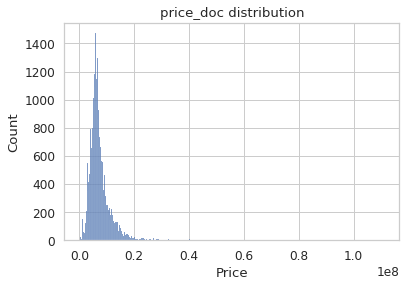

In [319]:
##distribution of target column
# sns.distplot(
#     train['price_doc'], norm_hist=False, kde=False, bins=20, hist_kws={"alpha": 1}
# ).set(xlabel='Sale Price', ylabel='Count');
plt.title("price_doc distribution")
sns.histplot(train['price_doc']).set(xlabel='Price', ylabel='Count');

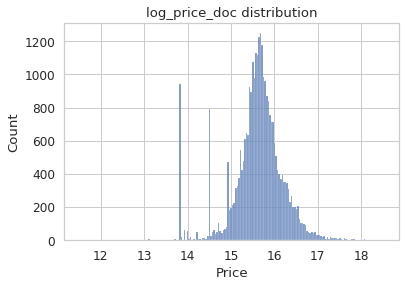

In [320]:
plt.title("log_price_doc distribution")
sns.histplot(x=np.log(train['price_doc'])).set(xlabel='Price', ylabel='Count');

Observation 
   
    The log value look normal distributed 

In [321]:
# try to see the the data where  Sale price is less than 200000rub 
train.loc[train.price_doc<= 200000,"num_room"]

1167     NaN
1169     NaN
20244    2.0
Name: num_room, dtype: float64

Observation
   
      as to my experience in Russian particulary in Moscow it will be hard to find a house even single room less with less 300000 rub

###### Show the relationship between missing values and `sale Price` By plotting barplot graph.

In [322]:
# We first check the percentage of nan values present in each feature 
##1.create list of columns which has missing values
train_columns_with_nan = [ columns for columns in train.columns if train[columns].isnull().sum()!=0]
# print("we have {} of columns with missing values int training set".format(len(train_columns_with_nan)))
##2 columns name and percentage of missing values
# for col in train_columns_with_nan:
#   print(col,np.round(train[col].isnull().mean(),4), '% missing values')
####################################################################
test_columns_with_nan = [col for col in test.columns if test[col].isnull().sum()!=0]

In [323]:
print("we have {} columns with missing values int train set and {} in test set".format(len(train_columns_with_nan),len(test_columns_with_nan)))

we have 57 columns with missing values int train set and 62 in test set


In [324]:
# Assign 1 when there is missing value and 0 is not 
def missing_values_vs_sale_price(train, train_columns_with_nan,rows,cols):
  nrows = rows
  ncols = cols
  fig, axs = plt.subplots(nrows, ncols, figsize=(10,40))
  data = train.copy()
  for r in range(nrows):
    for c in range(ncols):
        i = r*ncols + c
        col = train_columns_with_nan[i]
        #make a varaible that will indicates 1 whether the entries was missing or zero
        data[col] = np.where(data[col].isnull(),1,0)
        #Calculate the mean SalePrice where the information is missing or predicted
        df = pd.DataFrame(data.groupby(col)["price_doc"].median())
        sns.barplot(x=df.index,y=df.price_doc,ax=axs[r,c])
  fig.tight_layout()
  plt.show()

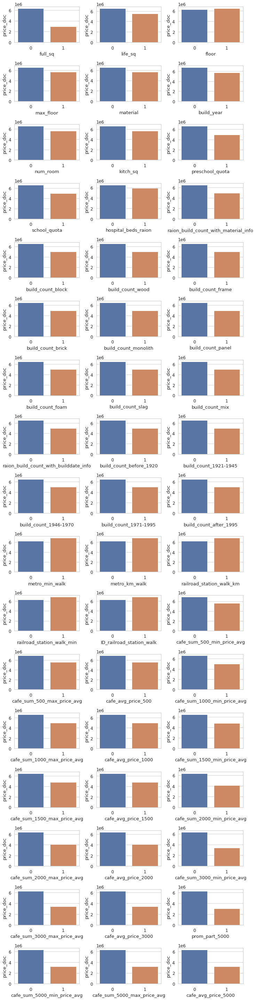

In [325]:
missing_values_vs_sale_price(train, train_columns_with_nan,17,3)

Observation:

    The relation between missing values and the dependent variable(each columns with missing values) is clearly showing by the above graph.
    We can observe that column with prefix metro_  and raill_road_station have more columns entries with missing values than with values
    The process to deal with this missing values will be done in Feature enginerring section. we will look how we can replace these missing values with something meaningful. 

Let's observe relationship of columns by the type

###### Numerical Columns

In [326]:
# list of numercial variable
numerical_cols = [cols for cols in train.columns if train[cols].dtype in ["int64","float64"] and col !="id" ]
print("total numbers of numerical columns in training dataset is {} ".format(len(numerical_cols)))

total numbers of numerical columns in training dataset is 314 


Temporal Variable(Eg: Datetime Variable)




    It seems that in this dataset, beside the `timestamp` column which has date information, we have only one year variable colum which is `build_year`.


In [327]:
# list of columns that contain year information
year_columns = [col for col in numerical_cols if "year" in col or "Yr" in col]

# let's look at the year in this Temporal variable column then,
#try to analyze it an check the relation between build_year and Price_doc 
for year_info in year_columns:
  print(year_columns)
  print(train[year_info].fillna(0).astype("int64").unique())

['build_year']
[   0 1907 1980 2014 1970 1982 2013 2004 2003 1957 1986 1960 1995 1979
 1975 1987 1962 1969 1993 1996 1972 2011 1965 2010 1985 2006 1961 1971
 1978 1966 1967 2000 1964 1977 1983 1968 1974 2008 1959 2007 1984 1976
 1997 1989 1958 1988 2012 1990 1946 1917 2002 2005 2001 1963 1954 1951
 1981 1955 1999 2009 1973 1994 1998 1992 1950 1956 2015 1932 1937 1938
 1939 1991 1934 1935 1947 1953 1933 2016 1930 1912 1929 1928 1915 1936
 1925 1940 1943 1927 1896 1911 1924 1952 2017 1926 1931 1860 1949 1914
 1910 1895 1948 1876 1900 1890 1920 1904 1906 1941 1691 1905 1886 2018]


Observations:

      We realize that some buil_year columns have wrong year information it could be due to typing errors.
      What seem's to be tricky is that some data have buil_year equal to 2017 even 2018 where the data set contains record still 2016.
      Here the question is did they planed to build property in 2017,2018 and fixed the saling price already?

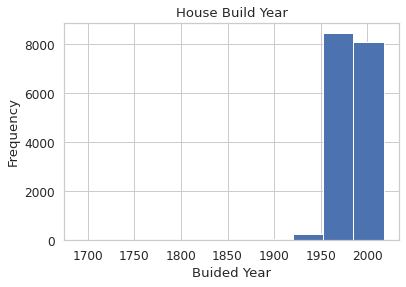

In [328]:
# # Let's Check  the period where most houses or properties were build
df = train.copy()#[train.build_year.notnull()]
df = df[(df.build_year.fillna(2000).astype("int64")>=1000) & (df.build_year.fillna(2000).astype("int64")< 2020) ]
df["build_year"].plot(kind='hist')
plt.xlabel("Buided Year")
plt.title("House Build Year");

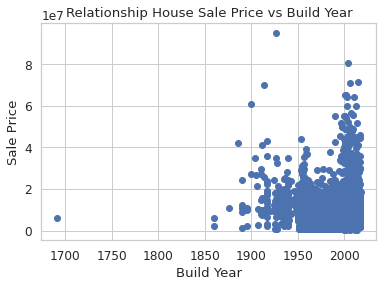

In [329]:
# Lets try to use scatter plot type to see the relationship between features build_year and price_doc
plt.scatter(df["build_year"],df["price_doc"])
plt.xlabel("Build Year")
plt.ylabel("Sale Price")
plt.title("Relationship House Sale Price vs Build Year");
plt.show()  

Observations:
      
      .Most of the recroded data properties were build during late 20th- 21th century.
      .High density of properties from around 1910-2018+, having an outliers which waht build before 1700 and most expensive property which is 8*1e7
      

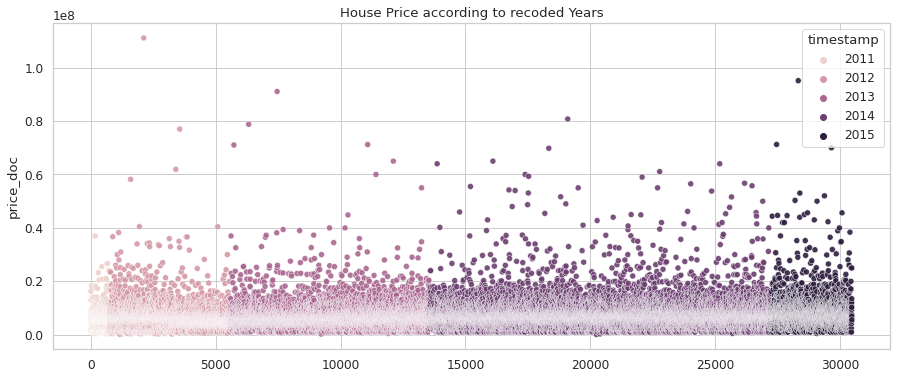

In [330]:
# recoderd year vs price
plt.figure(figsize=(15,6))
sns.scatterplot(x=train.index,y=train.price_doc,hue=train.timestamp.dt.year,alpha=0.9);#train.price_doc
plt.title("House Price according to recoded Years")
plt.show()

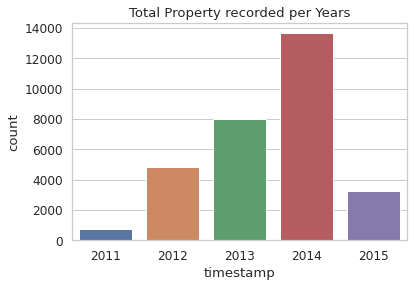

In [331]:
plt.title("Total Property recorded per Years")
sns.countplot(x=train.timestamp.dt.year);

Observations:

    .Most of the price appear to be less than 0.2*10e8
    .We can see mention that 2014 have more entries than others years

Continous and Discrete Variable

    1. Discrete variables

In [332]:
discrete_cols = [col for col in numerical_cols if len(train[col].unique())<20 and col not in year_columns+["id"]]
print("total of discrete columns is {} ".format(len(discrete_cols)))

total of discrete columns is 57 


In [333]:
train[discrete_cols].head()

,material,num_room,state,preschool_education_centers_raion,school_education_centers_raion,school_education_centers_top_20_raion,healthcare_centers_raion,university_top_20_raion,additional_education_raion,culture_objects_top_25_raion,shopping_centers_raion,build_count_foam,build_count_mix,ID_railroad_terminal,ID_bus_terminal,trc_count_500,cafe_count_500_na_price,cafe_count_500_price_4000,cafe_count_500_price_high,big_church_count_500,church_count_500,mosque_count_500,leisure_count_500,sport_count_500,market_count_500,trc_count_1000,cafe_count_1000_price_high,mosque_count_1000,market_count_1000,cafe_count_1500_price_high,mosque_count_1500,market_count_1500,cafe_count_2000_price_high,mosque_count_2000,market_count_2000,mosque_count_3000,market_count_3000,mosque_count_5000,gdp_quart,gdp_quart_growth,gdp_deflator,balance_trade_growth,gdp_annual,gdp_annual_growth,average_provision_of_build_contract,average_provision_of_build_contract_moscow,real_dispos_income_per_cap_growth,salary,salary_growth,divorce_rate,mortality,housing_fund_sqm,lodging_sqm_per_cap,load_of_teachers_school_per_teacher,seats_theather_rfmin_per_100000_cap,apartment_build,apartment_fund_sqm
0,NaN,NaN,0.0,5.0,5.0,0.0,1.0,0.0,3.0,0.0,16.0,0.0,0.0,101.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,3.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,14313.7,3.3,86.721,10.1,46308.5,0.045037,5.76,6.74,-0.005,44898.7,0.168917,3.8,9.7,218.0,18.772066,1391.710938,0.45356,23587.0,230310.0
1,NaN,NaN,0.0,5.0,8.0,0.0,1.0,0.0,1.0,1.0,3.0,0.0,0.0,32.0,2.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,14313.7,3.3,86.721,10.1,46308.5,0.045037,5.76,6.74,-0.005,44898.7,0.168917,3.8,9.7,218.0,18.772066,1391.710938,0.45356,23587.0,230310.0
2,NaN,NaN,0.0,4.0,7.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,5.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,5.0,0.0,0.0,5.0,0.0,6.0,0.0,14313.7,3.3,86.721,10.1,46308.5,0.045037,5.76,6.74,-0.005,44898.7,0.168917,3.8,9.7,218.0,18.772066,1391.710938,0.45356,23587.0,230310.0
3,NaN,NaN,0.0,9.0,10.0,0.0,1.0,0.0,6.0,0.0,11.0,0.0,2.0,83.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0,0.0,2.0,0.0,3.0,0.0,14313.7,3.3,86.721,10.1,46308.5,0.045037,5.76,6.74,-0.005,44898.7,0.168917,3.8,9.7,218.0,18.772066,1391.710938,0.45356,23587.0,230310.0
4,NaN,NaN,0.0,7.0,9.0,0.0,4.0,2.0,2.0,0.0,10.0,0.0,1.0,113.0,4.0,1.0,3.0,0.0,0.0,1.0,4.0,0.0,2.0,3.0,0.0,3.0,1.0,0.0,0.0,1.0,0.0,2.0,1.0,0.0,3.0,1.0,5.0,2.0,14313.7,3.3,86.721,10.1,46308.5,0.045037,5.76,6.74,-0.005,44898.7,0.168917,3.8,9.7,218.0,18.772066,1391.710938,0.45356,23587.0,230310.0


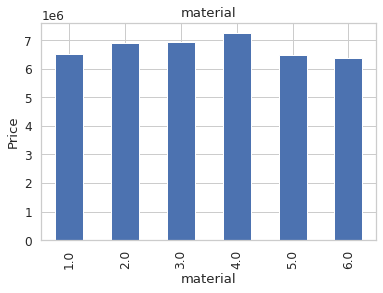

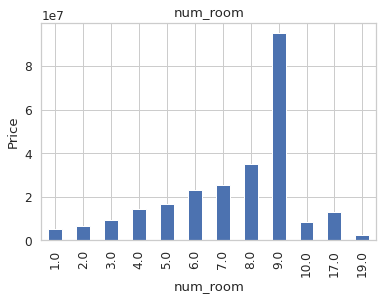

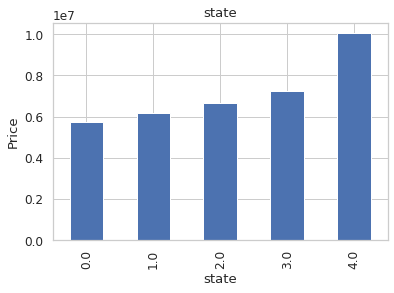

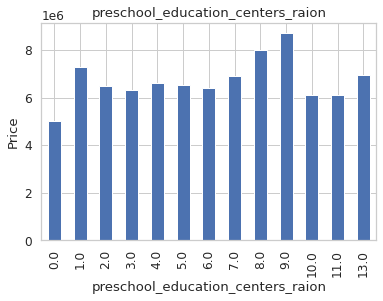

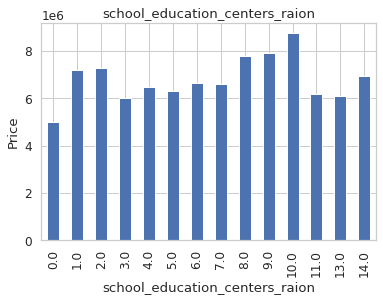

...

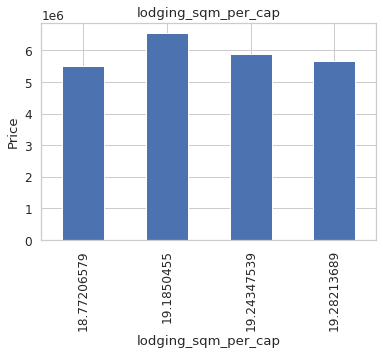

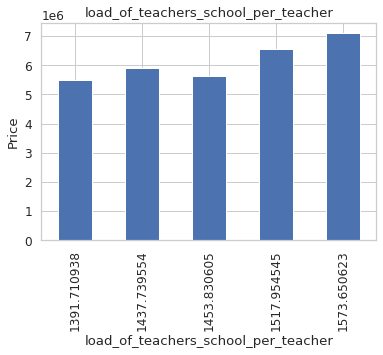

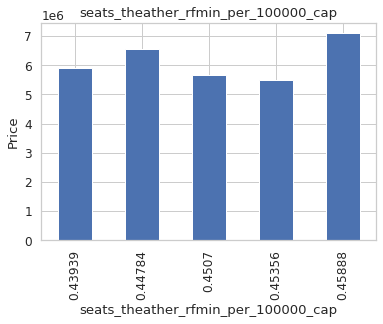

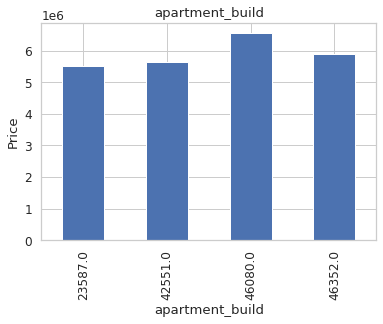

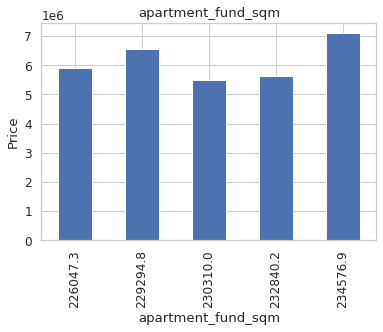

In [334]:
# Find the relationship between discret columns and Price doc(Sale Price)

for col in discrete_cols:
  df = train.copy()
  df.groupby(col)["price_doc"].median().plot.bar()
  plt.xlabel(col)
  plt.ylabel("Price")
  plt.title(col)
  plt.show()

Observations:

    . num_room : price decline when num_room is more than 10 which is abnormal.
    . price increase as salaries are getting higher that is normal  

     2. Continous Variables

In [335]:
continous_cols = [col for col in numerical_cols if col not in discrete_cols+year_columns+["id"]]
print("Total continous columns is {}".format(len(continous_cols)))

Total continous columns is 255


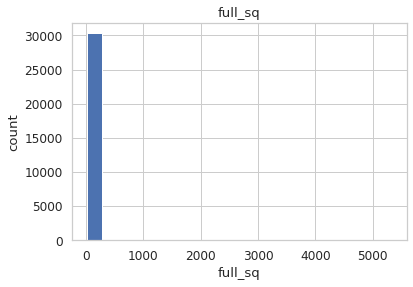

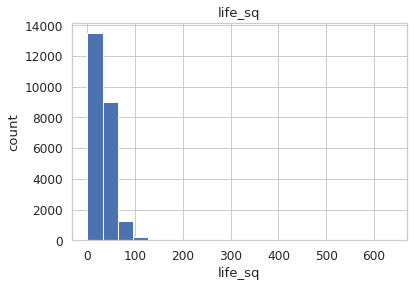

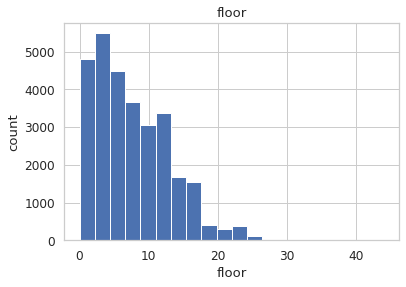

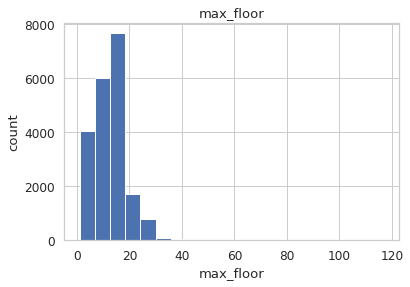

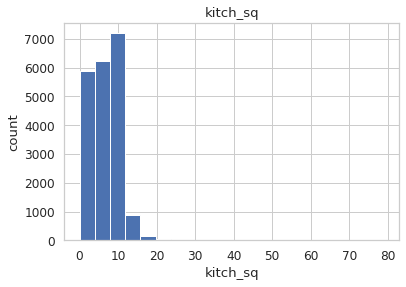

...

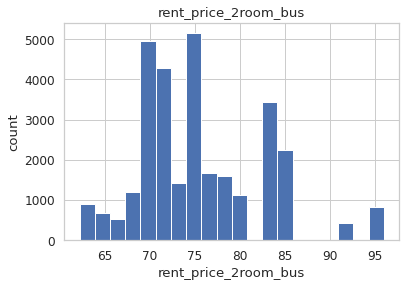

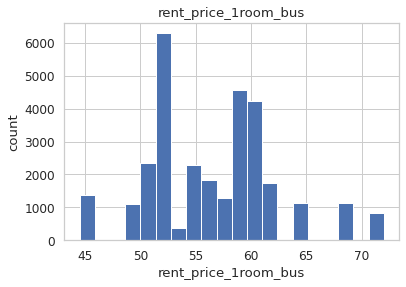

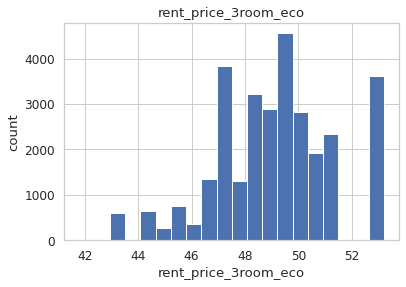

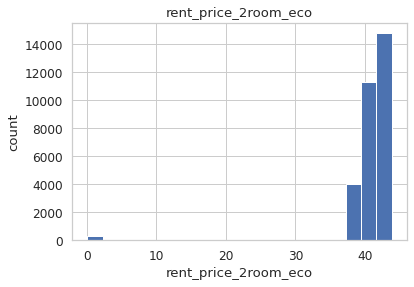

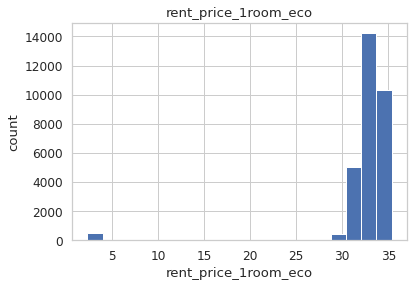

In [336]:
# Analyse the continous values by creatins histogram to understand the distribution
for col in continous_cols:
  df = train.copy()
  df[col].hist(bins=20)
  plt.xlabel(col)
  plt.ylabel("count")
  plt.title(col)
  plt.show()


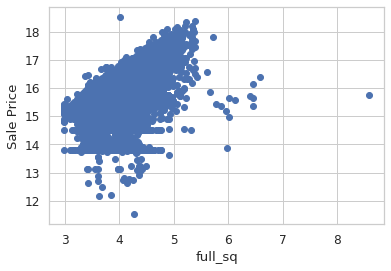

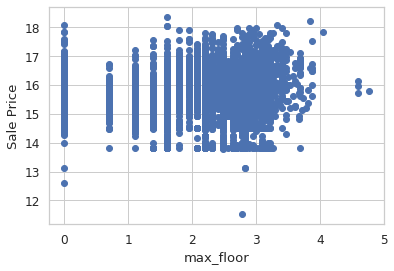

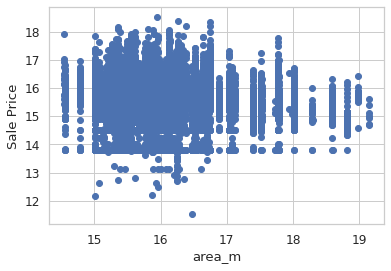

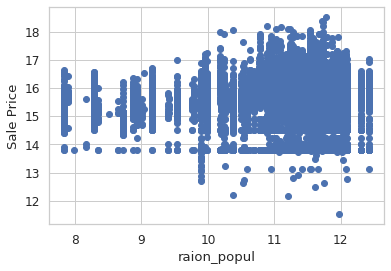

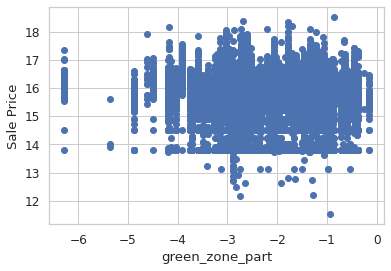

...

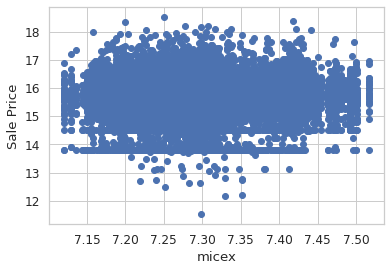

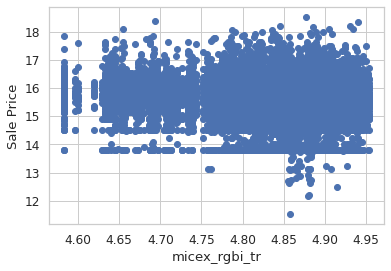

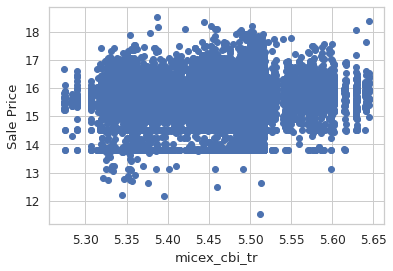

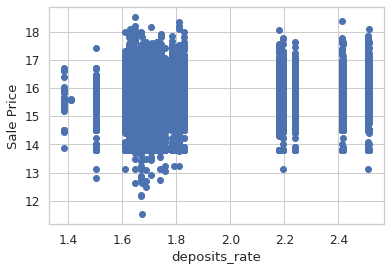

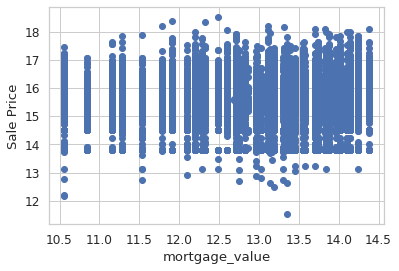

/usr/local/lib/python3.7/dist-packages/pandas/core/arraylike.py:364: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


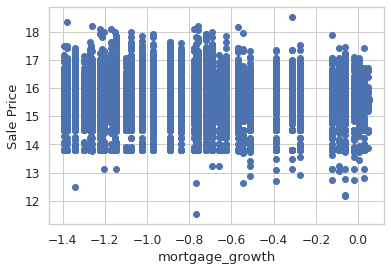

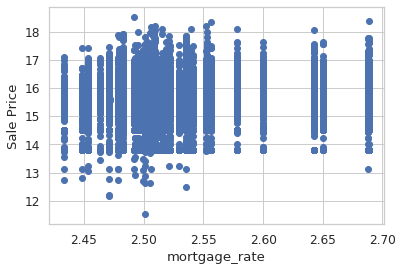

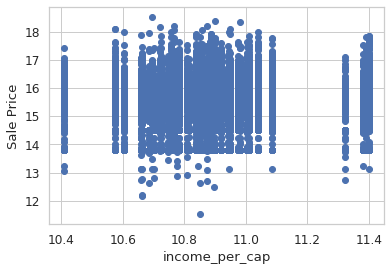

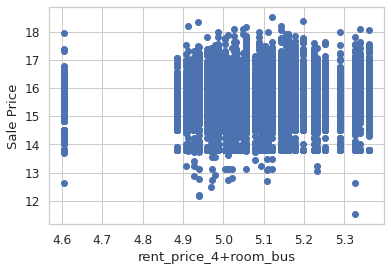

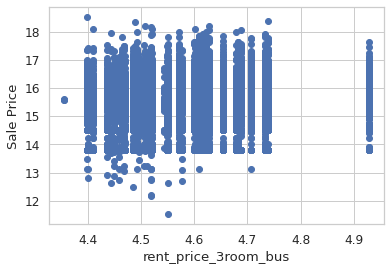

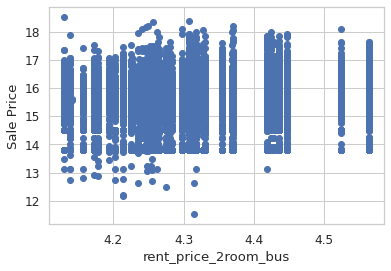

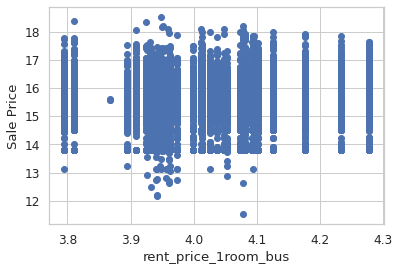

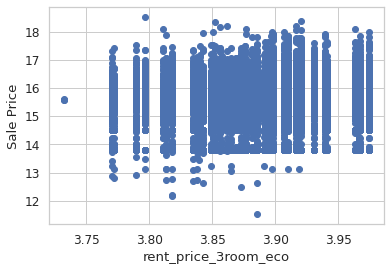

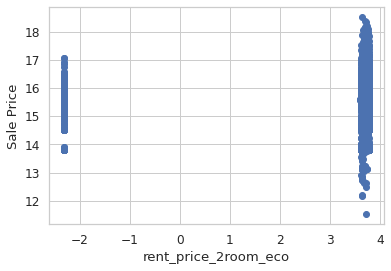

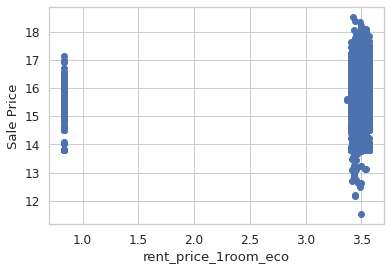

In [337]:
# let's see the same relationship apply log 
for col in continous_cols:
  df= train.copy()
  if 0 in df[col].unique():

    pass
  else:
    df[col] = np.log(df[col])
    df["price_doc"] = np.log(df["price_doc"])
    plt.scatter(df[col],df["price_doc"])
    plt.xlabel(col)
    plt.ylabel("Sale Price")
    plt.show()

Observations:

    Scatter plot also gave us a good visualization for on relatoionship between columns and price

###### Outliers

values outside a particular range are calle outliers, mostly in Machine Learning we use boxplot for better visualization

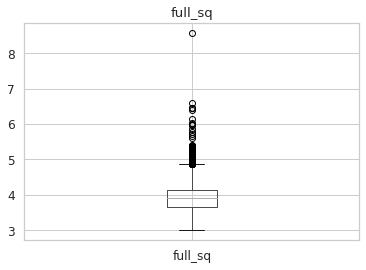

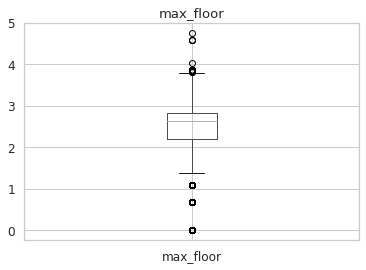

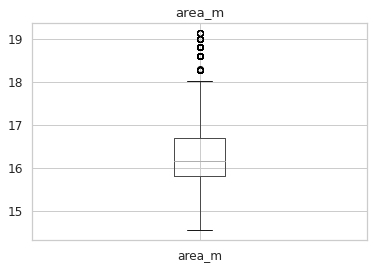

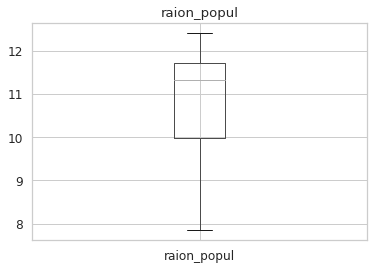

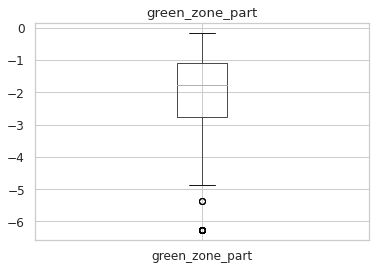

...

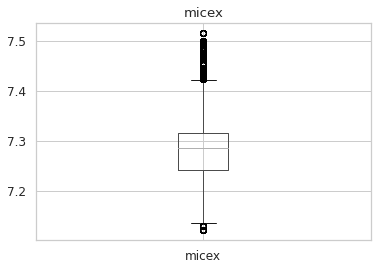

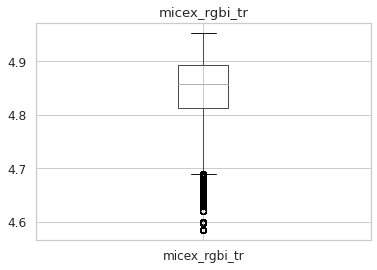

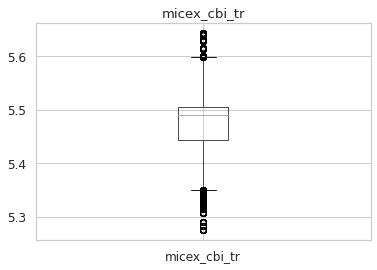

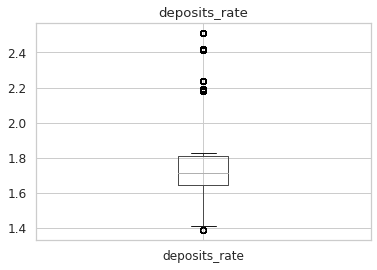

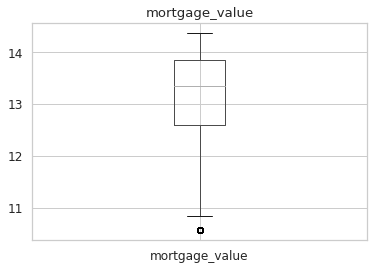

/usr/local/lib/python3.7/dist-packages/pandas/core/arraylike.py:364: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


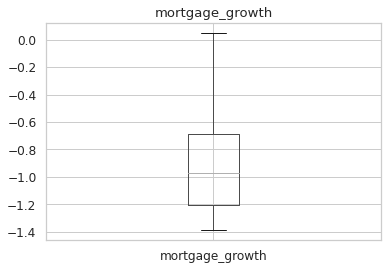

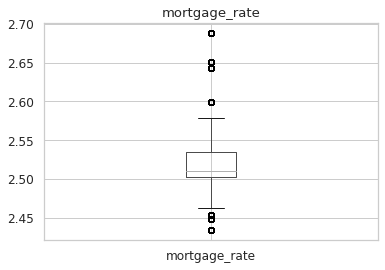

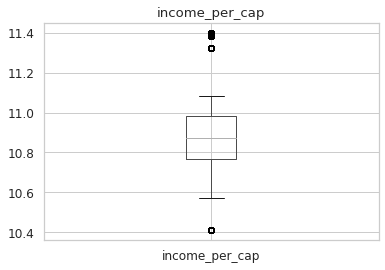

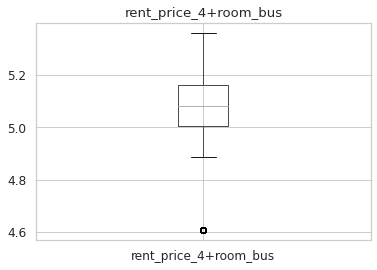

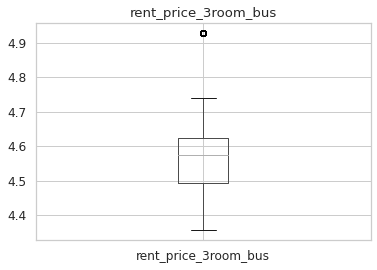

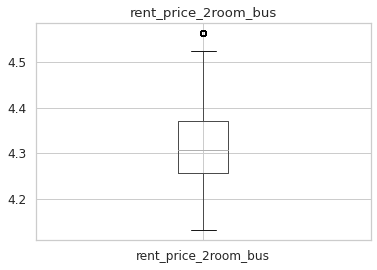

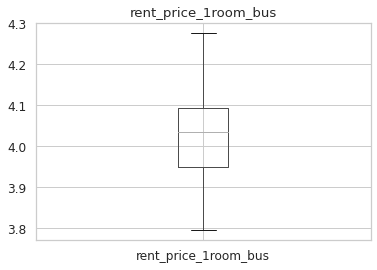

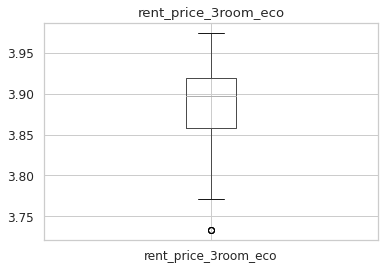

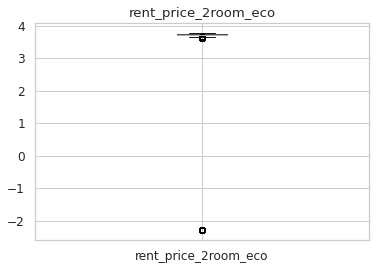

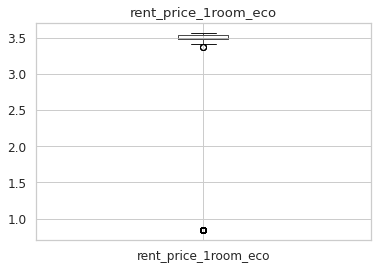

In [338]:
# let's see outlier the same relationship apply log 
for col in continous_cols:
  df= train.copy()
  if 0 in df[col].unique():

    pass
  else:
    # df[col] = df[col]
    df[col] = np.log(df[col])
   
    df.boxplot(column=col)
    # plt.ylabel(col)
    plt.title(col)
    plt.show()

Observations:
         
         from the above boxplot we can see that there is a lot of columns with outliers.
         balance_trade doesnt, mortgage_worth,mortgage value, cafe_sum_500_min_price_avg,ID_big_road2,ID_big_road1,ID_railroad_station_avto,0_17_female,0_17_male,7_14_female,7_14_all.. have less outliers.

###### Categorical Varaibles

In [339]:
categorical_cols = [col for col in train.columns if train[col].dtypes=="object"]
print("Total of categorical columns is {} ".format(len(categorical_cols)))
train[categorical_cols].head()

Total of categorical columns is 16 


,product_type,sub_area,culture_objects_top_25,thermal_power_plant_raion,incineration_raion,oil_chemistry_raion,radiation_raion,railroad_terminal_raion,big_market_raion,nuclear_reactor_raion,detention_facility_raion,water_1line,big_road1_1line,railroad_1line,ecology,child_on_acc_pre_school
0,Investment,Bibirevo,no,no,no,no,no,no,no,no,no,no,no,no,good,#!
1,Investment,Nagatinskij Zaton,yes,no,no,no,no,no,no,no,no,no,no,no,excellent,#!
2,Investment,Tekstil'shhiki,no,no,no,no,yes,no,no,no,no,no,no,no,poor,#!
3,Investment,Mitino,no,no,no,no,no,no,no,no,no,no,no,no,good,#!
4,Investment,Basmannoe,no,no,no,no,yes,yes,no,no,no,no,no,yes,excellent,#!


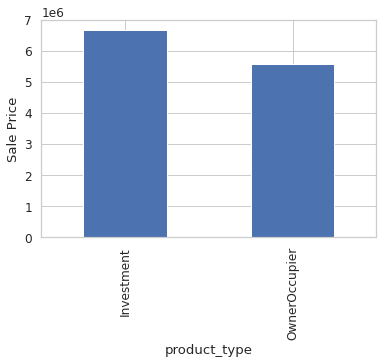

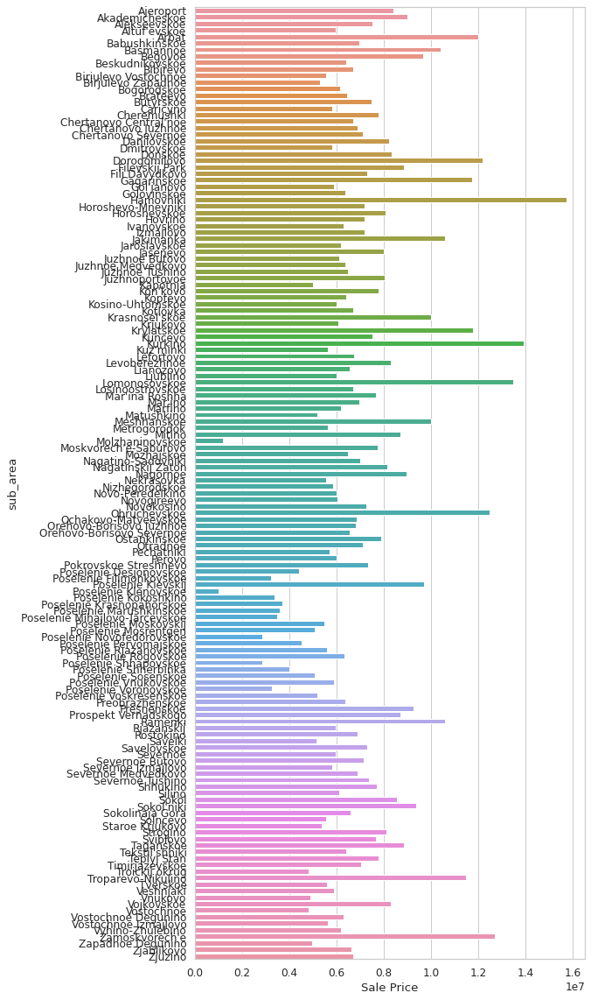

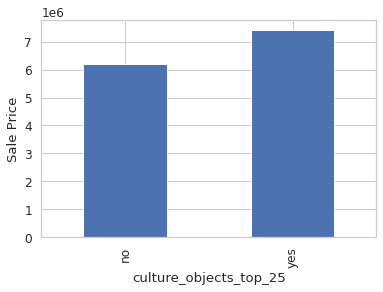

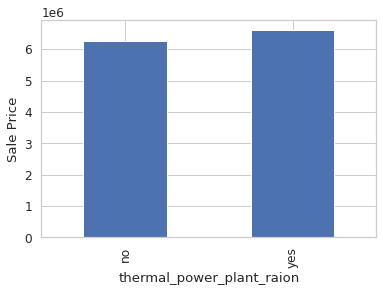

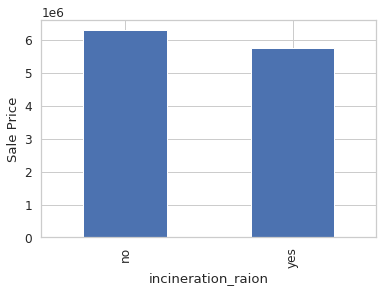

...

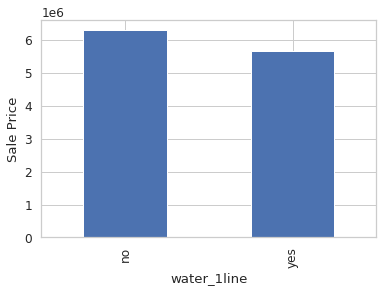

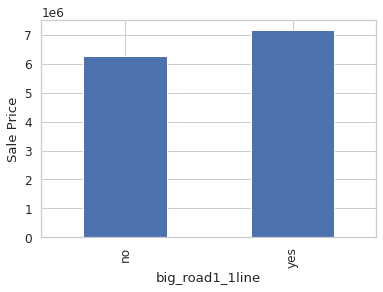

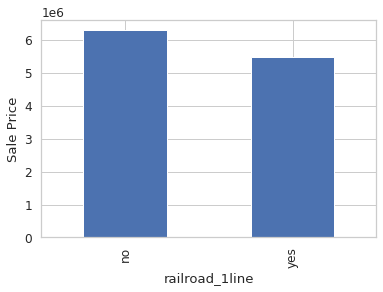

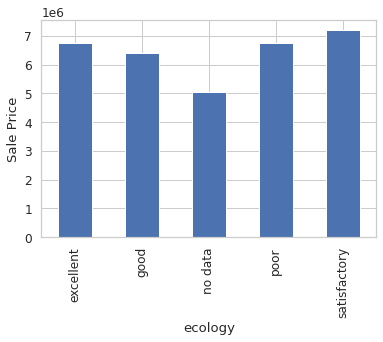

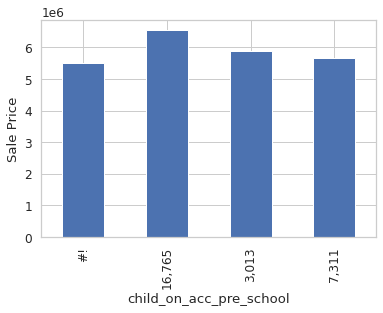

In [340]:
# ralationship between categorical and dependent features(target or y)
for col in categorical_cols:
  df = train.copy()
  if col == 'sub_area':
    plt.figure(figsize=(8,20))
    df1 = pd.DataFrame(df.groupby(col)['price_doc'].median())
    # print(df1)
    sns.barplot(x=df1['price_doc'],y=df1.index)
    plt.ylabel(col)
    plt.xlabel('Sale Price')
    plt.show()
  else:
    df.groupby(col)['price_doc'].median().plot.bar()
    plt.xlabel(col)
    plt.ylabel('Sale Price')
    plt.show()


Observations:
  
    The median Prices on investments are higher than on OwnerOccuper
    There are satisfactory ecology place where price are higher than excellent ecology places? 
    same for poor ecology which has higher price than good ecology places?
    

In [341]:
cheapest = train.sort_values(by="price_doc").head(20)
print(cheapest[['sub_area','price_doc',"num_room"]])
train.loc[(train.sub_area=="Gol'janovo") & (train.num_room==1),"price_doc"].sort_values()

                sub_area  price_doc  num_room
20244         Gol'janovo     100000       2.0
1167     Beskudnikovskoe     190000       NaN
1169             Savelki     200000       NaN
9221    Novo-Peredelkino     260000       NaN
3258            Caricyno     300000       NaN
20388          Rostokino     301693       1.0
2677          Nekrasovka     331464       NaN
1596          Nekrasovka     338570       NaN
634           Matushkino     340000       NaN
1262              Mitino     354289       NaN
216         Obruchevskoe     360000       NaN
2748          Nekrasovka     395685       NaN
1960            Krjukovo     410000       NaN
854           Nekrasovka     472249       NaN
2568          Nekrasovka     476902       NaN
1488        Horoshevskoe     500000       NaN
29061    Severnoe Butovo     500000       1.0
11923            Mar'ino     500000       3.0
2073   Nagatinskij Zaton     500000       NaN
25695     Troickij okrug     500000       1.0


17377     990000
22349     990000
18875     990000
24814    1000000
27001    1000000
          ...   
14842    6700000
18997    6800000
25622    6900000
19749    7000000
14392    8000000
Name: price_doc, Length: 75, dtype: int64

Observations:

    There should be a mistake having a 2 room property with 100000 cost in Moscow Region where in that same region property with 1 room cheapest price is 990000?

In [342]:
# [train[col].value_counts() for col in categorical_cols]
for col in categorical_cols:
  print("column  {}  have {}  cardinality".format(col,len(train[col].unique())))

column  product_type  have 2  cardinality
column  sub_area  have 146  cardinality
column  culture_objects_top_25  have 2  cardinality
column  thermal_power_plant_raion  have 2  cardinality
column  incineration_raion  have 2  cardinality
column  oil_chemistry_raion  have 2  cardinality
column  radiation_raion  have 2  cardinality
column  railroad_terminal_raion  have 2  cardinality
column  big_market_raion  have 2  cardinality
column  nuclear_reactor_raion  have 2  cardinality
column  detention_facility_raion  have 2  cardinality
column  water_1line  have 2  cardinality
column  big_road1_1line  have 2  cardinality
column  railroad_1line  have 2  cardinality
column  ecology  have 5  cardinality
column  child_on_acc_pre_school  have 5  cardinality


##### Observations

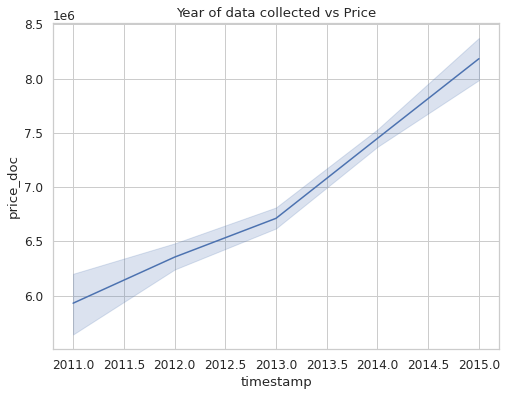

In [343]:
plt.figure(figsize=(8,6))
sns.lineplot(data=train,x=train.timestamp.dt.year,y='price_doc')
plt.title("Year of data collected vs Price");

Observation 

    Properties prices increase gradualy over the years of data collection.

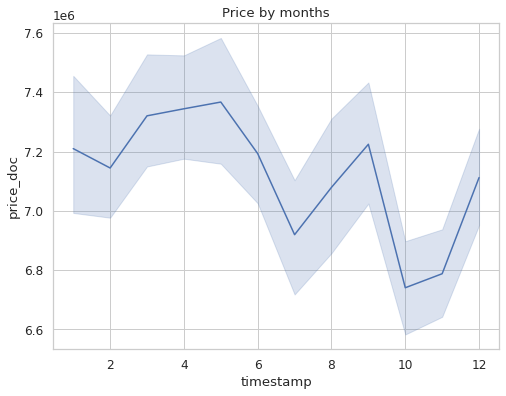

In [344]:
plt.figure(figsize=(8,6))
sns.lineplot(data=train,x=train.timestamp.dt.month,y=train.price_doc)
plt.title("Price by months");

Observations
    
    Properties prices seems to be lower during october(automn) and higher during may(sprint).

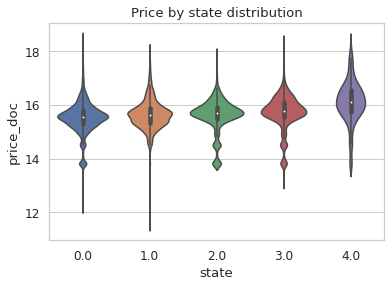

In [345]:
plt.title("Price by state distribution")
sns.violinplot(y=np.log(train.price_doc),x=train.state);

In [346]:
np.round((train.groupby("state")["price_doc"]).mean(),2)

state
0.0     6479555.75
1.0     7315439.84
2.0     7060064.10
3.0     8078474.99
4.0    13345468.81
Name: price_doc, dtype: float64

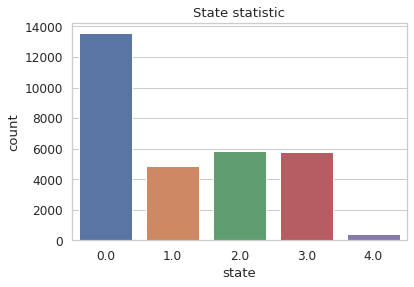

In [347]:
plt.title("State statistic")
sns.countplot(x=train['state']);

Observations:

    From the above 3 graph what we can observe respectively is :
     .(violin) state 4 have the highest price with less spread or density or less propertis(countplot)
     .state  0 have the highest number of properties with the less average prices

##### Features Correlation by 

1. Demographic
2. Education
3. Insfrastructure
4. Size
5. 

In [348]:
jovian.commit()

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...
Committed successfully! https://jovian.ai/landryroni/ml-project-gbms


'https://jovian.ai/landryroni/ml-project-gbms'

#### Feature Engineering

    Here are work that can be achieving during features engineering:
     1. Creating new features(columns) by transformin/combining existing features
     2. Adding or incorporating external sources

In [1089]:
# train["price_doc"] = np.log(train["price_doc"])

##### Extracting columns 

In [1090]:
train.isnull().sum()

id                                        0
timestamp                                 0
full_sq                                   0
life_sq                                6379
floor                                  1117
                                       ... 
rent_price_3room_eco                      0
rent_price_2room_eco                      0
rent_price_1room_eco                      0
load_of_teachers_school_per_teacher       0
seats_theather_rfmin_per_100000_cap       0
Length: 323, dtype: int64

    1.Creating new columns by extracting year, month, quarter..week form timestamp coulmn

In [1091]:
#before fixind the missing values let's create year, month, week data
def date_features(train):
  df = train.copy()
  df['year'] = df.timestamp.dt.year
  df['month'] = df.timestamp.dt.month
  df['quarter'] = df.timestamp.dt.quarter
  df['week'] = df.timestamp.dt.isocalendar().week 
  df["weekofyear"]= df.timestamp.dt.weekofyear
  df['dayofweek'] = df.timestamp.dt.dayofweek
  df = df.drop('timestamp',axis=1)
  return df 
####################################

In [1092]:
train = date_features(train)
test = date_features(test)
print("created year, month , week on data set. done")

created year, month , week on data set. done


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  


In [1093]:
jovian.commit()

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...
Committed successfully! https://jovian.ai/landryroni/ml-project-gbms


'https://jovian.ai/landryroni/ml-project-gbms'

##### Ratio

In [1094]:
##define ratio function its will help calculating ratio 
def ratio(data):
  #Here we find the ratio between floor and max_flooor, kitch and full_square,life_square and full_square
  #life_square and numroom
  df = data.copy()
  ##Ratio on living Area
  df["ratio_floor"] = df["floor"]/df["max_floor"].astype(float)
  df["area_kitch_sq"] = df["kitch_sq"]/df["full_sq"].astype(float)
  df["area_life_sq"] = df["life_sq"]/df["full_sq"].astype(float)
  df["room_size"] = (df["life_sq"]- df["kitch_sq"]) /df["num_room"].astype(float)

  # Ratio on demography
  df["population_density"] = df.raion_popul / df.area_m.astype(float)
  df["health_center_density"] = df.healthcare_centers_raion/df.raion_popul.astype(float)

  return df 

In [1095]:
train = ratio(train)
test = ratio(test)

##### Diffrence between related features

In [1096]:
#
def diff_relation(data):
  df = data.copy()
  # # num of floor on top
  df["floor_on_top"] = df["max_floor"] - df["floor"]
  # num of floor down
  df["floor_down"] = df["max_floor"] - (df["floor_on_top"]+1)
  
  df["remain_sq"] = (df["full_sq"] - df["life_sq"])#.apply(lambda x:0 if x<0 else x)
  df["remain_living_area"] = (df["life_sq"]- df["kitch_sq"])#.apply(lambda x:np.NaN if x<0 else x)
  df["age_of_property_when_record"] = df["year"] - df["build_year"]
  df["build_year"] = df["build_year"].max() - df["build_year"]
  return df

In [1097]:
train = diff_relation(train)
test = diff_relation(test)
print("difference relation between features : done")

difference relation between features : done


In [1098]:
train

,id,full_sq,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,state,product_type,sub_area,area_m,raion_popul,green_zone_part,indust_part,children_preschool,preschool_quota,preschool_education_centers_raion,children_school,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,hospital_beds_raion,healthcare_centers_raion,university_top_20_raion,sport_objects_raion,additional_education_raion,culture_objects_top_25,culture_objects_top_25_raion,shopping_centers_raion,office_raion,thermal_power_plant_raion,incineration_raion,oil_chemistry_raion,radiation_raion,railroad_terminal_raion,big_market_raion,nuclear_reactor_raion,detention_facility_raion,...,gdp_annual,gdp_annual_growth,average_provision_of_build_contract,average_provision_of_build_contract_moscow,micex,micex_rgbi_tr,micex_cbi_tr,deposits_rate,mortgage_value,mortgage_growth,mortgage_rate,income_per_cap,salary,mortality,rent_price_4+room_bus,rent_price_3room_bus,rent_price_2room_bus,rent_price_1room_bus,rent_price_3room_eco,rent_price_2room_eco,rent_price_1room_eco,load_of_teachers_school_per_teacher,seats_theather_rfmin_per_100000_cap,year,month,quarter,week,weekofyear,dayofweek,ratio_floor,area_kitch_sq,area_life_sq,room_size,population_density,health_center_density,floor_on_top,floor_down,remain_sq,remain_living_area,age_of_property_when_record
0,1,43.0,27.0,4.0,NaN,NaN,NaN,NaN,NaN,0.0,Investment,Bibirevo,6.407578e+06,155572.0,0.189727,0.000070,9576.0,5001.0,5.0,10309.0,11065.0,5.0,0.0,240.0,1.0,0.0,7.0,3.0,no,0.0,16.0,1.0,no,no,no,no,no,no,no,no,...,46308.5,0.045037,5.76,6.74,1438.74,131.16,204.78,4.10,323275,1.051914,11.84,42688.6,44898.7,9.70,136.11,77.93,62.89,47.85,41.80,36.77,29.07,1391.710938,0.45356,2011,8,3,33,33,5,NaN,NaN,0.627907,NaN,0.024279,0.000006,NaN,NaN,16.0,NaN,NaN
1,2,34.0,19.0,3.0,NaN,NaN,NaN,NaN,NaN,0.0,Investment,Nagatinskij Zaton,9.589337e+06,115352.0,0.372602,0.049637,6880.0,3119.0,5.0,7759.0,6237.0,8.0,0.0,229.0,1.0,0.0,6.0,1.0,yes,1.0,3.0,0.0,no,no,no,no,no,no,no,no,...,46308.5,0.045037,5.76,6.74,1444.11,131.45,204.92,4.10,323275,1.051914,11.84,42688.6,44898.7,9.70,136.11,77.93,62.89,47.85,41.80,36.77,29.07,1391.710938,0.45356,2011,8,3,34,34,1,NaN,NaN,0.558824,NaN,0.012029,0.000009,NaN,NaN,15.0,NaN,NaN
2,3,43.0,29.0,2.0,NaN,NaN,NaN,NaN,NaN,0.0,Investment,Tekstil'shhiki,4.808270e+06,101708.0,0.112560,0.118537,5879.0,1463.0,4.0,6207.0,5580.0,7.0,0.0,1183.0,1.0,0.0,5.0,1.0,no,0.0,0.0,1.0,no,no,no,yes,no,no,no,no,...,46308.5,0.045037,5.76,6.74,1458.84,131.08,204.84,4.10,323275,1.051914,11.84,42688.6,44898.7,9.70,136.11,77.93,62.89,47.85,41.80,36.77,29.07,1391.710938,0.45356,2011,8,3,34,34,5,NaN,NaN,0.674419,NaN,0.021153,0.000010,NaN,NaN,14.0,NaN,NaN
3,4,89.0,50.0,9.0,NaN,NaN,NaN,NaN,NaN,0.0,Investment,Mitino,1.258354e+07,178473.0,0.194703,0.069753,13087.0,6839.0,9.0,13670.0,17063.0,10.0,0.0,NaN,1.0,0.0,17.0,6.0,no,0.0,11.0,4.0,no,no,no,no,no,no,no,no,...,46308.5,0.045037,5.76,6.74,1551.58,131.45,205.42,4.00,386388,1.049543,11.92,40311.3,44898.7,9.70,155.22,94.02,66.28,51.15,44.25,37.73,30.63,1391.710938,0.45356,2011,9,3,35,35,3,NaN,NaN,0.561798,NaN,0.014183,0.000006,NaN,NaN,39.0,NaN,NaN
4,5,77.0,77.0,4.0,NaN,NaN,NaN,NaN,NaN,0.0,Investment,Basmannoe,8.398461e+06,108171.0,0.015234,0.037316,5706.0,3240.0,7.0,6748.0,7770.0,9.0,0.0,562.0,4.0,2.0,25.0,2.0,no,0.0,10.0,93.0,no,no,no,yes,yes,no,no,no,...,46308.5,0.045037,5.76,6.74,1492.83,131.19,198.24,4.00,386388,1.049543,11.92,40311.3,44898.7,9.70,155.22,94.02,66.28,51.15,44.25,37.73,30.63,1391.710938,0.45356,2011,9,3,36,36,0,NaN,NaN,1.000000,NaN,0.012880,0.000037,NaN,NaN,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30466,30469,44.0,27.0,7.0,9.0,1.0,43.0,2.0,6.0,3.0,Investment,O

    5.Create a product_type_sub_area categorical columh

In [1099]:
#
def fusion_pro_sub(data):
  df = data.copy()
  #
  df["product_type_by_sub_area"] = df["product_type"] +"_"+ df["sub_area"]
  return df

In [1100]:
# train = fusion_pro_sub(train)
# test = fusion_pro_sub(test)

    Transfroming full_sq as he has big impact on other

In [1101]:
# category = [""]
def transform_full_sq(data):
  df = data.copy()
  for col in ["life_sq","floor","max_floor",	"build_year","num_room","kitch_sq","state","sub_area","area_m"]:#material,product_type
    df["full_sq_"+col]= (df["full_sq"]/ df.groupby(col)["full_sq"].transform("mean"))
  
  return df

In [1102]:
train = transform_full_sq(train)
test = transform_full_sq(test)
print("Transform done")

Transform done


In [1103]:
jovian.commit()

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...
Committed successfully! https://jovian.ai/landryroni/ml-project-gbms


'https://jovian.ai/landryroni/ml-project-gbms'

##### Feature Correlation

    Let's see the correlation between others feature and target `price_doc`

In [1149]:
feature_corr = train.corr()['price_doc'].sort_values(ascending=False)
features_df = feature_corr.reset_index().rename(columns={"index":"features","price_doc":"correlation"})
selected_col_1 = features_df[features_df.correlation>0]
print(len(selected_col_1))
selected_col_1 = [col for col in selected_col_1.features if col not in ["price_doc","id"]]
selected_col_1

239


['full_sq_build_year',
 'full_sq_max_floor',
 'full_sq',
 'full_sq_state',
 'full_sq_floor',
 'full_sq_area_m',
 'full_sq_sub_area',
 'full_sq_kitch_sq',
 'num_room',
 'life_sq',
 'remain_living_area',
 'remain_sq',
 'full_sq_num_room',
 'sport_count_5000',
 'sport_count_3000',
 'trc_count_5000',
 'sport_count_2000',
 'full_sq_life_sq',
 'office_sqm_5000',
 'sport_count_1500',
 'trc_sqm_5000',
 'kitch_sq',
 'sport_objects_raion',
 'trc_count_3000',
 'cafe_count_5000_price_1000',
 'cafe_count_5000_price_1500',
 'cafe_count_5000',
 'cafe_count_5000_na_price',
 'cafe_count_5000_price_500',
 'office_sqm_3000',
 'cafe_count_5000_price_2500',
 'trc_sqm_3000',
 'office_count_5000',
 'office_sqm_2000',
 'church_count_5000',
 'cafe_count_5000_price_high',
 'sport_count_1000',
 'cafe_count_5000_price_4000',
 'leisure_count_5000',
 'big_church_count_5000',
 'office_sqm_1500',
 'market_count_5000',
 'school_education_centers_raion',
 'office_count_500',
 'trc_count_2000',
 'healthcare_centers_raio

##### Dealing with Nan values(not use)

In [1105]:
# ## Let us go through all categoricalnan values
# def handling_cat(data):
#   df = data.copy()
#   #categorical columns which are missing
#   cat_columns_nan = [col for col in df.columns if df[col].isnull().sum()!=0 and df[col].dtypes=="object"]
#   for col in cat_columns_nan:
#     print("{} : {} missing values ".format(col,np.round(df[col].isnull().mean(),4)))
#   return cat_columns_nan
# ###########################
# ##replace missing values with a new label
# def replace_cat_colum(data,cat_columns_nan):
#   df = data.copy()
#   print("fill nan column values with Unknown")
#   df[cat_columns_nan]=df[cat_columns_nan].fillna("Unknown")
#   return df

# ##handling categorical
# def handling_Categorical_missing_values(data):
#    cat_columns_nan = handling_cat(data)
#    df = replace_cat_colum(data,cat_columns_nan)
#    #check if still have nan values
#    print("any missing values still excisting?:",df[cat_columns_nan].isnull().sum())
#    return df

In [1106]:
# print("fixing training set categorical handling")
# ###########################################################
# train__ = handling_Categorical_missing_values(train)
# print("fixing testing set categorical handling")
# test__ = handling_Categorical_missing_values(test)

###### Numerical features

In [1107]:
# ## now Lets deal for numerical columns containing nan values
# #######################
# #reaplcing missing values with mean and creating a nan_feature_column fro the corresponding column
# # check numerical columns with missing values
# def numerical_missing_columns(data):
#   df = data.copy()
#   num_columns_nan = [col for col in df.columns if df[col].isnull().sum()!=0 and df[col].dtype in ["int64","float64"]]
#   for col in num_columns_nan:
#     print("{} : {} missing values".format(col,np.round(df[col].isnull().mean(),4)))
#   return num_columns_nan

# def fill_missing_values(data,num_columns_nan):
#   df = data.copy()
#   ## replace numerical missing values 
#   for col in num_columns_nan:
#     ## let first replace by using median since we realize there are outliers
#     ##when never having outliers better replace the missing values with median or mode not mean
#     median = df[col].median()
#     #create a new feature that will help to capture nan values
#     df[col+'nan']=np.where(df[col].isnull(),1,0)# the main purpose of doing this is to get some more information,its a very got way,practice
#     # # Here the meaning is simple if that column have missing value replace with median but in newly above created notice that it was nan values by adding 1
#     # df[col].fillna(median,inplace=True)
#   #Les's check if still have missing numerical columns values
#   print("check if still any missing values:",df[num_columns_nan].isnull().sum())
#   return df

# def numerical_features_handling(data):
#     num_columns_nan = numerical_missing_columns(data)
#     df = fill_missing_values(data,num_columns_nan)
#     return df
# ############################

In [1108]:
# print("fixing training set numerical features with nan values")
# train___ = numerical_features_handling(train__)
# print("fixing testing set numerical features with nan values")
# test___ = numerical_features_handling(test__)

###### Normal Distribution or Gaussian Distribution

    When ever solving a regression problem always good to convert numerical features into Gaussian distribution or Normal distribution.

In [1109]:
# #### convert numerical columns to normal distribution
# def normal_distribution(data):
#   df = data.copy()
#   num_colum = [col for col in df.columns if df[col].dtype in ["int64","float64"] and col not in ["id","timestamp"]]
#   print(num_colum)
#   for col in num_colum:
#     if col != "build_year":
#       np.seterr(divide = 'ignore')
#       df[col] = np.where(df[col]>0, np.log(df[col]), 0)
#       # df[col]= np.log(df[col])
#   return df

In [1110]:
# print("convert numeric value into normal distribution")
# Norm_train = normal_distribution(train)
# Norm_test = normal_distribution(test)

###### Dealing with Rare Categorical feature(low cardinate)


    Here we can choose to remove categorical variable that are prsent less than 2% in the observations

In [1111]:
# def rare_categorical(data):
#   df = data.copy()
#   cat_cols = [ col for col in df.columns if df[col].dtype=="object" ]
#   for col in cat_cols:
#     #find the percentage for each categories
#     percentage_of_cardinality = df.groupby(col)["price_doc"].count()/len(df)
#     choosed_categorical = percentage_of_cardinality[percentage_of_cardinality>0.02].index
#     df[col]= np.where(df[col].isin(choosed_categorical),df[col],"rare_variable")
#   return df

In [1112]:
# rare_train= rare_categorical(Norm_train)

#### Prepare Data for training

    Determine the input and targets columns

In [1159]:
inputs = [col for col in selected_col_1 if col not in ["id","price_doc"]] + [col for col in train.columns if train[col].dtype=='object']
targets = "price_doc"
print("we have {} inputs columns".format(len(inputs)))

we have 252 inputs columns


In [1160]:
train[inputs].year#.describe(include="object")

0        2011
495      2011
496      2011
497      2011
499      2011
         ... 
18690    2014
18691    2014
18692    2014
18693    2014
18694    2014
Name: year, Length: 24304, dtype: int64

    Split the data into train and validation set

In [1161]:
print("see the size of total data:",len(train))
train_size = int(.80 * len(train))

sort_data = train.sort_values("year")

train, valid = sort_data[:train_size],sort_data[train_size:]
print("trainSize:",len(train)," validSize:",len(valid))

see the size of total data: 24304
trainSize: 19443  validSize: 4861


Notice:  

      This way of splitting the data according to perdio will also help us avoiding data leakage(where some information of the train can be send to valid and vice-versa).
      rememder for real world problem always do train_test_split first it will avoid leakage and help in case of overfitting also. 

In [1162]:
train_inputs = train[inputs].copy()
train_targets = train[targets].copy()

valid_inputs = valid[inputs].copy()
valid_targets = valid[targets].copy()

test_inputs = test[inputs].copy()

Process:

    1.Scaling
    2.Imputation
    3.Encoder

    Let's separate into categorical and numerical columns so that we can better prepare the data by applying.


In [1163]:
numeric_cols =[col for col in train_inputs.columns if train_inputs[col].dtypes in ["int64","float64"] and col not in ["id","price_doc"]]#.select_dtypes(exclude="object").columns.to_list()

categorical_cols = train_inputs.select_dtypes(include="object").columns.to_list()

In [1164]:
print("we have in total {} numerical columns selected and {} categorical columns selected".format(len(numeric_cols),len(categorical_cols)))

we have in total 236 numerical columns selected and 15 categorical columns selected


###### Imputation Numerical Variables

    Here the main goal is to convert all the NaN values to a values that could be choosen between data mean median max or min.

In [1165]:
from sklearn.impute import SimpleImputer
#define scaler
imputer = SimpleImputer(strategy="median")

imputer.fit(train_inputs[numeric_cols])

train_inputs[numeric_cols] = imputer.transform(train_inputs[numeric_cols])
valid_inputs[numeric_cols] = imputer.transform(valid_inputs[numeric_cols])
#####################################
test_inputs[numeric_cols] = imputer.transform(test_inputs[numeric_cols])

###### Imputation Categorical Variables

In [1166]:
imputerc = SimpleImputer(strategy='most_frequent')
imputerc.fit(train_inputs[categorical_cols])

train_inputs[categorical_cols] = imputerc.transform(train_inputs[categorical_cols])
valid_inputs[categorical_cols] = imputerc.transform(valid_inputs[categorical_cols])
test_inputs[categorical_cols] = imputerc.transform(test_inputs[categorical_cols])

###### Scaling Numerical Variables

    as  we are different numerical feature computed using different method and unit, its necessary to do feature scaling so that we can apply ML algorithm in better way
   
    here we can choose between MinMaxScaler(convert the data in a range of [0,1]) or StandardScaler(convert data based on standard deviation)
  
   

In [1167]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler

#define scaler
scaler = MinMaxScaler()
# scaler= StandardScaler()
scaler.fit(train_inputs[numeric_cols])

train_inputs[numeric_cols] = scaler.transform(train_inputs[numeric_cols])
valid_inputs[numeric_cols] = scaler.transform(valid_inputs[numeric_cols])
#####################################
test_inputs[numeric_cols] = scaler.transform(test_inputs[numeric_cols])

In [1168]:
print("scaling features")
valid_inputs

scaling features


,full_sq_build_year,full_sq_max_floor,full_sq,full_sq_state,full_sq_floor,full_sq_area_m,full_sq_sub_area,full_sq_kitch_sq,num_room,life_sq,remain_living_area,remain_sq,full_sq_num_room,sport_count_5000,sport_count_3000,trc_count_5000,sport_count_2000,full_sq_life_sq,office_sqm_5000,sport_count_1500,trc_sqm_5000,kitch_sq,sport_objects_raion,trc_count_3000,cafe_count_5000_price_1000,cafe_count_5000_price_1500,cafe_count_5000,cafe_count_5000_na_price,cafe_count_5000_price_500,office_sqm_3000,cafe_count_5000_price_2500,trc_sqm_3000,office_count_5000,office_sqm_2000,church_count_5000,cafe_count_5000_price_high,sport_count_1000,cafe_count_5000_price_4000,leisure_count_5000,big_church_count_5000,...,cafe_sum_500_min_price_avg,male_f,income_per_cap,full_all,female_f,mosque_count_500,16_29_male,16_29_all,16_29_female,prom_part_3000,church_count_500,balance_trade_growth,build_count_1921-1945,build_count_foam,trc_sqm_500,area_life_sq,month,balance_trade,seats_theather_rfmin_per_100000_cap,weekofyear,week,mortgage_rate,dayofweek,micex,quarter,product_type,sub_area,culture_objects_top_25,thermal_power_plant_raion,incineration_raion,oil_chemistry_raion,radiation_raion,railroad_terminal_raion,big_market_raion,nuclear_reactor_raion,detention_facility_raion,water_1line,big_road1_1line,railroad_1line,ecology
23207,0.203341,0.089954,0.035014,0.036026,0.031170,0.039274,0.039274,0.087901,0.000000,0.092308,0.133333,0.026277,0.171963,0.055046,0.07,0.050420,0.02,0.048113,0.013958,0.027027,0.050442,0.017544,0.000000,0.030303,0.012346,0.006240,0.007561,0.011494,0.006154,0.000000,0.002653,0.008289,0.002535,0.000000,0.044,0.000000,0.00,0.006803,0.009434,0.013245,...,0.097297,0.009163,0.492594,0.008808,0.008518,0.0,0.010003,0.008775,0.007689,0.073614,0.000000,0.060606,0.005236,0.0,0.000000,0.597403,0.818182,0.160695,0.59633,0.764706,40,0.697987,0.500000,0.352840,1.000000,OwnerOccupier,Poselenie Vnukovskoe,no,no,no,no,no,no,no,no,no,no,no,no,no data
23208,0.351806,0.146776,0.099440,0.113821,0.091415,0.116645,0.116645,0.289024,0.111111,0.153846,0.242424,0.052555,0.196832,0.357798,0.32,0.352941,0.22,0.065230,0.143962,0.270270,0.379505,0.157895,0.379310,0.212121,0.125000,0.090484,0.101701,0.155172,0.106154,0.043367,0.071618,0.149162,0.083650,0.001554,0.080,0.033333,0.20,0.040816,0.028302,0.052980,...,0.155405,0.098254,0.492594,0.095745,0.093681,0.0,0.088555,0.085520,0.082825,0.149667,0.000000,0.060606,0.031414,0.0,0.030917,0.581395,0.818182,0.160695,0.59633,0.764706,40,0.697987,0.500000,0.352840,1.000000,Investment,Shhukino,no,no,no,no,yes,no,no,yes,no,no,no,no,satisfactory
23209,0.227811,0.198779,0.065826,0.057322,0.065341,0.069421,0.069421,0.165254,0.055556,0.190769,0.363636,0.000000,0.199091,0.050459,0.02,0.042017,0.02,0.034183,0.017422,0.000000,0.066580,0.017544,0.103448,0.015152,0.012346,0.004680,0.005671,0.011494,0.001538,0.019210,0.002653,0.044196,0.002535,0.032556,0.028,0.000000,0.00,0.000000,0.000000,0.006623,...,0.097297,0.002820,0.492594,0.002712,0.002624,0.0,0.003081,0.002700,0.002366,0.146341,0.000000,0.060606,0.000000,0.0,0.000000,1.000000,0.818182,0.160695,0.59633,0.764706,40,0.697987,0.500000,0.352840,1.000000,OwnerOccupier,Poselenie Moskovskij,no,no,no,no,no,no,no,no,no,no,no,no,no data
23199,0.228146,0.156714,0.037815,0.045386,0.040087,0.055495,0.055495,0.150555,0.055556,0.080000,0.121212,0.023358,0.110606,0.339450,0.25,0.361345,0.28,0.049145,0.153301,0.189189,0.259401,0.087719,0.241379,0.106061,0.120370,0.101404,0.104348,0.143678,0.132308,0.088639,0.042440,0.068985,0.096324,0.033410,0.124,0.000000,0.20,0.040816,0.018868,0.105960,...,0.054054,0.045036,0.492594,0.044408,0.043891,0.0,0.047379,0.046548,0.045810,0.489579,0.000000,0.060606,0.023560,0.0,0.000000,0.619048,0.818182,0.160695,0.59633,0.764706,40,0.697987,0.500000,0.352840,1.000000,Investment,Koptevo,no,no,no,no,no,no,no,no,no,no,no,no,poor
23210,0.345008,0.247220,0.061625,0.071827,0.064544,0.090512,0.090512,0.232841,0.111111,0.132308,0.224242,0.023358,0.111423,0.247706,0.31,0.176471,

In [1169]:
jovian.commit()

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...
Committed successfully! https://jovian.ai/landryroni/ml-project-gbms


'https://jovian.ai/landryroni/ml-project-gbms'

###### Encoding  categorical variable

    Here  the main idea is to convert all categorical columns into number as machine deal better with number.
    we can Choose between OneHotEncoder where Categorical variable have cardinality less than 25.  

In [1170]:
train_inputs[categorical_cols].describe(include=['object'])

,product_type,sub_area,culture_objects_top_25,thermal_power_plant_raion,incineration_raion,oil_chemistry_raion,radiation_raion,railroad_terminal_raion,big_market_raion,nuclear_reactor_raion,detention_facility_raion,water_1line,big_road1_1line,railroad_1line,ecology
count,19443,19443,19443,19443,19443,19443,19443,19443,19443,19443,19443,19443,19443,19443,19443
unique,2,144,2,2,2,2,2,2,2,2,2,2,2,2,5
top,Investment,Nekrasovka,no,no,no,no,no,no,no,no,no,no,no,no,poor
freq,12665,1215,18385,18417,17779,19254,12590,18773,17594,18871,17548,17864,18928,18847,5179


In [1171]:
test_inputs[categorical_cols].describe(include=['object'])

,product_type,sub_area,culture_objects_top_25,thermal_power_plant_raion,incineration_raion,oil_chemistry_raion,radiation_raion,railroad_terminal_raion,big_market_raion,nuclear_reactor_raion,detention_facility_raion,water_1line,big_road1_1line,railroad_1line,ecology
count,7662,7662,7662,7662,7662,7662,7662,7662,7662,7662,7662,7662,7662,7662,7662
unique,2,145,2,2,2,2,2,2,2,2,2,2,2,2,5
top,Investment,Poselenie Vnukovskoe,no,no,no,no,no,no,no,no,no,no,no,no,poor
freq,5031,588,6978,7256,7396,7599,4903,7349,7119,7413,6888,7094,7346,7425,2041


In [1172]:
valid_inputs[categorical_cols].describe(include=['object'])

,product_type,sub_area,culture_objects_top_25,thermal_power_plant_raion,incineration_raion,oil_chemistry_raion,radiation_raion,railroad_terminal_raion,big_market_raion,nuclear_reactor_raion,detention_facility_raion,water_1line,big_road1_1line,railroad_1line,ecology
count,4861,4861,4861,4861,4861,4861,4861,4861,4861,4861,4861,4861,4861,4861,4861
unique,2,144,2,2,2,2,2,2,2,2,2,2,2,2,5
top,Investment,Poselenie Vnukovskoe,no,no,no,no,no,no,no,no,no,no,no,no,no data
freq,3053,281,4497,4593,4544,4818,3113,4656,4449,4724,4363,4507,4731,4750,1385


In [1173]:
train_inputs.year

0        0.0
1        0.0
2        0.0
3        0.0
4        0.0
        ... 
23198    1.0
23221    1.0
23204    1.0
23205    1.0
23206    1.0
Name: year, Length: 19443, dtype: float64

Observation :
       
    first choosed to try OrdinalEncoder as sub_area column had 145 unique values if choosing OneHotEncoding it could lead us to more columns that can have a bad impact on the training.
    We will apply OrdinalEncoder to sub_area and OneHotEncoder to the rest.


In [1174]:
#find object columns
object_cols =  categorical_cols #[colname for colname in categorical_cols if scale_train[colname].dtype=="object"]
print("length of object column:",len(object_cols))
# check if train and test set have the same 
good_object_cols = [ col for col in object_cols if set(valid_inputs[col]).issubset(set(train_inputs[col]))]
print("length of good object column",len(good_object_cols))

# bad column
bad_object_cols  = [col for col in object_cols if col not in good_object_cols]#list(set(object_cols)-set(good_object_cols))
print("bad  object column:", bad_object_cols)

# # Gathering columns for which cardinality isn't the same into a list in order to make charts
# cols_list = []
# for col in train.columns:
#      if train[col].dtype == "object" and (train[col].nunique()-test[col].nunique()) != 0:
#         cols_list.append(col)


length of object column: 15
length of good object column 14
bad  object column: ['sub_area']


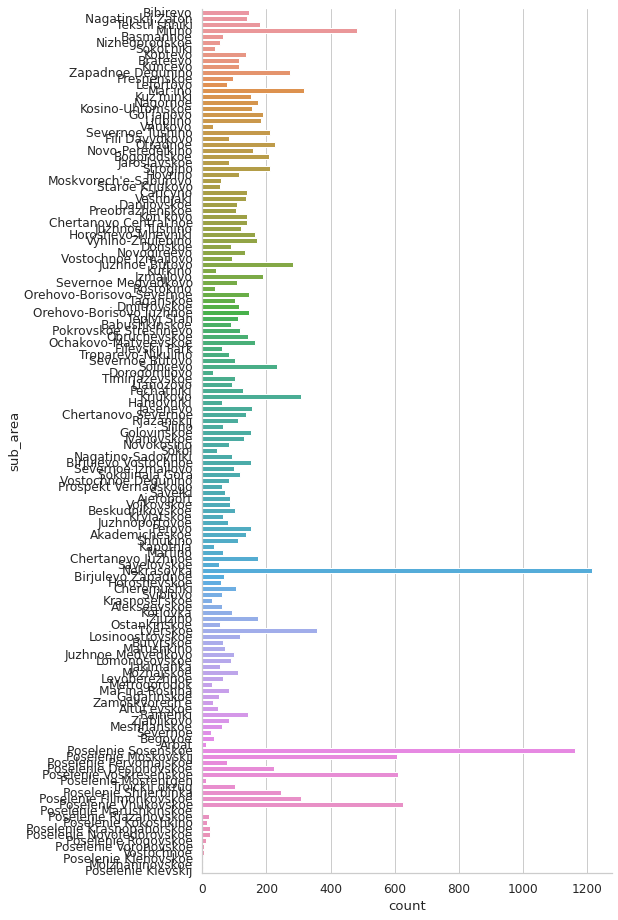

In [1175]:
# looking at values in these columns
# plt.figure(figsize=(15,20))
# for l in bad_object_cols:
g=sns.catplot(y='sub_area', kind='count', data=train_inputs)
g.fig.set_size_inches(15,15);


    Select categorical columns with relatively low cardinality(number of uniques values in a column)

In [1176]:
low_cardinality_cols=[col for col in train_inputs.columns if train_inputs[col].dtype=="object" and train_inputs[col].nunique() < 10]
low_cardinality_cols

['product_type',
 'culture_objects_top_25',
 'thermal_power_plant_raion',
 'incineration_raion',
 'oil_chemistry_raion',
 'radiation_raion',
 'railroad_terminal_raion',
 'big_market_raion',
 'nuclear_reactor_raion',
 'detention_facility_raion',
 'water_1line',
 'big_road1_1line',
 'railroad_1line',
 'ecology']

In [1177]:
high_cardinality_cols = [col for col in object_cols if col not in low_cardinality_cols]
high_cardinality_cols

['sub_area']

In [1178]:
# Do not use from sklearn.preprocessing import _BaseEncoder, it is protected class!
from sklearn.preprocessing._encoders import _BaseEncoder
class new_OrdinalEncoder(_BaseEncoder):
    def __init__(self,cat_index='all'):
        self.dicts={}
        # cate_index is the categorical feature index list
        self.cat_index=cat_index
     
    def fit(self,df,*y):
        if self.cat_index=='all':
            self.cat_index=list(range(df.shape[1]))
        for feat in self.cat_index:
            dic=np.unique(df.iloc[:,feat])
            dic=dict([(i,index) for index, i in enumerate(dic)])
            self.dicts[feat]=dic
             
    def fit_transform(self,df,*y):
        if self.cat_index=='all':
            self.cat_index=list(range(df.shape[1]))
        df_output=df.copy()
        for feat in self.cat_index:
            dic=np.unique(df.iloc[:,feat])
            dic=dict([(i,index) for index, i in enumerate(dic)])
            self.dicts[feat]=dic
            df_output.iloc[:,feat]=df.iloc[:,feat].apply(lambda x: dic[x])
        return df_output

    def transform(self,df):
        df_output=df.copy()
        for feat in self.cat_index:
            dic=self.dicts[feat]
            df_output.iloc[:,feat]=df.iloc[:,feat].apply(self.unknown_value,args=(dic,))
        return df_output
     
    def unknown_value(self,value,dic): # It will set up a new interger for unknown values!
        try:
            return dic[value]
        except:
            return len(dic)

In [1179]:
#apply OrdinalEncoder(new_OrdinalEncoder that can handle unknown values) on high_cardinality column
encoder = new_OrdinalEncoder()#(handle_unknown="use_encoded_value")
encoder.fit(train_inputs[high_cardinality_cols])

train_inputs[high_cardinality_cols] = encoder.transform(train_inputs[high_cardinality_cols])
valid_inputs[high_cardinality_cols] = encoder.transform(valid_inputs[high_cardinality_cols])
test_inputs[high_cardinality_cols] = encoder.transform(test_inputs[high_cardinality_cols])

In [1180]:
from sklearn.preprocessing import OrdinalEncoder,OneHotEncoder
#apply OneHotencoder to Low_cardinality feature
encoder = OneHotEncoder(handle_unknown="ignore",sparse=False).fit(train_inputs[low_cardinality_cols])
encoder_col = list(encoder.get_feature_names(low_cardinality_cols))
train_inputs[encoder_col] = encoder.transform(train_inputs[low_cardinality_cols])
valid_inputs[encoder_col] = encoder.transform(valid_inputs[low_cardinality_cols])
test_inputs[encoder_col] = encoder.transform(test_inputs[low_cardinality_cols])

In [1181]:
train_inputs

,full_sq_build_year,full_sq_max_floor,full_sq,full_sq_state,full_sq_floor,full_sq_area_m,full_sq_sub_area,full_sq_kitch_sq,num_room,life_sq,remain_living_area,remain_sq,full_sq_num_room,sport_count_5000,sport_count_3000,trc_count_5000,sport_count_2000,full_sq_life_sq,office_sqm_5000,sport_count_1500,trc_sqm_5000,kitch_sq,sport_objects_raion,trc_count_3000,cafe_count_5000_price_1000,cafe_count_5000_price_1500,cafe_count_5000,cafe_count_5000_na_price,cafe_count_5000_price_500,office_sqm_3000,cafe_count_5000_price_2500,trc_sqm_3000,office_count_5000,office_sqm_2000,church_count_5000,cafe_count_5000_price_high,sport_count_1000,cafe_count_5000_price_4000,leisure_count_5000,big_church_count_5000,...,radiation_raion,railroad_terminal_raion,big_market_raion,nuclear_reactor_raion,detention_facility_raion,water_1line,big_road1_1line,railroad_1line,ecology,product_type_Investment,product_type_OwnerOccupier,culture_objects_top_25_no,culture_objects_top_25_yes,thermal_power_plant_raion_no,thermal_power_plant_raion_yes,incineration_raion_no,incineration_raion_yes,oil_chemistry_raion_no,oil_chemistry_raion_yes,radiation_raion_no,radiation_raion_yes,railroad_terminal_raion_no,railroad_terminal_raion_yes,big_market_raion_no,big_market_raion_yes,nuclear_reactor_raion_no,nuclear_reactor_raion_yes,detention_facility_raion_no,detention_facility_raion_yes,water_1line_no,water_1line_yes,big_road1_1line_no,big_road1_1line_yes,railroad_1line_no,railroad_1line_yes,ecology_excellent,ecology_good,ecology_no data,ecology_poor,ecology_satisfactory
0,0.203341,0.161163,0.039216,0.040223,0.042513,0.053851,0.053851,0.148312,0.055556,0.083077,0.133333,0.023358,0.159273,0.238532,0.21,0.436975,0.20,0.046548,0.063563,0.189189,0.880304,0.105263,0.241379,0.348485,0.074074,0.062402,0.057467,0.068966,0.060000,0.041197,0.023873,0.534721,0.036755,0.052416,0.088,0.000000,0.24,0.027211,0.000000,0.086093,...,no,no,no,no,no,no,no,no,good,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
1,0.203341,0.161163,0.026611,0.027631,0.028068,0.036568,0.036568,0.148312,0.055556,0.058462,0.133333,0.021898,0.159273,0.302752,0.19,0.336134,0.22,0.042448,0.211812,0.243243,0.443780,0.105263,0.206897,0.212121,0.100309,0.056162,0.066919,0.051724,0.075385,0.134617,0.039788,0.185210,0.083650,0.045937,0.116,0.000000,0.08,0.020408,0.094340,0.099338,...,no,no,no,no,no,no,no,no,excellent,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
2,0.203341,0.161163,0.039216,0.040223,0.041554,0.054469,0.054469,0.148312,0.055556,0.089231,0.133333,0.020438,0.159273,0.307339,0.20,0.294118,0.16,0.040193,0.116371,0.162162,0.343037,0.105263,0.172414,0.106061,0.069444,0.039002,0.046125,0.057471,0.044615,0.018155,0.026525,0.019800,0.054499,0.027810,0.108,0.000000,0.20,0.020408,0.037736,0.072848,...,yes,no,no,no,no,no,no,no,poor,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.203341,0.161163,0.103641,0.104581,0.107601,0.106843,0.106843,0.148312,0.055556,0.153846,0.133333,0.056934,0.159273,0.119266,0.18,0.184874,0.26,0.068815,0.019222,0.243243,0.205470,0.105263,0.586207,0.181818,0.032407,0.023401,0.023062,0.022989,0.010769,0.027350,0.029178,0.077524,0.010139,0.003053,0.016,0.033333,0.12,0.013605,0.000000,0.026490,...,no,no,no,no,no,no,no,no,good,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
4,0.203341,0.161163,0.086835,0.087792,0.093158,0.089042,0.089042,0.148312,0.055556,0.236923,0.133333,0.000000,0.159273,0.894495,0.77,0.957983,0.42,0.043562,0.661671,0.378378,0.763946,0.105263,0.862069,0.909091,0.891975,0.861154,0.863138,0.821839,0.870769,0.560243,0.846154,0.865404,0.873257,0.451051,0.944,0.566667,0.28,0.734694,0.858491,0.894040,...,yes,yes,no,no,no,no,no,yes,excellent,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.

In [1182]:
jovian.commit()

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...
Committed successfully! https://jovian.ai/landryroni/ml-project-gbms


'https://jovian.ai/landryroni/ml-project-gbms'

##### Past prepared data to input data

In [1183]:
train_inputs = train_inputs[ numeric_cols + high_cardinality_cols + encoder_col]
valid_inputs = valid_inputs[ numeric_cols + high_cardinality_cols + encoder_col]
test_inputs = test_inputs[ numeric_cols + high_cardinality_cols + encoder_col]

In [1184]:
train_targets.shape,train_inputs.shape

((19443,), (19443, 268))

In [1185]:
train_inputs

,full_sq_build_year,full_sq_max_floor,full_sq,full_sq_state,full_sq_floor,full_sq_area_m,full_sq_sub_area,full_sq_kitch_sq,num_room,life_sq,remain_living_area,remain_sq,full_sq_num_room,sport_count_5000,sport_count_3000,trc_count_5000,sport_count_2000,full_sq_life_sq,office_sqm_5000,sport_count_1500,trc_sqm_5000,kitch_sq,sport_objects_raion,trc_count_3000,cafe_count_5000_price_1000,cafe_count_5000_price_1500,cafe_count_5000,cafe_count_5000_na_price,cafe_count_5000_price_500,office_sqm_3000,cafe_count_5000_price_2500,trc_sqm_3000,office_count_5000,office_sqm_2000,church_count_5000,cafe_count_5000_price_high,sport_count_1000,cafe_count_5000_price_4000,leisure_count_5000,big_church_count_5000,...,month,balance_trade,seats_theather_rfmin_per_100000_cap,weekofyear,mortgage_rate,dayofweek,micex,quarter,sub_area,product_type_Investment,product_type_OwnerOccupier,culture_objects_top_25_no,culture_objects_top_25_yes,thermal_power_plant_raion_no,thermal_power_plant_raion_yes,incineration_raion_no,incineration_raion_yes,oil_chemistry_raion_no,oil_chemistry_raion_yes,radiation_raion_no,radiation_raion_yes,railroad_terminal_raion_no,railroad_terminal_raion_yes,big_market_raion_no,big_market_raion_yes,nuclear_reactor_raion_no,nuclear_reactor_raion_yes,detention_facility_raion_no,detention_facility_raion_yes,water_1line_no,water_1line_yes,big_road1_1line_no,big_road1_1line_yes,railroad_1line_no,railroad_1line_yes,ecology_excellent,ecology_good,ecology_no data,ecology_poor,ecology_satisfactory
0,0.203341,0.161163,0.039216,0.040223,0.042513,0.053851,0.053851,0.148312,0.055556,0.083077,0.133333,0.023358,0.159273,0.238532,0.21,0.436975,0.20,0.046548,0.063563,0.189189,0.880304,0.105263,0.241379,0.348485,0.074074,0.062402,0.057467,0.068966,0.060000,0.041197,0.023873,0.534721,0.036755,0.052416,0.088,0.000000,0.24,0.027211,0.000000,0.086093,...,0.636364,0.292113,1.00000,0.627451,0.295302,0.833333,0.511302,0.666667,9,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
1,0.203341,0.161163,0.026611,0.027631,0.028068,0.036568,0.036568,0.148312,0.055556,0.058462,0.133333,0.021898,0.159273,0.302752,0.19,0.336134,0.22,0.042448,0.211812,0.243243,0.443780,0.105263,0.206897,0.212121,0.100309,0.056162,0.066919,0.051724,0.075385,0.134617,0.039788,0.185210,0.083650,0.045937,0.116,0.000000,0.08,0.020408,0.094340,0.099338,...,0.636364,0.292113,1.00000,0.647059,0.295302,0.166667,0.524942,0.666667,70,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
2,0.203341,0.161163,0.039216,0.040223,0.041554,0.054469,0.054469,0.148312,0.055556,0.089231,0.133333,0.020438,0.159273,0.307339,0.20,0.294118,0.16,0.040193,0.116371,0.162162,0.343037,0.105263,0.172414,0.106061,0.069444,0.039002,0.046125,0.057471,0.044615,0.018155,0.026525,0.019800,0.054499,0.027810,0.108,0.000000,0.20,0.020408,0.037736,0.072848,...,0.636364,0.292113,1.00000,0.647059,0.295302,0.833333,0.562354,0.666667,127,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.203341,0.161163,0.103641,0.104581,0.107601,0.106843,0.106843,0.148312,0.055556,0.153846,0.133333,0.056934,0.159273,0.119266,0.18,0.184874,0.26,0.068815,0.019222,0.243243,0.205470,0.105263,0.586207,0.181818,0.032407,0.023401,0.023062,0.022989,0.010769,0.027350,0.029178,0.077524,0.010139,0.003053,0.016,0.033333,0.12,0.013605,0.000000,0.026490,...,0.727273,0.284138,1.00000,0.666667,0.348993,0.500000,0.797902,0.666667,65,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
4,0.203341,0.161163,0.086835,0.087792,0.093158,0.089042,0.089042,0.148312,0.055556,0.236923,0.133333,0.000000,0.159273,0.894495,0.77,0.957983,0.42,0.043562,0.661671,0.378378,0.763946,0.105263,0.862069,0.909091,0.891975,0.861154,0.863138,0.821839,0.870769,0.560243,0.846154,0.865404,0.873257,0.451051,0

#### Features Selection

    Find feature with most positive impact on the prediction

In [1140]:
from sklearn.linear_model import Lasso
from sklearn.feature_selection import SelectFromModel
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler,LabelEncoder,OneHotEncoder,OrdinalEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestRegressor 

    Define pipeline for feature selection, Using Lasso Regressor

In [1141]:
# numerical_transfromer = Pipeline(steps=[
#                                         ("impute",SimpleImputer()),
#                                         ("scaler",MinMaxScaler())
# ])

# categorical_transformer = Pipeline(steps=[
#                                           ("impute",SimpleImputer(strategy='constant',fill_value='missing')),
#                                           ("encoder",OrdinalEncoder(handle_unknown="use_encoded_value", unknown_value=-999))
# ])

# preprocessor = ColumnTransformer(
#     transformers=[
#                  ("numerical",numerical_transfromer,numeric_features),
#                  ("categorical",categorical_transformer,categorical_features)
#     ]
# )

# mypipeline = Pipeline(
#     steps=[
#            ("preprocessor",preprocessor),
#            ("model",RandomForestRegressor())
#     ]
# )

#####################
# define the input, here we will apply features selection only on train set

# def feature_selection(x,y,model):
#   df = x.copy()
#   df["price_doc"] = np.log(y)
#   # split train and valid
#   size = len(df)
#   train_size = int(.8 * size)
#   # print(df.columns)
#   data = df.sort_values("year")
#   train_df,valid_df = data[:train_size],data[train_size:]
#   X_train,y_train = train_df.drop(columns=['price_doc'],axis=1),train_df['price_doc']
#   X_valid,y_valid = valid_df.drop(columns=['price_doc'],axis=1),valid_df['price_doc']
#   print("train date",X_train.year.min(),X_train.year.max())
#   print("test date",X_valid.year.min(),X_valid.year.max())
#   model.fit(X_train,y_train)
#   # feature_index = model.named_steps.model.get_support()
#   return model
################
# X = train_df[numeric_features+categorical_features]
# y = train_targets
# model = feature_selection(X,y,mypipeline)
# feature_index= model.named_steps.model.get_support()

###### Importance

In [1142]:
from rfpimp import *
from rfpimp import * 
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor


def feat_importance(data,targets):
  df = data.copy()
  # attentuate affect of outliers in price 
  df["price_doc"]=np.log(targets)
  
  # print("hi")
  # size = len(df) 
  train_size = np.int64(.80 * len(df) )
  # print(train_size)
  sort_by_year = df.sort_values("year")
  # print(sort_by_year.shape)
  X_train, X_test  = sort_by_year[:train_size],sort_by_year[train_size:]
  y_train,y_test = X_train["price_doc"],X_test["price_doc"]

  X_train = X_train.drop(columns=['price_doc'],axis=1)#, df_train['price_doc'] 
  X_test= X_test.drop(columns=['price_doc'],axis=1)#, df_test['price_doc'] 
  
  rf = GradientBoostingRegressor()#RandomForestRegressor() 
  rf.fit(X_train, y_train) 
  imp = importances(rf, X_test, y_test) # permutation viz = 
  plot_importances(imp) 
  # viz.view()
  return imp

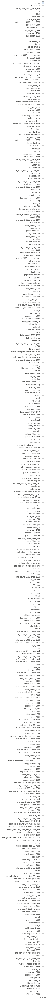

In [1143]:
feature_importance = feat_importance(train_inputs,train_targets)

In [1155]:
selected_col_2 = train_inputs.columns[feature_importance.Importance> 0]
# selected_feature_col =[col for col in selected_col["Feature"]]
# print(len(selected_feature_col))
print(len(selected_col_2))
selected_col_2

132


Index(['full_sq_build_year', 'full_sq_max_floor', 'full_sq', 'full_sq_state',
       'full_sq_floor', 'full_sq_area_m', 'full_sq_sub_area',
       'full_sq_kitch_sq', 'num_room', 'life_sq',
       ...
       'leisure_count_1500', 'gdp_annual', 'cafe_count_1500',
       'mosque_count_1500', 'floor', 'floor_down', 'cafe_count_1000_na_price',
       'market_count_2000', 'max_floor', 'cafe_count_1500_price_1500'],
      dtype='object', length=132)

In [1186]:
non_same=[col for col in selected_col_1 if col not in selected_col_2]
print(len(non_same))
non_same

105


['mosque_count_2000',
 'leisure_count_3000',
 'school_education_centers_top_20_raion',
 'cafe_count_1500_price_500',
 'cafe_count_1000',
 'mosque_count_1000',
 'cafe_avg_price_1500',
 'cafe_sum_1500_max_price_avg',
 'cafe_count_500_price_500',
 'mosque_count_3000',
 'cafe_sum_1500_min_price_avg',
 'build_count_before_1920',
 'cafe_sum_2000_max_price_avg',
 'leisure_count_1000',
 'cafe_avg_price_2000',
 'sport_count_500',
 'rent_price_2room_bus',
 'cafe_sum_2000_min_price_avg',
 'rent_price_1room_bus',
 'cafe_sum_1000_min_price_avg',
 'church_count_2000',
 'cafe_count_2000_price_4000',
 'cafe_count_1000_price_2500',
 'big_church_count_1000',
 'trc_sqm_1500',
 'market_count_1500',
 'cafe_avg_price_1000',
 'room_size',
 'eurrub',
 'micex_cbi_tr',
 'ID_railroad_terminal',
 'rent_price_3room_bus',
 'prom_part_5000',
 'leisure_count_2000',
 'trc_count_1000',
 'cafe_count_1000_price_500',
 'cafe_sum_1000_max_price_avg',
 'rent_price_3room_eco',
 'usdrub',
 'big_church_count_2000',
 'gdp_quart

In [1188]:
X_train = train_inputs#[selected_col_1]
X_valid = valid_inputs#[selected_col_1]
X_test = test_inputs#[selected_col_1]

In [1190]:
X_train.shape ,len(train_targets)

((19443, 268), 19443)

#### Model Training

##### Accurate model quality

    In this project we will use 3 type of evaluations metrics which are Root-Mean-Square-Error(RMSE), Mean-Absolute-Error(MAE) and cross_validation_score

In [1191]:
# here we will use cross-validation
from sklearn.metrics import mean_squared_error, mean_absolute_error,r2_score
from sklearn.model_selection import cross_val_score

#better define a function for it in which  multiply by -1 since sklearn calculates *negative* MAE

def crvalidation(model,X_train,y):
  score = -1* cross_val_score(model, X_train, y,
                             cv=5,scoring="neg_mean_absolute_error")
  score = score.mean()
  # print("Average MAE score after experiments:")
  return score

def evaluation_metrics(model,X_train,y,y_pred):
  MAE = round(mean_absolute_error(y,y_pred),2)
  RMSE = round(mean_squared_error(y,y_pred,squared=False),2)
  CVE = round(crvalidation(model,X_train,y),2)
  score = model.score(X_train,y)
  df = pd.DataFrame({
      "RMSE":RMSE,
      "MAE":MAE,
      "Average MAE":CVE,
      "Score":score
  }, index=[0])
  return df


def RF_evaluation_metrics(model,X_train,y,y_pred):
  MAE = round(mean_absolute_error(y,y_pred),2)
  RMSE = round(mean_squared_error(y,y_pred,squared=False),2)
  
  score = model.score(X_train,y)
  df = pd.DataFrame({
      "RMSE":RMSE,
      "MAE":MAE,
      "Score":score
  }, index=[0])
  return df

def test(models, data, iterations = 100):
    results = {}
    for i in models:
        r2_train = []
        r2_test = []
        for j in range(iterations):
            r2_test.append(r2_score(y_test,models[i].fit(X_train,y_train).predict(X_test)))
                                                                    
            r2_train.append(r2_score(y_train,models[i].fit(X_train, y_train).predict(X_train)))
                                                                                           
        results[i] = [np.mean(r2_train), np.mean(r2_test)]
    return pd.DataFrame(results)

def fit_score_model(model, x_train, y_train, x_test, y_test, features, target):
    features_list.append(features)
    target_list.append(target)
    regressor_list.append(str(regressor))
    
    reg = model
    reg.fit(x_train, y_train)
    
    y_reg_train = reg.predict(x_train)
    y_reg_test = reg.predict(x_test)

    return y_reg_train, y_reg_test


##### Training Baseline model

In [1192]:
#build a simple checking model that return the mean and median
def return_mm(df):
  #r_m = np.full(len(df),train.price_doc.mean())
  r_m = np.full(len(df),train.price_doc.median())
  return r_m

In [1193]:
simple_train_pred = return_mm(X_train)
simple_train_pred

array([6000000., 6000000., 6000000., ..., 6000000., 6000000., 6000000.])

In [1194]:
def cheking_pred(df):
  min_p,max_p = train.price_doc.min(),train.price_doc.max()
  return (np.random.random(len(df))*(max_p-min_p))+ min_p

In [1195]:
check_train_pred = cheking_pred(X_train)
check_train_pred

array([23563746.09709065, 45139595.10997996, 86186944.89742117, ...,
       15123355.95998749, 22083391.54718285, 38093755.78740285])

    Evaluation using MSE(mean_squared_error)

In [1196]:
mean_squared_error(simple_train_pred,train_targets,squared=False)

4482027.949572852

In [1197]:
mean_squared_error(return_mm(X_valid),valid_targets,squared=False)

5232074.479233564

    It seems thta we are very far from prediction median give better result than mean()

In [1198]:
mean_squared_error(check_train_pred,train_targets,squared=False),mean_squared_error(cheking_pred(X_valid),valid_targets,squared=False)

(47233072.00267515, 45523707.94893099)

In [1199]:
mean_absolute_error(check_train_pred,train_targets),mean_absolute_error(cheking_pred(X_valid),valid_targets)

(39736940.986825846, 38619347.05652274)

In [1200]:
jovian.commit()

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...
Committed successfully! https://jovian.ai/landryroni/ml-project-gbms


'https://jovian.ai/landryroni/ml-project-gbms'

##### Linear Model

In [1201]:
from sklearn.linear_model import LinearRegression,Lasso

print("Linear Fitting")
LR = LinearRegression()

Linear Fitting


In [1202]:
%%time
LR.fit(X_train,train_targets)

CPU times: user 392 ms, sys: 40.1 ms, total: 432 ms
Wall time: 257 ms


LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [1203]:
%%time
print("Linear predict")
lr_train_pred = LR.predict(X_train)

Linear predict
CPU times: user 14.2 ms, sys: 15 ms, total: 29.2 ms
Wall time: 17.2 ms


In [1204]:
lr_train_pred

array([5309286.50287569, 5524910.03819148, 5282569.27046384, ...,
       7579599.9986499 , 4675128.5217155 , 5277844.65044802])

In [1205]:
lr_valid_pred = LR.predict(X_valid)
lr_valid_pred

array([ 4884579.3899658 , 13677736.21705337,  6557815.68810579, ...,
        9643151.82207321,  5798140.25319094,  6654217.78993227])

In [1206]:
lr_train = evaluation_metrics(LR,X_train,train_targets,lr_train_pred)
print("Linear regression on training give")
lr_train

Linear regression on training give


,RMSE,MAE,Average MAE,Score
0,2878898.23,1681734.22,1788964.23,0.575169


In [1207]:
lr_valid = evaluation_metrics(LR,X_valid,valid_targets,LR.predict(X_valid))
print("Linear regression on validation give")
lr_valid

Linear regression on validation give


,RMSE,MAE,Average MAE,Score
0,3221338.31,1971517.58,1958570.01,0.578491


    Linear regression reduce from 4.6M to 3.55M on training set, and 5M to 4.1M on validation set

#####**DecisionTree**

In [1208]:
from sklearn.tree import DecisionTreeRegressor
#
ds = DecisionTreeRegressor(random_state=17)

In [1209]:
%%time 
#
ds.fit(X_train,train_targets)

CPU times: user 3.36 s, sys: 63 ms, total: 3.43 s
Wall time: 3.4 s


DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=17, splitter='best')

In [1210]:

ds_train_pred = ds.predict(X_train)
ds_train_pred

array([5850000., 6000000., 5700000., ..., 8492570., 5500000., 5300000.])

In [1211]:
ds_valid_pred = ds.predict(X_valid)
ds_valid_pred

array([ 4677427., 13500000.,  5565218., ...,  8200170.,  4950000.,
        7400000.])

In [1212]:
dt_train = evaluation_metrics(ds,X_train,train_targets,ds_train_pred)
print("Decision Tree on training give")
dt_train

Decision Tree on training give


,RMSE,MAE,Average MAE,Score
0,4267.93,102.21,2093039.58,0.999999


In [1213]:
dt_valid = evaluation_metrics(ds,X_valid,valid_targets,ds_valid_pred)
print("Decision Tree on validation give")
dt_valid

Decision Tree on validation give


,RMSE,MAE,Average MAE,Score
0,3533957.45,2033159.67,2116743.49,0.492709


Observation 
 
    we can observe that the LinearRegressor model did better than Decision tree on validation set, its obvious we are facing overfitting

In [1214]:
#ds.feature_importances_
ds_feature_importance = pd.DataFrame({
    "features":X_train.columns,
    "score":ds.feature_importances_
}).sort_values(by="score",ascending=False)

In [1215]:
ds_feature_importance

,features,score
2,full_sq,0.298547
3,full_sq_state,0.113975
18,office_sqm_5000,0.074428
30,cafe_count_5000_price_2500,0.035906
110,cafe_count_2000,0.032139
...,...,...
246,oil_chemistry_raion_yes,0.000000
245,oil_chemistry_raion_no,0.000000
244,incineration_raion_yes,0.000000
196,cafe_count_500_price_high,0.000000


In [1216]:
jovian.commit()

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...
Committed successfully! https://jovian.ai/landryroni/ml-project-gbms


'https://jovian.ai/landryroni/ml-project-gbms'

##### **RandomForestRegressor**

In [1217]:
from sklearn.ensemble import RandomForestRegressor

In [1218]:
#define random forest model
rf = RandomForestRegressor(random_state=17,n_jobs=-1)


In [1219]:
%%time
#
rf.fit(X_train,train_targets)

CPU times: user 4min 12s, sys: 183 ms, total: 4min 12s
Wall time: 2min 8s


RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=-1, oob_score=False,
                      random_state=17, verbose=0, warm_start=False)

In [1220]:
rf_train_pred = rf.predict(X_train)
rf_valid_pred = rf.predict(X_valid)

In [1221]:
rf_train = RF_evaluation_metrics(rf,X_train,train_targets,rf_train_pred)
print("Random Forest on training give")
rf_train

Random Forest on training give


,RMSE,MAE,Score
0,975362.07,520641.65,0.951236


In [1222]:
rf_valid = RF_evaluation_metrics(rf,X_valid,valid_targets,rf_valid_pred)
print("Random Forest on testing give")
rf_valid

Random Forest on training give


,RMSE,MAE,Score
0,2539444.71,1538399.82,0.738054


Obersevation 
    
    RandomForestRegressor did more better than DecisionTree which is a singke Tree on training set we went fro 4.6M to 1.04M and 4.2M to 3.18M on validation set

In [1223]:
jovian.commit()

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...
Committed successfully! https://jovian.ai/landryroni/ml-project-gbms


'https://jovian.ai/landryroni/ml-project-gbms'

##### **XGBoot**

In [1224]:
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor

In [1225]:
xg = XGBRegressor(random_state=17,n_jobs=-1)

In [1226]:
%%time
xg.fit(X_train,train_targets)

[21:48:23] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
CPU times: user 14.1 s, sys: 29.2 ms, total: 14.1 s
Wall time: 7.24 s


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
             n_jobs=-1, nthread=None, objective='reg:linear', random_state=17,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

In [1227]:
xg_train_pred = xg.predict(X_train)
xg_valid_pred = xg.predict(X_valid)

In [1228]:
xg_train = evaluation_metrics(xg,X_train,train_targets,xg_train_pred)
print("xgboot Tree on training give")
xg_train

[21:48:30] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:48:36] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:48:42] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:48:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:48:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
xgboot Tree on training give


,RMSE,MAE,Average MAE,Score
0,2304538.73,1410540.99,1531826.23,0.727773


In [1229]:
xg_valid = evaluation_metrics(xg,X_valid,valid_targets,xg_valid_pred)
print("xgboot Tree on validation give")
xg_valid

[21:49:00] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:49:02] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:49:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:49:05] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:49:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
xgboot Tree on validation give


,RMSE,MAE,Average MAE,Score
0,2681110.73,1639397.88,1496388.75,0.708013


In [1230]:
jovian.commit()

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...
Committed successfully! https://jovian.ai/landryroni/ml-project-gbms


'https://jovian.ai/landryroni/ml-project-gbms'

##### **LGBM**

In [1231]:
from lightgbm import LGBMRegressor
#define light
lgbm = LGBMRegressor()

In [1232]:
%%time

lgbm.fit(X_train,train_targets,eval_set=((X_valid,valid_targets)),verbose=-1,early_stopping_rounds = 1000)

Training until validation scores don't improve for 1000 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 6.45472e+12
CPU times: user 4.66 s, sys: 44.7 ms, total: 4.71 s
Wall time: 2.47 s


LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
              random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

In [1233]:
lgbm_train_pred = lgbm.predict(X_train)
lgbm_train_pred

array([5132989.77527355, 5302178.30164485, 5068326.74295854, ...,
       6880080.91099428, 5596265.82923667, 5188756.56324441])

In [1234]:
lgbm_valid_pred = lgbm.predict(X_valid)
lgbm_valid_pred

array([ 4975416.4050013 , 18784464.78321832,  5890365.78588904, ...,
        8041246.48633062,  6766930.97819628,  6742579.60820507])

In [1235]:
lgbm_train = evaluation_metrics(lgbm,X_train,train_targets,lgbm_train_pred)
print("LightGBM Tree on training give")
lgbm_train

LightGBM Tree on training give


,RMSE,MAE,Average MAE,Score
0,1813439.13,1150291.64,1475113.71,0.831434


In [1236]:
lgbm_valid = evaluation_metrics(lgbm,X_valid,valid_targets,lgbm_valid_pred)
print("LightGBM Tree on training give")
lgbm_valid

LightGBM Tree on training give


,RMSE,MAE,Average MAE,Score
0,2540613.99,1531380.14,1474925.49,0.737813


In [1237]:
X_train

,full_sq_build_year,full_sq_max_floor,full_sq,full_sq_state,full_sq_floor,full_sq_area_m,full_sq_sub_area,full_sq_kitch_sq,num_room,life_sq,remain_living_area,remain_sq,full_sq_num_room,sport_count_5000,sport_count_3000,trc_count_5000,sport_count_2000,full_sq_life_sq,office_sqm_5000,sport_count_1500,trc_sqm_5000,kitch_sq,sport_objects_raion,trc_count_3000,cafe_count_5000_price_1000,cafe_count_5000_price_1500,cafe_count_5000,cafe_count_5000_na_price,cafe_count_5000_price_500,office_sqm_3000,cafe_count_5000_price_2500,trc_sqm_3000,office_count_5000,office_sqm_2000,church_count_5000,cafe_count_5000_price_high,sport_count_1000,cafe_count_5000_price_4000,leisure_count_5000,big_church_count_5000,...,month,balance_trade,seats_theather_rfmin_per_100000_cap,weekofyear,mortgage_rate,dayofweek,micex,quarter,sub_area,product_type_Investment,product_type_OwnerOccupier,culture_objects_top_25_no,culture_objects_top_25_yes,thermal_power_plant_raion_no,thermal_power_plant_raion_yes,incineration_raion_no,incineration_raion_yes,oil_chemistry_raion_no,oil_chemistry_raion_yes,radiation_raion_no,radiation_raion_yes,railroad_terminal_raion_no,railroad_terminal_raion_yes,big_market_raion_no,big_market_raion_yes,nuclear_reactor_raion_no,nuclear_reactor_raion_yes,detention_facility_raion_no,detention_facility_raion_yes,water_1line_no,water_1line_yes,big_road1_1line_no,big_road1_1line_yes,railroad_1line_no,railroad_1line_yes,ecology_excellent,ecology_good,ecology_no data,ecology_poor,ecology_satisfactory
0,0.203341,0.161163,0.039216,0.040223,0.042513,0.053851,0.053851,0.148312,0.055556,0.083077,0.133333,0.023358,0.159273,0.238532,0.21,0.436975,0.20,0.046548,0.063563,0.189189,0.880304,0.105263,0.241379,0.348485,0.074074,0.062402,0.057467,0.068966,0.060000,0.041197,0.023873,0.534721,0.036755,0.052416,0.088,0.000000,0.24,0.027211,0.000000,0.086093,...,0.636364,0.292113,1.00000,0.627451,0.295302,0.833333,0.511302,0.666667,9,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
1,0.203341,0.161163,0.026611,0.027631,0.028068,0.036568,0.036568,0.148312,0.055556,0.058462,0.133333,0.021898,0.159273,0.302752,0.19,0.336134,0.22,0.042448,0.211812,0.243243,0.443780,0.105263,0.206897,0.212121,0.100309,0.056162,0.066919,0.051724,0.075385,0.134617,0.039788,0.185210,0.083650,0.045937,0.116,0.000000,0.08,0.020408,0.094340,0.099338,...,0.636364,0.292113,1.00000,0.647059,0.295302,0.166667,0.524942,0.666667,70,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
2,0.203341,0.161163,0.039216,0.040223,0.041554,0.054469,0.054469,0.148312,0.055556,0.089231,0.133333,0.020438,0.159273,0.307339,0.20,0.294118,0.16,0.040193,0.116371,0.162162,0.343037,0.105263,0.172414,0.106061,0.069444,0.039002,0.046125,0.057471,0.044615,0.018155,0.026525,0.019800,0.054499,0.027810,0.108,0.000000,0.20,0.020408,0.037736,0.072848,...,0.636364,0.292113,1.00000,0.647059,0.295302,0.833333,0.562354,0.666667,127,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.203341,0.161163,0.103641,0.104581,0.107601,0.106843,0.106843,0.148312,0.055556,0.153846,0.133333,0.056934,0.159273,0.119266,0.18,0.184874,0.26,0.068815,0.019222,0.243243,0.205470,0.105263,0.586207,0.181818,0.032407,0.023401,0.023062,0.022989,0.010769,0.027350,0.029178,0.077524,0.010139,0.003053,0.016,0.033333,0.12,0.013605,0.000000,0.026490,...,0.727273,0.284138,1.00000,0.666667,0.348993,0.500000,0.797902,0.666667,65,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
4,0.203341,0.161163,0.086835,0.087792,0.093158,0.089042,0.089042,0.148312,0.055556,0.236923,0.133333,0.000000,0.159273,0.894495,0.77,0.957983,0.42,0.043562,0.661671,0.378378,0.763946,0.105263,0.862069,0.909091,0.891975,0.861154,0.863138,0.821839,0.870769,0.560243,0.846154,0.865404,0.873257,0.451051,0

In [1238]:
jovian.commit()

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...
Committed successfully! https://jovian.ai/landryroni/ml-project-gbms


'https://jovian.ai/landryroni/ml-project-gbms'

In this part we performe the below step of feature engineering:

     1. Missing values
     2. Temporal variables
     3. Categorical variables; removing rare labels
     4. Standarize the values of the variables to the same range

### **Model Hyperparameters tuning**

price_doc: sale price (this is the target variable)

id: transaction id

timestamp: date of transaction

full_sq: total area in square meters, including loggias, balconies and other non-residential areas

life_sq: living area in square meters, excluding loggias, balconies and other non-residential areas

floor: for apartments, floor of the building

max_floor: number of floors in the building

material: wall material

build_year: year built

num_room: number of living rooms

kitch_sq: kitchen area

state: apartment condition

product_type: owner-occupier purchase or investment

sub_area: name of the district

In [1239]:
jovian.commit()

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...
Committed successfully! https://jovian.ai/landryroni/ml-project-gbms


'https://jovian.ai/landryroni/ml-project-gbms'

In [1240]:
submission_df.price_doc = rf.predict(X_test)

In [1241]:
submission_df

,id,price_doc
0,30474,5332239.42
1,30475,8327647.95
2,30476,5156078.70
3,30477,6103889.81
4,30478,4545743.67
...,...,...
7657,38131,7558620.59
7658,38132,4762971.87
7659,38133,4539166.04
7660,38134,4745594.00


In [1242]:
submission_df.to_csv('submission_RF.csv',index=False)

In [ ]:
# from patsy import dmatrices,dmatrix
# import statsmodels.api as sam
# from statsmodels.stats.outliers_influence import variance_inflation_factor


# price_doc = train_data[["timestamp","price_doc"]]
# fusion_df = impact_macro.merge(price_doc,on="timestamp",how="left").drop(columns=["timestamp"])#.rename(columns ={"rent_price_4+room_bus":"rent_price_4room_bus"},inplace=False)
# #factorize object columns

# # df_num = fusion_df.select_dtypes(exclude=["object"])
# # df_object = fusion_df.select_dtypes(include=["object"]).copy()
# # df_object.sample()
# # # for c in df_object:
# # #   df_object[c]=pd.factorize(df_object[c])[0]
# def fillnan(data):

#   df = data.copy()
#   for col in df.columns:
#     median = df[col].median()
#     df[col].fillna(median,inplace=True)
#   return df

# # df_new = pd.concat([df_num,df_object],axis=1)
# fusion_df =fillnan(fusion_df)
# fusion_df
# ##vif dataframe
# vif_data = pd.DataFrame()
# vif_data['feature'] = fusion_df.columns
# #calculating vif for each feature
# vif_data["vif"] = [variance_inflation_factor(fusion_df.values,i) for i in range(len(fusion_df.columns))]
# vif_data


In [ ]:
def test(models, data, iterations = 100):
    results = {}
    for i in models:
        r2_train = []
        r2_test = []
        for j in range(iterations):
            X_train, X_test, y_train, y_test = train_test_split(data[X], 
                                                                data[Y], 
                                                                test_size= 0.2)
            r2_test.append(metrics.r2_score(y_test,
                                            models[i].fit(X_train, 
                                                         y_train).predict(X_test)))
            r2_train.append(metrics.r2_score(y_train, 
                                             models[i].fit(X_train, 
                                                          y_train).predict(X_train)))
        results[i] = [np.mean(r2_train), np.mean(r2_test)]
    return pd.DataFrame(results)


models = {'OLS': linear_model.LinearRegression(),
         'Lasso': linear_model.Lasso(),
         'Ridge': linear_model.Ridge(),}

In [ ]:
lasso_params = {'alpha':[0.02, 0.024, 0.025, 0.026, 0.03]}
ridge_params = {'alpha':[200, 230, 250,265, 270, 275, 290, 300, 500]}

models2 = {'OLS': linear_model.LinearRegression(),
           'Lasso': GridSearchCV(linear_model.Lasso(), 
                               param_grid=lasso_params).fit(df[X], df[Y]).best_estimator_,
           'Ridge': GridSearchCV(linear_model.Ridge(), 
                               param_grid=ridge_params).fit(df[X], df[Y]).best_estimator_,}

In [ ]:
asso_params = {'fit__alpha':[0.005, 0.02, 0.03, 0.05, 0.06]}
ridge_params = {'fit__alpha':[550, 580, 600, 620, 650]}

pipe1 = Pipeline([('poly', PolynomialFeatures()),
                 ('fit', linear_model.LinearRegression())])
pipe2 = Pipeline([('poly', PolynomialFeatures()),
                 ('fit', linear_model.Lasso())])
pipe3 = Pipeline([('poly', PolynomialFeatures()),
                 ('fit', linear_model.Ridge())])

models3 = {'OLS': pipe1,
           'Lasso': GridSearchCV(pipe2, 
                                 param_grid=lasso_params).fit(df[X], df[Y]).best_estimator_ ,
           'Ridge': GridSearchCV(pipe3, 
                                 param_grid=ridge_params).fit(df[X], df[Y]).best_estimator_,}

In [ ]:
https://www.kaggle.com/olgabelitskaya/sberbank-russian-housing-market

In [ ]:
class DataFrameSelector(BaseEstimator, TransformerMixin):
    def __init__(self, include=None, exclude=None):
        if include is None and exclude is None:
            raise AttributeError('Include / exclude need to be set')
        self.include = include
        self.exclude = exclude
        
    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        if self.include:
            self.columns_ = X.select_dtypes(include=self.include).columns
        elif self.exclude:
            self.columns_ = X.select_dtypes(exclude=self.exclude).columns
        return X[self.columns_]


num_pipeline = Pipeline([
    ('selector', DataFrameSelector(exclude=np.object)),
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

cat_pipeline = Pipeline([
    ('selector', DataFrameSelector(include=np.object)),
    ('imputer', SimpleImputer(stra



In [118]:
from sklearn.compose import make_column_selector as selector

preprocessor = ColumnTransformer(transformers=[
    ('num', numeric_transformer, selector(dtype_exclude="category")),
    ('cat', categorical_transformer, selector(dtype_include="category"))

SyntaxError: ignored

For practical reasons, I have chosen the following:
1) the dollar rate, which traditionally affects the Russian real estate market,
2) the distance in km from the Kremlin (the closer to the center of the city, the more expensive),
3) indicators characterizing the availability of urban infrastructure nearby (schools, medical and sports centers, supermarkets, etc.)
4) indicators of a particular living space (number of rooms, floor, etc.),
5) proximity to transport nodes (for example, to the metro),
6) indicators of population density and employment in the region of housing accommodation.

In [1015]:
jovian.commit()

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...
Committed successfully! https://jovian.ai/landryroni/ml-project-gbms


'https://jovian.ai/landryroni/ml-project-gbms'